# MULTICLASS INFERENCE OF URBAN CYCLING TRIP PURPOSES USING GEOSPATIAL HEXAGONAL AGGREGATION: A POST-PANDEMIC ANALYSIS OF LONDON CYCLE HIRE PATTERNS

## Requirements.txt

In [ ]:
pip install -r requirements.txt

## Import Relevant Libraries 

In [ ]:
# Standard Library Imports
from pathlib import Path
from typing import Dict, List, Optional, Set, Tuple, Union
import os
import time
import xml.etree.ElementTree as ET

# Core Scientific Stack
import numpy as np
import pandas as pd
import geopandas as gpd

# Geospatial & Geometry
import h3
import h3pandas  # pandas <-> H3 helpers
import pyproj
from shapely.geometry import Point, Polygon, box

# Web, I/O, and OSM
import requests
from geopy.geocoders import Nominatim
from pyrosm import OSM

# Spatial Analysis Utilities
from scipy.spatial import cKDTree
from scipy.stats import kurtosis, skew

# Machine Learning
import shap
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import (
    mean_absolute_error,
    mean_squared_error,
    r2_score,
    make_scorer,
)
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV, train_test_split
from sklearn.multioutput import MultiOutputRegressor

# Plotting & Visualization
import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns
from contextily import plot_map as _unused_ctx_plot  # keeps contextily imported
import contextily as ctx
from matplotlib.colors import TwoSlopeNorm
from matplotlib.lines import Line2D
from matplotlib.patches import FancyArrowPatch
from matplotlib.ticker import FuncFormatter
from matplotlib_scalebar.scalebar import ScaleBar

## Section: Data Loading – Historical TfL Cycle Hire Data

This section loads 8 historical CSV files containing cycling trip records from August to November 2024.

Each file is read from the specified directory and tagged with a `source_file` column to trace its origin.

The function `load_trip_data()` is designed to be modular and reusable. It will safely warn you if any file is missing and halt execution if none are valid.

Outputs:  
- A concatenated `df_trips` DataFrame for downstream processing  
- Each row includes trip metadata and source filename


In [2]:
def load_trip_data(file_names: List[str], directory: Path) -> pd.DataFrame:
    """
    Load and concatenate multiple cycling trip CSV files from a given directory.
    Adds a 'source_file' column so we know where each row came from.
    """
    all_dfs = []  # collect all the individual dataframes here

    for file in file_names:
        file_path = directory / file
        if file_path.exists():
            # read file into pandas
            df = pd.read_csv(file_path)
            df['source_file'] = file  # tag each row with its source file
            all_dfs.append(df)
        else:
            # if file is missing, just print a warning instead of crashing
            print(f"Warning: File not found - {file_path}")

    if not all_dfs:
        # fail safely if nothing was loaded at all
        raise FileNotFoundError("No valid trip files were loaded.")

    # combine everything into one big dataframe
    return pd.concat(all_dfs, ignore_index=True)



# base folder containing all trip CSVs
trip_data_dir = Path("../data/Historical Data 2/")

# list of all bi-weekly TfL trip extract filenames
trip_filenames = [
    "387JourneyDataExtract01Jan2024-14Jan2024.csv",
    "388JourneyDataExtract15Jan2024-31Jan2024.csv",
    "389JourneyDataExtract01Feb2024-14Feb2024.csv",
    "390JourneyDataExtract15Feb2024-29Feb2024.csv",
    "391JourneyDataExtract01Mar2024-14Mar2024.csv",
    "392JourneyDataExtract15Mar2024-31Mar2024.csv",
    "393JourneyDataExtract01Apr2024-14Apr2024.csv",
    "394JourneyDataExtract15Apr2024-30Apr2024.csv",
    "395JourneyDataExtract01May2024-14May2024.csv",
    "396JourneyDataExtract15May2024-31May2024.csv",
    "397JourneyDataExtract01Jun2024-14Jun2024.csv",
    "398JourneyDataExtract15Jun2024-30Jun2024.csv",
    "399JourneyDataExtract01Jul2024-14Jul2024.csv",
    "400JourneyDataExtract15Jul2024-31Jul2024.csv",
    "401JourneyDataExtract01Aug2024-14Aug2024.csv",
    "402JourneyDataExtract15Aug2024-26Aug2024.csv",
    "403JourneyDataExtract27Aug2024-17Sep2024.csv",
    "404JourneyDataExtract18Sep2024-30Sep2024.csv",
    "405JourneyDataExtract01Oct2024-14Oct2024.csv",
    "406JourneyDataExtract15Oct2024-31Oct2024.csv",
    "407JourneyDataExtract01Nov2024-14Nov2024.csv",
    "408JourneyDataExtract15Nov2024-30Nov2024.csv",
    "409JourneyDataExtract01Dec2024-14Dec2024.csv",
    "410JourneyDataExtract15Dec2024-31Dec2024.csv"
]


# load and combine all the CSVs into one dataframe
df_trips = load_trip_data(trip_filenames, trip_data_dir)

# quick check of the dataframe
df_trips


,Number,Start date,Start station number,Start station,End date,End station number,End station,Bike number,Bike model,Total duration,Total duration (ms),source_file
0,136666627,2024-01-14 23:59,1108,"North Wharf Road, Paddington",2024-01-15 00:06,3423,"Maida Vale, Maida Vale",53020.0,CLASSIC,6m 47s,407799,387JourneyDataExtract01Jan2024-14Jan2024.csv
1,136666625,2024-01-14 23:57,3447,"Gloucester Road (North), Kensington",2024-01-15 00:05,1214,"Kensington Olympia Station, Olympia",54559.0,CLASSIC,8m 1s,481276,387JourneyDataExtract01Jan2024-14Jan2024.csv
2,136666626,2024-01-14 23:57,1090,"Warren Street Station, Euston",2024-01-15 00:02,200005,"New Cavendish Street, Marylebone",52133.0,CLASSIC,5m 11s,311788,387JourneyDataExtract01Jan2024-14Jan2024.csv
3,136666622,2024-01-14 23:56,200058,"Northdown Street, King's Cross",2024-01-15 00:06,2687,"Brick Lane Market, Shoreditch",60341.0,PBSC_EBIKE,10m 14s,614030,387JourneyDataExtract01Jan2024-14Jan2024.csv
4,136666623,2024-01-14 23:56,1052,"Soho Square , Soho",2024-01-15 00:23,1150,"Queensway, Kensington Gardens",55212.0,CLASSIC,27m 1s,1621583,387JourneyDataExtract01Jan2024-14Jan2024.csv
...,...,...,...,...,...,...,...,...,...,...,...,...
8755147,145207092,2024-12-15 00:00,1052,"Soho Square , Soho",2024-12-15 00:14,1029,"Windsor Terrace, Hoxton",56872.0,CLASSIC,13m 7s,787408,410JourneyDataExtract15Dec2024-31Dec2024.csv
8755148,145207093,2024-12-15 00:00,1062,"Braham Street, Aldgate",2024-12-15 00:02,1102,"Leman Street, Aldgate",50808.0,CLASSIC,1m 35s,95286,410JourneyDataExtract15Dec2024-31Dec2024.csv
8755149,145207094,2024-12-15 00:00,300222,"Fore Street, Guildhall",2024-12-15 00:14,200152,"Pitfield Street North,Hoxton",20798.0,CLASSIC,13m 56s,836183,410JourneyDataExtract15Dec2024-31Dec2024.csv
8755150,145207096,2024-12-15 00:00,200226,"Kingsway Southbound, Strand",2024-12-15 00:06,1133,"Baylis Road, Waterloo",58104.0,CLASSIC,5m 28s,328874,410JourneyDataExtract15Dec2024-31Dec2024.csv


#### Plot Saving Utility Function

To ensure consistency and reusability across all visualizations in this project, we define a helper function `save_plot()`.

This function automatically:
- Creates the output directory if it doesn't exist
- Saves figures in high-resolution (300 DPI)
- Logs a success message to the console

This modular design is used throughout the project to store figures for both geospatial and analytical plots.


In [3]:
def save_plot(fig, filename: str, folder: str = "outputs/plots", dpi: int = 300) -> None:
    """
    Save a matplotlib figure to disk with consistent naming, resolution, and folder structure.

    Parameters:
        fig (matplotlib.figure.Figure): The figure object to be saved.
        filename (str): Desired file name (should include .png or appropriate extension).
        folder (str): Subfolder path for saving. Defaults to 'outputs/plots'.
        dpi (int): Resolution of the output image in dots per inch. Defaults to 300.

    Returns:
        None
    """
    os.makedirs(folder, exist_ok=True)  # Create directory if it doesn't exist
    save_path = os.path.join(folder, filename)
    fig.savefig(save_path, dpi=dpi, bbox_inches='tight')
    print(f"Plot saved to: {save_path}")


In [4]:
# Silence Future warnings 
import warnings
warnings.filterwarnings("ignore", category=FutureWarning, module="seaborn")

###  Station Metadata Extraction from TfL XML

We fetch live Cycle Hire metadata directly from Transport for London’s XML feed, extracting:

- Station name
- Latitude
- Longitude

This step helps validate station naming consistency against the trip dataset.

No functions or error wrappers are used here to maintain workflow traceability.


In [5]:
# Fetch XML from TfL feed
xml_url = "https://tfl.gov.uk/tfl/syndication/feeds/cycle-hire/livecyclehireupdates.xml"
response = requests.get(xml_url) 
root = ET.fromstring(response.content)  # parse the XML into an element tree

# Parse station name + lat/lon
stations = []  # will hold dicts for each station

for station in root.findall(".//station"):  # XPath to each station node
    name = station.findtext("name")
    lat = station.findtext("lat")
    lon = station.findtext("long")

    # only keep rows where all three fields exist
    if name and lat and lon:
        stations.append({
            "station_name": name.strip(),     # trim any stray spaces
            "latitude": float(lat),           # cast to float now to avoid hassles later
            "longitude": float(lon)
        })

# Convert to DataFrame
df_stations = pd.DataFrame(stations)
print(f"Loaded {len(df_stations)} station coordinates from TfL XML.")  # quick sanity check

# Compare with current trip data to find unmatched names
# grab all unique start/end station names from your trip data and compare to TfL feed
trip_station_names = set(df_trips['Start station'].unique()) | set(df_trips['End station'].unique())
tfl_station_names = set(df_stations['station_name'].unique())

unmatched_names = trip_station_names - tfl_station_names  # what appears in trips but not in the live feed
print(f"Unmatched station names: {len(unmatched_names)}")
print("Sample unmatched names:", sorted(list(unmatched_names))[:10])  # small peek to spot naming quirks


Loaded 799 station coordinates from TfL XML.
Unmatched station names: 21
Sample unmatched names: ['Abbey Orchard Street, Westminster_OLD', 'Albert Embankment, Vauxhall_OLD', "Bath Street, St. Lke's", 'Bayley Street , Bloomsbury', 'Bouverie Street, Temple', 'Chadwell Street, Angel', 'Chancery Lane, Holborn', 'Concert Hall Approach 1, South Bank', 'Concert Hall Approach 2, South Bank', 'Earnshaw Street , Covent Garden']


In [6]:
# View station coordindates dataframe 
df_stations

,station_name,latitude,longitude
0,"River Street , Clerkenwell",51.529163,-0.109971
1,"Phillimore Gardens, Kensington",51.499607,-0.197574
2,"Christopher Street, Liverpool Street",51.521284,-0.084606
3,"St. Chad's Street, King's Cross",51.530059,-0.120974
4,"Sedding Street, Sloane Square",51.493130,-0.156876
...,...,...,...
794,"Old Quebec Street, Marylebone",51.514578,-0.158265
795,"Spencer Park, Wandsworth Common",51.457870,-0.174692
796,"Victoria & Albert Museum, South Kensington",51.495898,-0.173009
797,"BBC White City, White City",51.514767,-0.225787


##  Section: Geospatial Dot Map of TfL Cycle Hire Stations

This function generates a clean and interactive dot map of all station coordinates using `matplotlib`, `geopandas`, and `contextily`.

Features:
- Marker size and color customization
- Optional labels (e.g., station names)
- Scalebar and north arrow for orientation
- Export to consistent `outputs/plots` folder using our `save_plot()` function

The map uses the CartoDB Positron tile for a neutral, publication-ready background.


In [7]:
def plot_station_dot_map(
    df_stations: pd.DataFrame,
    title: str = "Station Dot Map",
    filename: str = "station_dot_map.png",
    label_field: Optional[str] = None,
    basemap: bool = True,
    dot_color: str = 'darkred',
    dot_size: int = 20,
    legend_label: str = "Bike Station",
    folder: str = "outputs/plots"
) -> None:
    """
    Plot a dot map of cycle hire stations with optional labels, basemap, scale bar, and north arrow.
    """

    # quick sanity check: make sure required columns are there
    if not {'latitude', 'longitude'}.issubset(df_stations.columns):
        raise ValueError("Input DataFrame must contain 'latitude' and 'longitude' columns.")

    # turn the DataFrame into a GeoDataFrame and project to Web Mercator (works with basemaps)
    gdf_points = gpd.GeoDataFrame(
        df_stations.copy(),
        geometry=gpd.points_from_xy(df_stations.longitude, df_stations.latitude),
        crs="EPSG:4326"  # WGS84 lat/lon
    ).to_crs(epsg=3857)  # Web Mercator for plotting

    # set up figure + axis
    fig, ax = plt.subplots(figsize=(12, 10))

    # plot station points
    gdf_points.plot(ax=ax, color=dot_color, markersize=dot_size,
                    alpha=0.8, edgecolor='white', linewidth=0.3)

    # add labels if a field is provided
    if label_field and label_field in gdf_points.columns:
        for _, row in gdf_points.iterrows():
            label = row[label_field]
            if pd.notnull(label):
                ax.text(row.geometry.x, row.geometry.y, str(label),
                        fontsize=7, ha='center', va='center', color='black')

    # simple legend
    ax.scatter([], [], color=dot_color, label=legend_label, s=dot_size)
    ax.legend(loc='lower left', fontsize=10)

    # basemap (from contextily)
    if basemap:
        ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

    # scale bar in metres
    ax.add_artist(ScaleBar(dx=1, units="m", location='lower right',
                           scale_loc='bottom', length_fraction=0.1))

    # add north arrow (manual arrow patch)
    arrow = FancyArrowPatch((0.95, 0.12), (0.95, 0.22),
                            transform=ax.transAxes,
                            arrowstyle='-|>', mutation_scale=15, color='black')
    ax.add_patch(arrow)
    ax.text(0.945, 0.23, 'N', transform=ax.transAxes,
            ha='center', va='center', fontsize=12, fontweight='bold')

    # title + clean layout
    ax.set_title(title, fontsize=16, pad=20)
    ax.set_axis_off()

    # save + show plot
    save_plot(fig, filename, folder=folder)
    plt.show()


Plot saved to: outputs/plots\station_dot_map_tfl.png


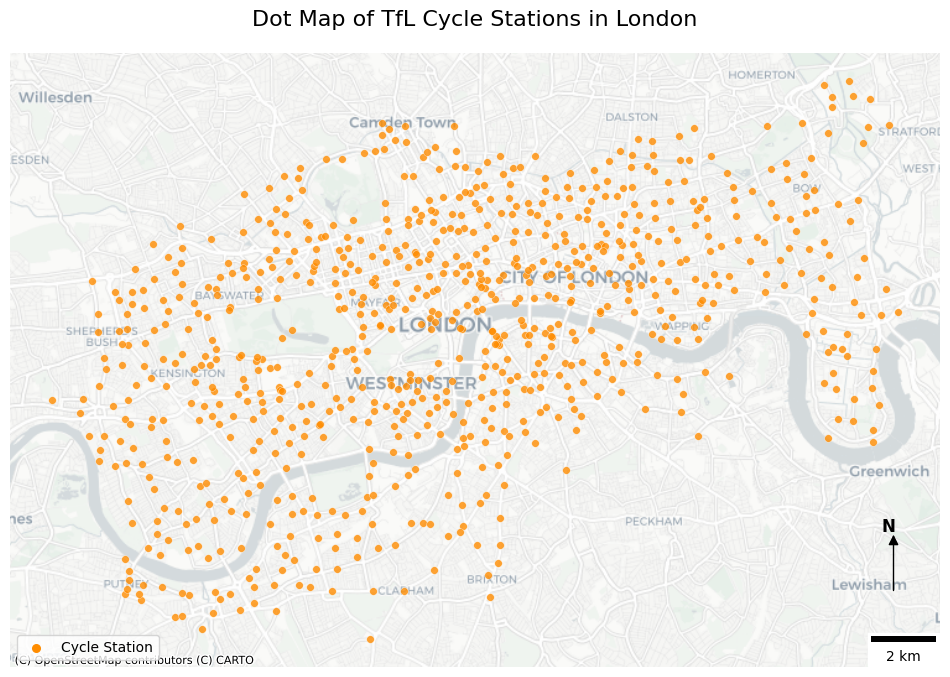

In [8]:
# make a dot map of all TfL stations
plot_station_dot_map(
    df_stations=df_stations,                     # DataFrame with station coords
    title="Dot Map of TfL Cycle Stations in London",  # nice title for the plot
    filename="station_dot_map_tfl.png",          # where the figure will be saved
    label_field=None,                            # no labels (keeps map clean)
    basemap=True,                                # show a light basemap for context
    dot_color="darkorange",                      # orange dots so they stand out
    dot_size=30,                                 # slightly larger points
    legend_label="Cycle Station"                 # legend entry
)


## Section : Manual Station Name Standardization

To address station naming inconsistencies between the TfL trip records and the XML station metadata, we define a dictionary of known mismatches.

The function `remap_station_names()` performs a direct lookup and replaces names across both the `Start station` and `End station` fields.

This step ensures high-accuracy coordinate matching, especially for older or renamed docking stations in the trip logs.


 Output: A cleaned DataFrame (`df_trips_cleaned`) ready for spatial joining.


In [9]:
def remap_station_names(df: pd.DataFrame) -> pd.DataFrame:
    """
    Applies manual corrections to known mismatched or legacy station names
    in 'Start station' and 'End station' columns of the trip DataFrame.
    """

    # dictionary of known typos, legacy names, or duplicates to fix
    station_name_corrections = {
        "Abbey Orchard Street, Westminster_OLD": "Abbey Orchard Street, Westminster",
        "Albert Embankment, Vauxhall_OLD": "Albert Embankment, Vauxhall",
        "Kennington Lane Rail Bridge, Vauxhall_OLD": "Kennington Lane Rail Bridge, Vauxhall",
        "Bath Street, St. Lke's": "Bath Street, St. Luke's",
        "Bayley Street , Bloomsbury": "Bayley Street, Bloomsbury",
        "Earnshaw Street , Covent Garden": "Earnshaw Street, Covent Garden",
        "Concert Hall Approach 1, South Bank": "Concert Hall Approach, South Bank",
        "Concert Hall Approach 2, South Bank": "Concert Hall Approach, South Bank",
        "Leonard Circus , Shoreditch_OLD": "Leonard Circus , Shoreditch",
        "Leonard Circus, Shoreditch": "Leonard Circus, Shoreditch",
        "Limburg Road, Clapham Junction_OLD": "Limburg Road, Clapham Junction",
        "Pritchard's Road, Bethnal Green_OLD": "Pritchard's Road, Bethnal Green",
        "Kennington Oval, Oval_OLD": "Kennington Oval, Oval",
    }

    # make a copy so the original df isn’t overwritten
    df = df.copy()

    # replace in both start and end station columns
    df['Start station'] = df['Start station'].astype(str).replace(station_name_corrections)
    df['End station'] = df['End station'].astype(str).replace(station_name_corrections)

    # quick confirmation message
    print(f"Applied manual station name corrections to {len(station_name_corrections)} entries.")

    return df

## Section : Spatial Join – Linking Station Coordinates to Trip Data

To enable geospatial analysis of trip origins and destinations, we join the station metadata (from the TfL XML feed) to the trip dataset.

The function `join_station_coords()` performs two left joins:
- One for `Start station` to get `start_lat` and `start_lon`
- One for `End station` to get `end_lat` and `end_lon`

This function includes input validation and supports future flexibility with column names. Missing matches are handled as `NaN` and should be cleaned after matching.

Output: An enhanced trip DataFrame ready for hex mapping and feature engineering.


In [10]:
def join_station_coords(
    trips_df: pd.DataFrame, 
    stations_df: pd.DataFrame,
    station_col: str = "station_name"
) -> pd.DataFrame:
    """
    Joins start and end station coordinates to the trip dataset based on station names.
    """

    # make sure both trip data and station data have the right columns
    if not all(col in trips_df.columns for col in ['Start station', 'End station']):
        raise ValueError("Trip data must contain 'Start station' and 'End station' columns.")
    if not all(col in stations_df.columns for col in [station_col, 'latitude', 'longitude']):
        raise ValueError(f"Station data must contain '{station_col}', 'latitude', and 'longitude' columns.")

    # attach lat/lon for the start station
    merged = trips_df.merge(
        stations_df.rename(columns={
            station_col: 'Start station',
            'latitude': 'start_lat',
            'longitude': 'start_lon'
        }),
        how="left",          # left join so no trip rows are lost
        on="Start station"
    )

    # attach lat/lon for the end station
    merged = merged.merge(
        stations_df.rename(columns={
            station_col: 'End station',
            'latitude': 'end_lat',
            'longitude': 'end_lon'
        }),
        how="left",
        on="End station"
    )

    # confirmation message
    print("Successfully joined station coordinates to trip records.")

    return merged


In [11]:
# Apply manual name cleaning
df_trips_cleaned = remap_station_names(df_trips)

# Re-merge station coordinates (from XML or cleaned station DataFrame)
df_trips_with_coords = join_station_coords(df_trips_cleaned, df_stations)

Applied manual station name corrections to 13 entries.
Successfully joined station coordinates to trip records.


In [12]:
# take a quick look at the trips DataFrame now that it has coords attached
df_trips_with_coords

,Number,Start date,Start station number,Start station,End date,End station number,End station,Bike number,Bike model,Total duration,Total duration (ms),source_file,start_lat,start_lon,end_lat,end_lon
0,136666627,2024-01-14 23:59,1108,"North Wharf Road, Paddington",2024-01-15 00:06,3423,"Maida Vale, Maida Vale",53020.0,CLASSIC,6m 47s,407799,387JourneyDataExtract01Jan2024-14Jan2024.csv,51.518623,-0.176603,51.529857,-0.183486
1,136666625,2024-01-14 23:57,3447,"Gloucester Road (North), Kensington",2024-01-15 00:05,1214,"Kensington Olympia Station, Olympia",54559.0,CLASSIC,8m 1s,481276,387JourneyDataExtract01Jan2024-14Jan2024.csv,51.497925,-0.183835,51.498158,-0.209494
2,136666626,2024-01-14 23:57,1090,"Warren Street Station, Euston",2024-01-15 00:02,200005,"New Cavendish Street, Marylebone",52133.0,CLASSIC,5m 11s,311788,387JourneyDataExtract01Jan2024-14Jan2024.csv,51.524438,-0.138019,51.519167,-0.147983
3,136666622,2024-01-14 23:56,200058,"Northdown Street, King's Cross",2024-01-15 00:06,2687,"Brick Lane Market, Shoreditch",60341.0,PBSC_EBIKE,10m 14s,614030,387JourneyDataExtract01Jan2024-14Jan2024.csv,51.531066,-0.119340,51.522618,-0.071654
4,136666623,2024-01-14 23:56,1052,"Soho Square , Soho",2024-01-15 00:23,1150,"Queensway, Kensington Gardens",55212.0,CLASSIC,27m 1s,1621583,387JourneyDataExtract01Jan2024-14Jan2024.csv,51.515631,-0.132329,51.510310,-0.187402
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8755147,145207092,2024-12-15 00:00,1052,"Soho Square , Soho",2024-12-15 00:14,1029,"Windsor Terrace, Hoxton",56872.0,CLASSIC,13m 7s,787408,410JourneyDataExtract15Dec2024-31Dec2024.csv,51.515631,-0.132329,51.529154,-0.093422
8755148,145207093,2024-12-15 00:00,1062,"Braham Street, Aldgate",2024-12-15 00:02,1102,"Leman Street, Aldgate",50808.0,CLASSIC,1m 35s,95286,410JourneyDataExtract15Dec2024-31Dec2024.csv,51.514234,-0.073538,51.512364,-0.069542
8755149,145207094,2024-12-15 00:00,300222,"Fore Street, Guildhall",2024-12-15 00:14,200152,"Pitfield Street North,Hoxton",20798.0,CLASSIC,13m 56s,836183,410JourneyDataExtract15Dec2024-31Dec2024.csv,51.518093,-0.091402,51.535580,-0.082490
8755150,145207096,2024-12-15 00:00,200226,"Kingsway Southbound, Strand",2024-12-15 00:06,1133,"Baylis Road, Waterloo",58104.0,CLASSIC,5m 28s,328874,410JourneyDataExtract15Dec2024-31Dec2024.csv,51.513875,-0.117774,51.501445,-0.110699


### Checking for Unmatched Stations
This function looks for stations in the trip data that failed to get latitude/longitude attached during the join step. It prints counts and samples of unmatched station names so we can spot inconsistencies (e.g., typos, legacy names, or stations missing in the TfL feed).

In [13]:
def get_unmatched_station_names(df_trips_with_coords: pd.DataFrame) -> Tuple[int, int, Set[str], Set[str]]:
    """
    Finds which trip stations didn’t get matched to coordinates
    (basically where start_lat or end_lat is missing).
    """

    # sanity check: make sure coords exist in the df
    if 'start_lat' not in df_trips_with_coords.columns or 'end_lat' not in df_trips_with_coords.columns:
        raise ValueError("Expected 'start_lat' and 'end_lat' columns in the merged DataFrame.")

    # grab any start stations that don’t have coords
    missing_start_stations = set(
        df_trips_with_coords[df_trips_with_coords['start_lat'].isna()]['Start station'].unique()
    )
    # same for end stations
    missing_end_stations = set(
        df_trips_with_coords[df_trips_with_coords['end_lat'].isna()]['End station'].unique()
    )

    # quick summary outputs
    print(f"Unique unmatched start stations: {len(missing_start_stations)}")
    print(f"Unique unmatched end stations: {len(missing_end_stations)}")

    # show a small sample so I can see what’s off
    print("\nSample missing Start stations:")
    print(sorted(list(missing_start_stations))[:10])

    print("\nSample missing End stations:")
    print(sorted(list(missing_end_stations))[:10])

    return len(missing_start_stations), len(missing_end_stations), missing_start_stations, missing_end_stations


# run the check on the merged trip dataframe
get_unmatched_station_names(df_trips_with_coords)


Unique unmatched start stations: 11
Unique unmatched end stations: 12

Sample missing Start stations:
['Bayley Street, Bloomsbury', 'Bouverie Street, Temple', 'Chadwell Street, Angel', 'Chancery Lane, Holborn', 'Concert Hall Approach, South Bank', 'Earnshaw Street, Covent Garden', 'Mechanical Workshop Clapham', 'Parkway, Camden Town', 'Southwark Station 1, Southwark', 'Tavistock Street, Covent Garden']

Sample missing End stations:
['Bayley Street, Bloomsbury', 'Bouverie Street, Temple', 'Chadwell Street, Angel', 'Chancery Lane, Holborn', 'Concert Hall Approach, South Bank', 'Earnshaw Street, Covent Garden', 'Mechanical Workshop Clapham', 'Mechanical Workshop Penton', 'Parkway, Camden Town', 'Southwark Station 1, Southwark']


(11,
 12,
 {'Bayley Street, Bloomsbury',
  'Bouverie Street, Temple',
  'Chadwell Street, Angel',
  'Chancery Lane, Holborn',
  'Concert Hall Approach, South Bank',
  'Earnshaw Street, Covent Garden',
  'Mechanical Workshop Clapham',
  'Parkway, Camden Town',
  'Southwark Station 1, Southwark',
  'Tavistock Street, Covent Garden',
  'Torrens Street, Angel'},
 {'Bayley Street, Bloomsbury',
  'Bouverie Street, Temple',
  'Chadwell Street, Angel',
  'Chancery Lane, Holborn',
  'Concert Hall Approach, South Bank',
  'Earnshaw Street, Covent Garden',
  'Mechanical Workshop Clapham',
  'Mechanical Workshop Penton',
  'Parkway, Camden Town',
  'Southwark Station 1, Southwark',
  'Tavistock Street, Covent Garden',
  'Torrens Street, Angel'})

Concert Hall Approach, South Bank - never existed but could be Waterloo station, South Bank 

London SE16 2BE - South Bermondsey Station, Bermondsey
London SW18 2HY - Spanish Road, Clapham Junction
London WC2H 8AJ - Earnshaw Street, Covent Garden


### Fixing Unmatched Stations with Postcode Geocoding

Some stations missing from the TfL XML feed (e.g., older or unofficial docks) can still be resolved using known postcodes or place names via OpenStreetMap.

We use `geopy` and the Nominatim geocoder to:
- Geocode missing stations using postcode strings
- Update `df_trips_with_coords` with accurate lat/lon values

This improves coordinate coverage before H3 hex mapping and aggregation.


In [14]:
# prepare any overrides (postcode or full address)
manual_station_coords = {
    "Spanish Road, Clapham Junction": "London SW18 2HY",  # station name -> known address
}

# set up geocoder (Nominatim from OpenStreetMap)
# input: address string | output: lat/lon
geolocator = Nominatim(user_agent="tfl_cycle_project")

# geocode each address and store coords in a dict
geocoded_coords = {}
for station, address in manual_station_coords.items():
    location = geolocator.geocode(address)
    if location:
        geocoded_coords[station] = {
            "latitude": location.latitude,
            "longitude": location.longitude
        }
    else:
        print(f"Could not geocode: {station} ({address})")
    time.sleep(1.2)  # pause to respect Nominatim rate limits

# update missing coords in trip dataframe
for station, coords in geocoded_coords.items():
    # update trips starting at this station
    mask_start = df_trips_with_coords['Start station'] == station
    df_trips_with_coords.loc[mask_start, 'start_lat'] = coords['latitude']
    df_trips_with_coords.loc[mask_start, 'start_lon'] = coords['longitude']
    
    # update trips ending at this station
    mask_end = df_trips_with_coords['End station'] == station
    df_trips_with_coords.loc[mask_end, 'end_lat'] = coords['latitude']
    df_trips_with_coords.loc[mask_end, 'end_lon'] = coords['longitude']

print("Missing station coordinates updated using postcode geocoding.")


Missing station coordinates updated using postcode geocoding.


#### Dropping Incomplete Geospatial Records

To ensure valid H3 hex assignment and accurate spatial analysis, any trip lacking either a start or end coordinate must be excluded.

The function `drop_trips_with_missing_coordinates()` filters out such records and reports:
- The number of dropped rows
- Sample unmatched station names

Output: A clean `df_trips_final` DataFrame with full geospatial coverage for all trips

Drop trips with incorrect or missing stations that could not be found or rechanged 

In [16]:
def drop_trips_with_missing_coordinates(df: pd.DataFrame, log_sample: bool = True) -> pd.DataFrame:
    """
    Drops trips where either start or end station coordinates are missing.
    """

    # make sure the expected coordinate columns are there
    required_cols = ['start_lat', 'start_lon', 'end_lat', 'end_lon']
    if not all(col in df.columns for col in required_cols):
        raise ValueError("Missing required geospatial columns for filtering.")

    # find rows where any coord is missing
    missing_mask = (
        df['start_lat'].isna() | df['start_lon'].isna() |
        df['end_lat'].isna()   | df['end_lon'].isna()
    )

    # keep only rows with full coordinates
    df_cleaned = df[~missing_mask].copy()

    # log: how many dropped + sample of problem stations
    if log_sample:
        num_dropped = missing_mask.sum()
        print(f"Dropped {num_dropped} trips with missing coordinates.")
        print("Sample dropped rows (station names):")
        sample = df[missing_mask][['Start station', 'End station']].drop_duplicates().head()
        print(sample.to_string(index=False))

    return df_cleaned


# final cleaned dataset with all coords in place
df_trips_final = drop_trips_with_missing_coordinates(df_trips_with_coords)


Dropped 166975 trips with missing coordinates.
Sample dropped rows (station names):
                    Start station                        End station
Concert Hall Approach, South Bank         Curlew Street, Shad Thames
        Bayley Street, Bloomsbury Great Titchfield Street, Fitzrovia
        Bayley Street, Bloomsbury              Alpha Grove, Millwall
     Waterloo Station 2, Waterloo             Chancery Lane, Holborn
  Tavistock Street, Covent Garden             Rodney Road , Walworth


In [17]:
# quick check for any leftover missing values after cleaning
df_trips_final.isnull().sum()


Number                  0
Start date              0
Start station number    0
Start station           0
End date                0
End station number      0
End station             0
Bike number             1
Bike model              0
Total duration          0
Total duration (ms)     0
source_file             0
start_lat               0
start_lon               0
end_lat                 0
end_lon                 0
dtype: int64

### Parsing Start Dates into Datetime
The trip dataset mixes two timestamp formats: UK-style (DD/MM/YYYY) and ISO-style (YYYY-MM-DD). This step parses both formats into a single datetime column for consistency. A quick check at the end reports any rows that still failed to parse

In [18]:
# make a new column so we don't overwrite the original just yet
df_trips_final['parsed_start_date'] = pd.NaT

# detect rows with slashes (dd/mm/yyyy style)
slash_mask = df_trips_final['Start date'].str.contains("/", na=False)

# parse those with UK-style day/month order
df_trips_final.loc[slash_mask, 'parsed_start_date'] = pd.to_datetime(
    df_trips_final.loc[slash_mask, 'Start date'],
    format="%d/%m/%Y %H:%M",
    errors='coerce'   # coerce = if it can't parse, set to NaT
)

# everything else should be ISO (yyyy-mm-dd style)
iso_mask = ~slash_mask
df_trips_final.loc[iso_mask, 'parsed_start_date'] = pd.to_datetime(
    df_trips_final.loc[iso_mask, 'Start date'],
    format="%Y-%m-%d %H:%M",
    errors='coerce'
)

# quick sanity check: see if any failed to parse
num_failed = df_trips_final['parsed_start_date'].isna().sum()
print(f"Parsed successfully. Remaining unparsed rows: {num_failed}")


Parsed successfully. Remaining unparsed rows: 0


### Temporal Feature Engineering
Here we extract the trip start hour and classify each trip as happening on a weekday or weekend. These temporal features are later used for inferring trip purposes (e.g., commuting vs leisure).

In [19]:
# extract the hour the trip started (0–23)
df_trips_final['start_hour'] = df_trips_final['parsed_start_date'].dt.hour

# flag trips as Weekday vs Weekend
df_trips_final['weekday_or_weekend'] = df_trips_final['parsed_start_date'].dt.dayofweek.apply(
    lambda x: 'Weekend' if x >= 5 else 'Weekday'   # 5 = Saturday, 6 = Sunday
)


### Mapping Stations to H3 Hexagons
Convert station coordinates into a GeoDataFrame and assign each one to an H3 hexagon at resolution level 9. This provides a consistent spatial grid for aggregating trips and linking to land-use features.

In [20]:
# turn the stations df into a GeoDataFrame (lat/lon points in WGS84)
gdf_stations = gpd.GeoDataFrame(
    df_stations.copy(),
    geometry=gpd.points_from_xy(df_stations['longitude'], df_stations['latitude']),
    crs="EPSG:4326"   # standard GPS coordinate system
)

# assign each station to a hexagon (H3, level 9 ~ neighbourhood scale)
gdf_stations['hex_id'] = gdf_stations.geometry.apply(
    lambda pt: h3.latlng_to_cell(pt.y, pt.x, 9)
)


### Creating Station-to-Hex Mapping
Generate a dictionary linking each station name to its H3 hexagon ID. This lookup will be handy later when aggregating trips at the hexagon level instead of by station name.

In [21]:
# make sure gdf_stations has the right cols: ['station_name', 'latitude', 'longitude', 'hex_id']
station_to_hex_dict = gdf_stations.set_index('station_name')['hex_id'].to_dict()

# quick peek at a few mappings to confirm it worked
for station, hex_id in list(station_to_hex_dict.items())[:5]:
    print(f"{station} → {hex_id}")

River Street , Clerkenwell → 89194ad3647ffff
Phillimore Gardens, Kensington → 89194ada437ffff
Christopher Street, Liverpool Street → 89194ad30dbffff
St. Chad's Street, King's Cross → 89195da4dbbffff
Sedding Street, Sloane Square → 89194ad161bffff


In [22]:
# map start + end stations to their corresponding hex IDs
df_trips_final['start_hex_id'] = df_trips_final['Start station'].map(station_to_hex_dict)
df_trips_final['end_hex_id']   = df_trips_final['End station'].map(station_to_hex_dict)

In [23]:
# Aggregate trips into a hex-level cube 
df_trip_cube = (
    df_trips_final
    .groupby(['start_hex_id', 'end_hex_id', 'start_hour', 'weekday_or_weekend'])
    .agg(
        trip_count=('Number', 'count'),              # how many trips happened
        mean_duration_ms=('Total duration (ms)', 'mean')  # avg trip duration in ms
    )
    .reset_index()
)

# sanity checks: size of result + quick preview
print(f"Aggregated hex-level trip cube shape: {df_trip_cube.shape}")
df_trip_cube.head()

Aggregated hex-level trip cube shape: (2229062, 6)


,start_hex_id,end_hex_id,start_hour,weekday_or_weekend,trip_count,mean_duration_ms
0,89194ad1003ffff,89194ad1003ffff,0,Weekday,5,7.295815e+06
1,89194ad1003ffff,89194ad1003ffff,0,Weekend,2,8.653600e+05
2,89194ad1003ffff,89194ad1003ffff,1,Weekday,4,6.787724e+06
3,89194ad1003ffff,89194ad1003ffff,1,Weekend,3,4.490246e+06
4,89194ad1003ffff,89194ad1003ffff,2,Weekday,5,1.444886e+06


In [25]:
# grab unique start stations where hex mapping failed
unmatched_stations = df_trips_final[df_trips_final['start_hex_id'].isna()]['Start station'].unique()

# print them out (usually small set of legacy/mismatched names)
print("Unmatched start stations:", unmatched_stations)

Unmatched start stations: []


### Removing Unverified or Problem Stations
Some stations are invalid or not officially part of the TfL network (e.g., legacy test sites). Here, we drop all trips involving those stations and ensure no rows remain with missing hex IDs. This step leaves us with a clean, fully geocoded dataset for analysis.

In [26]:
# list the dodgy / unverified stations that shouldn’t be kept
invalid_stations = ['South Bermondsey Station, Bermondsey', 'Earnshaw Street, Covent Garden']

# make a mask to find trips where these appear as start or end
mask_invalid = (
    df_trips_final['Start station'].isin(invalid_stations) |
    df_trips_final['End station'].isin(invalid_stations)
)

# filter them out
df_trips_final_clean = df_trips_final[~mask_invalid].copy()

# as an extra safeguard, drop any trips still missing hex ids
df_trips_final_clean = df_trips_final_clean.dropna(subset=['start_hex_id', 'end_hex_id'])

# quick summary of how many rows were dropped + final size
print(f"Dropped {mask_invalid.sum()} rows with unverified stations.")
print(f"Remaining rows: {len(df_trips_final_clean)}")

Dropped 9285 rows with unverified stations.
Remaining rows: 8578892


### Hexagon-Level Trip Summary
Here we collapse the trip cube to a simpler summary at the hexagon level. Each hex is described by the total number of trips starting there and the average trip duration. This provides a compact view of trip intensity across the network.

In [ ]:
df_hex_summary = (
    df_trip_cube
    .groupby('start_hex_id')
    .agg(
        total_trip_count=('trip_count', 'sum'),   # total trips starting in this hex
        avg_duration_ms=('mean_duration_ms', 'mean')  # average trip duration across trips
    )
    .reset_index()
    .rename(columns={'start_hex_id': 'hex_id'})  # rename for consistency
)

# preview the hex-level summary
df_hex_summary

### Inner London Boundary Resampled to H3
We load the Inner London boundary shapefile, reproject it to WGS84, and then resample the polygon into H3 hexagons at resolution 9. This provides a consistent spatial grid for aggregating and visualising trip data within the Inner London area.

<Axes: >

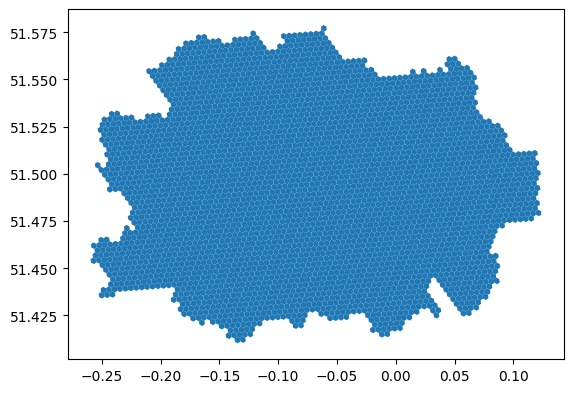

In [30]:
# load shapefile and reproject to WGS84 (EPSG:4326)
gdf = gpd.read_file(
    "../data/lp-consultation-oct-2009-inner-outer-london-shp/lp-consultation-oct-2009-inner-outer-london.shp"
).to_crs("EPSG:4326")

# filter to just Inner London polygon(s)
gdf_inner_london = gdf[gdf.Boundary == "Inner London"]

# resample polygon into H3 hex cells (resolution 9) and plot
gdf_inner_london.h3.polyfill_resample(9).plot()


In [31]:
# fill the Inner London polygon with H3 hexes (resolution 9)
hexes_inner_london = gdf_inner_london.h3.polyfill_resample(9)

# quick check: how many hexes were created
print(f"Hexes in Inner London: {len(hexes_inner_london)}")

Hexes in Inner London: 3687


### Merging Trip Data with Inner London Hex Grid
We merge the trip summary metrics (total trip counts and mean durations) with the H3 hex grid for Inner London. Any hex cells without trips are filled with zeros, ensuring a complete spatial layer for mapping and analysis.

In [32]:
# move H3 index into a column and call it 'hex_id'
hexes_inner_london = hexes_inner_london.reset_index().rename(columns={"h3_polyfill": "hex_id"})

# merge trip stats (from df_hex_summary) onto the Inner London hex grid
gdf_trips_hexes = hexes_inner_london.merge(df_hex_summary, on="hex_id", how="left")

# fill in hexes with no trips: set counts/durations to 0
gdf_trips_hexes["total_trip_count"] = gdf_trips_hexes["total_trip_count"].fillna(0)
gdf_trips_hexes["avg_duration_min"] = gdf_trips_hexes["avg_duration_ms"].fillna(0) / 60000  # convert ms → minutes


### Hex-Level Aggregations (Start/End + Totals)
Aggregate trips by H3 hexagon for both start and end sides, then compute total trips and unique station coverage per hex. This gives a compact spatial summary for mapping and modelling.

In [ ]:
def aggregate_hexagon_stats(df: pd.DataFrame) -> pd.DataFrame:
    """
    Aggregates trip-level data to the H3 hexagon level.
    """

    # start-side aggregation: how many trips start in each hex, and how many distinct start stations there are
    start_stats = df.groupby('start_hex_id').agg(
        start_trip_count=('start_hex_id', 'count'),
        unique_start_stations=('Start station', 'nunique')
    ).reset_index().rename(columns={'start_hex_id': 'hex_id'})

    # end-side aggregation: how many trips end in each hex, and distinct end stations
    end_stats = df.groupby('end_hex_id').agg(
        end_trip_count=('end_hex_id', 'count'),
        unique_end_stations=('End station', 'nunique')
    ).reset_index().rename(columns={'end_hex_id': 'hex_id'})

    # bring start + end summaries together (outer to keep hexes that appear on only one side)
    hex_agg = pd.merge(start_stats, end_stats, on='hex_id', how='outer').fillna(0)

    # simple totals per hex (counts + unique station coverage)
    hex_agg['total_trip_count'] = hex_agg['start_trip_count'] + hex_agg['end_trip_count']
    hex_agg['total_unique_stations'] = hex_agg['unique_start_stations'] + hex_agg['unique_end_stations']

    # ensure one row per hex id
    return hex_agg.drop_duplicates(subset='hex_id')


### Converting H3 IDs to Polygons
Each H3 hex ID is converted to a Shapely polygon (EPSG:4326). This lets us map aggregated metrics directly as hex grids.

In [34]:
def convert_hex_to_geometry(hex_df: pd.DataFrame) -> gpd.GeoDataFrame:
    """
    Converts a DataFrame with H3 hex IDs to a GeoDataFrame with polygon geometry.
    """

    # sanity check: need hex ids to build polygons
    if 'hex_id' not in hex_df.columns:
        raise ValueError("Expected 'hex_id' column not found in input DataFrame.")

    # copy to avoid mutating caller df
    hex_df = hex_df.copy()

    # turn each H3 id into a shapely polygon (WGS84 lon/lat order)
    hex_df['geometry'] = hex_df['hex_id'].apply(
        lambda h: Polygon([(lng, lat) for lat, lng in h3.cell_to_boundary(h)])
    )

    # return as GeoDataFrame with correct CRS
    return gpd.GeoDataFrame(hex_df, geometry='geometry', crs='EPSG:4326')


### Pipeline: Hexagon-Level Aggregation
We run the aggregation pipeline to summarise trips at the H3 hexagon level and then convert hex IDs into polygon geometries. This produces a geospatial layer of trip activity that can be mapped and analysed in the next stages.

In [35]:
# collapse trip data into per-hex stats (counts + unique stations)
df_hex_agg = aggregate_hexagon_stats(df_trips_final_clean)

# turn hex IDs into actual polygon geometries so we can map them
gdf_hex_1 = convert_hex_to_geometry(df_hex_agg)


## Analyzing Distribution of Trip Volumes to know Bin Distribution

To determine an appropriate binning strategy for visualizations (e.g. Kepler breaks or classification buckets), we first inspect the distribution of total trip counts across hexagons.

This histogram:
- Highlights right-skewed patterns in high-traffic zones
- Informs quantile or manual break selection
- Calculates the skewness statistic for documentation

 Output: Histogram with skew metric + optional export


Plot saved to: outputs/plots\hex_trip_count_histogram.png


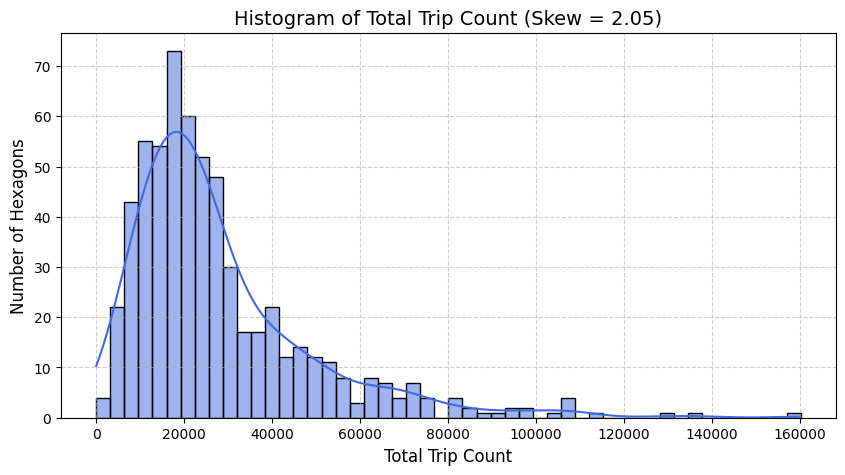

In [36]:
def plot_trip_histogram(
    gdf_hex: pd.DataFrame,
    column: str = "total_trip_count",
    bins: int = 50,
    save_path: str = None
):
    """
    Plot a histogram of hex-level trip counts (or another chosen column) and report skewness.
    """

    # drop NAs just in case and calculate skew
    data = gdf_hex[column].dropna()
    skew_val = skew(data)

    # set up plot
    fig, ax = plt.subplots(figsize=(10, 5))

    # histogram with KDE overlay
    sns.histplot(data, bins=bins, kde=True, ax=ax,
                 color='royalblue', edgecolor='black')

    # tidy up labels and title
    ax.set_title(f"Histogram of {column.replace('_', ' ').title()} (Skew = {skew_val:.2f})", fontsize=14)
    ax.set_xlabel(column.replace('_', ' ').title(), fontsize=12)
    ax.set_ylabel("Number of Hexagons", fontsize=12)

    # add grid for readability
    ax.grid(True, linestyle='--', alpha=0.6)

    # save or just show
    if save_path:
        save_plot(fig, save_path)
    else:
        plt.tight_layout()
        plt.show()


# run and save the histogram for trip counts
plot_trip_histogram(gdf_hex_1, save_path="hex_trip_count_histogram.png")

### Distribution of Hexagons by Trip Volume Bin
This plot shows how many hexagons fall into each trip volume category (e.g., quiet zones, regional hubs, transport super-nodes). The bins were chosen based on exploratory analysis of skewness and density thresholds, making the categories interpretable for both technical and policy audiences.

Plot saved to: outputs/plots\hex_trip_bin_distribution.png


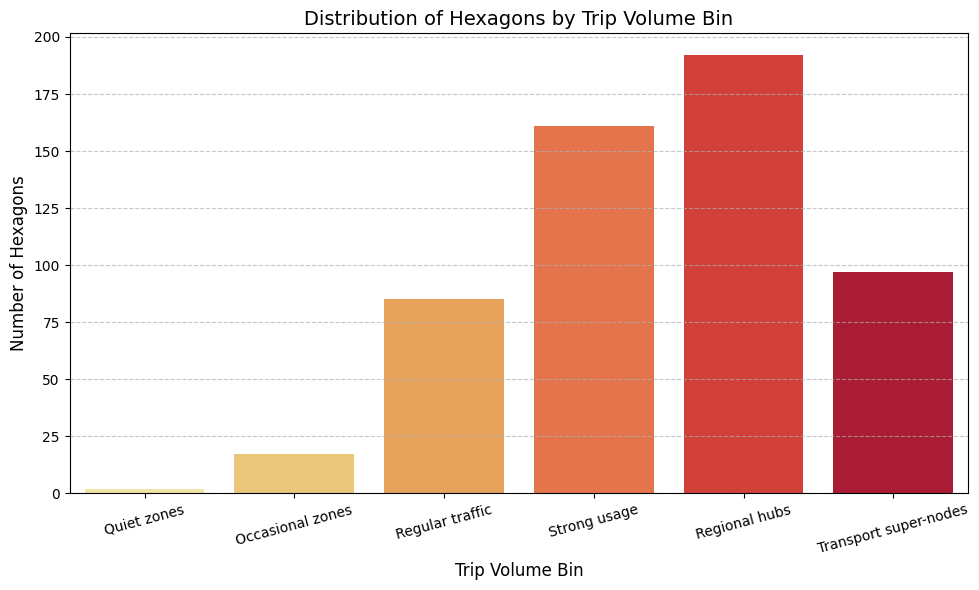

In [37]:
def plot_trip_bin_distribution(
    gdf_hex: pd.DataFrame,
    filename: str = "trip_bin_distribution_between_hexagons.png",
    bins: list = [0, 2000, 6000, 12000, 20000, 35000, 60000],
    labels: list = ['Quiet zones', 'Occasional zones', 'Regular traffic', 'Strong usage', 'Regional hubs', 'Transport super-nodes'],
    column: str = 'total_trip_count'
):
    """
    Plot the number of hexagons falling into custom trip count bins and save figure.
    """

    # quick checks: column exists + bins/labels align
    if column not in gdf_hex.columns:
        raise ValueError(f"Column '{column}' not found in GeoDataFrame.")
    if len(labels) != len(bins) - 1:
        raise ValueError("Number of labels must be one less than number of bin edges.")

    # assign each hex to a trip volume bin
    gdf_hex = gdf_hex.copy()
    gdf_hex['trip_bin'] = pd.cut(
        gdf_hex[column], bins=bins, labels=labels, include_lowest=True
    )

    # count how many hexes fall in each bin
    bin_counts = gdf_hex['trip_bin'].value_counts().sort_index()

    # make bar plot
    fig, ax = plt.subplots(figsize=(10, 6))
    sns.barplot(
        x=bin_counts.index,
        y=bin_counts.values,
        hue=bin_counts.index,       # colour by category
        palette='YlOrRd',           # yellow → red colour scale
        legend=False,
        ax=ax
    )

    # formatting
    ax.set_title('Distribution of Hexagons by Trip Volume Bin', fontsize=14)
    ax.set_xlabel('Trip Volume Bin', fontsize=12)
    ax.set_ylabel('Number of Hexagons', fontsize=12)
    ax.grid(axis='y', linestyle='--', alpha=0.7)

    plt.xticks(rotation=15)  # angle labels for readability
    plt.tight_layout()

    # save + show
    save_plot(fig, filename)
    plt.show()


# run the function to save + show the distribution
plot_trip_bin_distribution(gdf_hex_1, filename="hex_trip_bin_distribution.png")

### Geospatial Maps for Trip Patterns

We visualize cycling trip patterns using:

#### 1. Choropleth Map (Hexagon Layer)
- Classifies hexagons by trip volume
- Colored using fixed bins and labeled legend
- Used for hotspot analysis and spatial planning

#### 2. Proportional Symbol Map (Station Layer)
- Visualizes trip intensity per station
- Circle size encodes trip volume
- Useful for identifying dominant pickup/drop-off locations

Both plots include:
-  North arrow
-  Scale bar
- Basemap context (CartoDB)
- Exported PNGs via `save_plot()`


In [38]:
def plot_choropleth(
    gdf_polygons: gpd.GeoDataFrame,
    column: str,
    title: str = "Choropleth Map",
    cmap: str = "BuPu",
    filename: str = "choropleth_map.png",
    legend_title: str = "Total Trips per Hexagon",
    basemap: bool = True,
    classification_bins: list = [1, 10000, 20000, 30000, 40000, 60000],
    edgecolor: str = "black",
    alpha: float = 0.85,
    xlim: tuple = None,
    ylim: tuple = None,
    background_extent: gpd.GeoDataFrame = None,
    overlay_boundary: gpd.GeoDataFrame = None,
    no_data_color: str = "lightgrey"
):

    if column not in gdf_polygons.columns:
        raise ValueError(f"Column '{column}' not found in GeoDataFrame.")

    # Reproject to Web Mercator
    gdf_web = gdf_polygons.to_crs(epsg=3857)

    # Assign bin for non-null values only
    gdf_web["bin"] = pd.cut(gdf_web[column], bins=classification_bins, include_lowest=True)
    
    # Setup colormap
    cmap_func = plt.get_cmap(cmap)
    norm = mcolors.BoundaryNorm(classification_bins, cmap_func.N)

    # Plot
    fig, ax = plt.subplots(figsize=(12, 10))

    # Plot hexagons with no data as transparent fill but visible outline
    gdf_web[gdf_web["bin"].isna()].plot(
        ax=ax,
        facecolor="none",               # Transparent fill
        edgecolor="lightgrey",         # Light boundary stroke
        linewidth=0.4,                 # Slightly more visible
        alpha=1.0
    )


    # Plot hexagons with trip data
    gdf_web[gdf_web["bin"].notna()].plot(
        column="bin", cmap=cmap, edgecolor=edgecolor, linewidth=0.2, alpha=alpha, ax=ax
    )

    # Custom legend
    handles = [
        mpatches.Patch(color=cmap_func(norm(classification_bins[i])),
                       label=f"{int(classification_bins[i])}–{int(classification_bins[i+1])}")
        for i in range(len(classification_bins) - 1)
    ]
    handles.append(mpatches.Patch(color=no_data_color, label="No Trips"))
    ax.legend(handles=handles, title=legend_title, title_fontsize=10, fontsize=9,
              loc='upper left', frameon=True)

    # Optional: overlay boundary
    if overlay_boundary is not None:
        overlay_web = overlay_boundary.to_crs(epsg=3857)
        overlay_web.boundary.plot(ax=ax, color='gray', linewidth=1.5, linestyle='--', alpha=0.6)

    # Set extent
    if background_extent is not None:
        extent_web = background_extent.to_crs(epsg=3857)
        minx, miny, maxx, maxy = extent_web.total_bounds
        padding_x = (maxx - minx) * 0.1
        padding_y = (maxy - miny) * 0.1
        ax.set_xlim(minx - padding_x, maxx + padding_x)
        ax.set_ylim(miny - padding_y, maxy + padding_y)
    elif xlim and ylim:
        ax.set_xlim(xlim)
        ax.set_ylim(ylim)

    # Basemap
    if basemap:
        ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)

    # North arrow
    arrow = FancyArrowPatch((0.93, 0.12), (0.93, 0.22), transform=ax.transAxes,
                            arrowstyle='-|>', mutation_scale=15, color='black')
    ax.add_patch(arrow)
    ax.text(0.925, 0.235, 'N', transform=ax.transAxes, ha='center', va='center',
            fontsize=12, fontweight='bold')

    # Scalebar
    scalebar = ScaleBar(dx=1, units="m", location='lower right', scale_loc='bottom', length_fraction=0.1)
    ax.add_artist(scalebar)

    # Title and output
    ax.set_title(title, fontsize=16, pad=20)
    ax.set_axis_off()
    save_plot(fig, filename)
    plt.show()


Plot saved to: outputs/plots\trip_volume_map.png


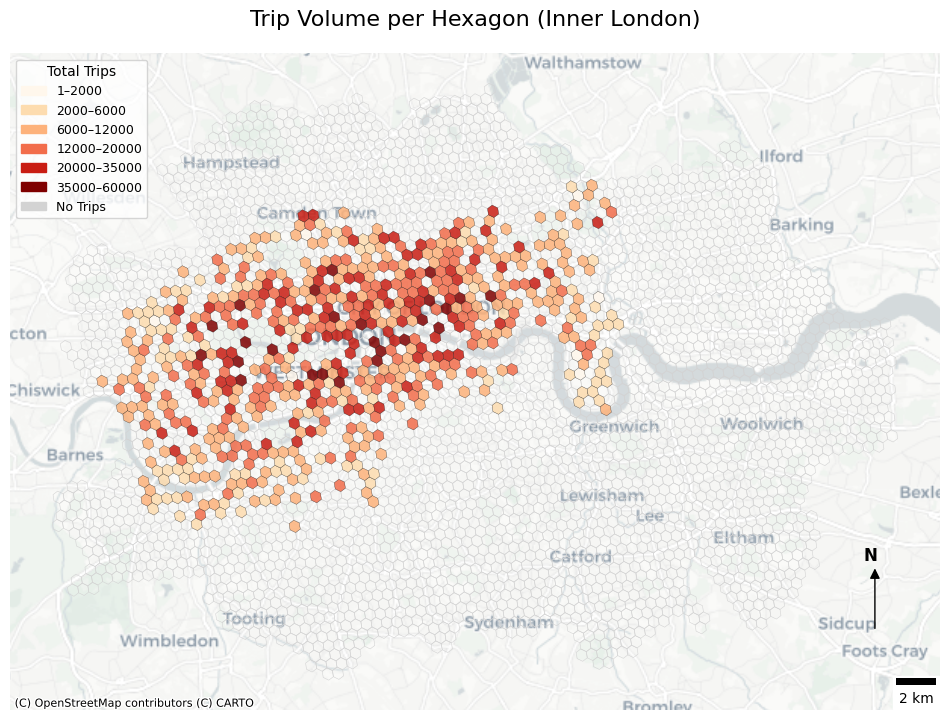

In [39]:
plot_choropleth(
    gdf_polygons=gdf_trips_hexes,
    column="total_trip_count",
    title="Trip Volume per Hexagon (Inner London)",
    legend_title="Total Trips",
    cmap="OrRd",
    classification_bins=[1, 2000, 6000, 12000, 20000, 35000, 60000],
    edgecolor="black",
    filename="trip_volume_map.png"
)


In [40]:
df_trips_final_clean.head()

,Number,Start date,Start station number,Start station,End date,End station number,End station,Bike number,Bike model,Total duration,...,source_file,start_lat,start_lon,end_lat,end_lon,parsed_start_date,start_hour,weekday_or_weekend,start_hex_id,end_hex_id
0,136666627,2024-01-14 23:59,1108,"North Wharf Road, Paddington",2024-01-15 00:06,3423,"Maida Vale, Maida Vale",53020.0,CLASSIC,6m 47s,...,387JourneyDataExtract01Jan2024-14Jan2024.csv,51.518623,-0.176603,51.529857,-0.183486,2024-01-14 23:59:00,23,Weekend,89195da4bd3ffff,89195da4a87ffff
1,136666625,2024-01-14 23:57,3447,"Gloucester Road (North), Kensington",2024-01-15 00:05,1214,"Kensington Olympia Station, Olympia",54559.0,CLASSIC,8m 1s,...,387JourneyDataExtract01Jan2024-14Jan2024.csv,51.497925,-0.183835,51.498158,-0.209494,2024-01-14 23:57:00,23,Weekend,89194ada59bffff,89194ada42bffff
2,136666626,2024-01-14 23:57,1090,"Warren Street Station, Euston",2024-01-15 00:02,200005,"New Cavendish Street, Marylebone",52133.0,CLASSIC,5m 11s,...,387JourneyDataExtract01Jan2024-14Jan2024.csv,51.524438,-0.138019,51.519167,-0.147983,2024-01-14 23:57:00,23,Weekend,89195da4d63ffff,89195da49dbffff
3,136666622,2024-01-14 23:56,200058,"Northdown Street, King's Cross",2024-01-15 00:06,2687,"Brick Lane Market, Shoreditch",60341.0,PBSC_EBIKE,10m 14s,...,387JourneyDataExtract01Jan2024-14Jan2024.csv,51.531066,-0.119340,51.522618,-0.071654,2024-01-14 23:56:00,23,Weekend,89195da4d87ffff,89194ad3467ffff
4,136666623,2024-01-14 23:56,1052,"Soho Square , Soho",2024-01-15 00:23,1150,"Queensway, Kensington Gardens",55212.0,CLASSIC,27m 1s,...,387JourneyDataExtract01Jan2024-14Jan2024.csv,51.515631,-0.132329,51.510310,-0.187402,2024-01-14 23:56:00,23,Weekend,89195da4983ffff,89195da4b43ffff


####  Hexagon-Level Aggregation and Geometry Conversion

In this step, we aggregate cleaned trip data to the spatial level of H3 hexagons (resolution 9).

- The function `aggregate_hexagon_stats()` calculates:
  - Total trips originating and ending in each hex
  - Number of unique stations per hex
- The function `convert_hex_to_geometry()` transforms H3 hex IDs into polygon shapes for geospatial plotting.

This produces a `GeoDataFrame` that can be used for:
- Kepler.gl heatmaps
- Geospatial classification
- Cluster analysis

Output: `gdf_hex` — a geospatial hex-layer dataset with trip activity metrics


In [41]:
def aggregate_hexagon_stats(df: pd.DataFrame) -> pd.DataFrame:
    """
    Aggregates trip-level data to the H3 hexagon level.

    Parameters:
        df (pd.DataFrame): Cleaned trip data with assigned start/end H3 hex IDs.

    Returns:
        pd.DataFrame: Aggregated stats per hexagon including trip counts and unique station counts.
    """
    # Start trip aggregations
    start_stats = df.groupby('start_hex_id').agg(
        start_trip_count=('start_hex_id', 'count'),
        unique_start_stations=('Start station', 'nunique')
    ).reset_index().rename(columns={'start_hex_id': 'hex_id'})

    # End trip aggregations
    end_stats = df.groupby('end_hex_id').agg(
        end_trip_count=('end_hex_id', 'count'),
        unique_end_stations=('End station', 'nunique')
    ).reset_index().rename(columns={'end_hex_id': 'hex_id'})

    # Merge start and end data
    hex_agg = pd.merge(start_stats, end_stats, on='hex_id', how='outer').fillna(0)

    # Total metrics per hexagon
    hex_agg['total_trip_count'] = hex_agg['start_trip_count'] + hex_agg['end_trip_count']
    hex_agg['total_unique_stations'] = hex_agg['unique_start_stations'] + hex_agg['unique_end_stations']

    return hex_agg.drop_duplicates(subset='hex_id')


def convert_hex_to_geometry(hex_df: pd.DataFrame) -> gpd.GeoDataFrame:
    """
    Converts a DataFrame with H3 hex IDs to a GeoDataFrame with polygon geometry.

    Parameters:
        hex_df (pd.DataFrame): DataFrame with a 'hex_id' column.

    Returns:
        gpd.GeoDataFrame: GeoDataFrame with a geometry column of hex polygons.
    """
    if 'hex_id' not in hex_df.columns:
        raise ValueError("Expected 'hex_id' column not found in input DataFrame.")

    hex_df = hex_df.copy()
    hex_df['geometry'] = hex_df['hex_id'].apply(
        lambda h: Polygon([(lng, lat) for lat, lng in h3.cell_to_boundary(h)])
    )
    return gpd.GeoDataFrame(hex_df, geometry='geometry', crs='EPSG:4326')


In [42]:
# Pipeline Execution 

# Step 1: Aggregate trip activity per hexagon
df_hex_agg = aggregate_hexagon_stats(df_trips_final_clean)

# Step 2: Convert H3 hex IDs to polygon geometry
gdf_hex = convert_hex_to_geometry(df_hex_agg)

# Step 3: Preview geospatial data
gdf_hex[['hex_id', 'total_trip_count', 'total_unique_stations', 'geometry']].head()


,hex_id,total_trip_count,total_unique_stations,geometry
0,89194ad1003ffff,38713,4,"POLYGON ((-0.13384 51.47477, -0.13593 51.47379..."
1,89194ad100bffff,9265,2,"POLYGON ((-0.13845 51.47455, -0.14055 51.47357..."
2,89194ad1023ffff,26964,2,"POLYGON ((-0.12958 51.46701, -0.13167 51.46603..."
3,89194ad104bffff,18436,2,"POLYGON ((-0.15064 51.47664, -0.15273 51.47566..."
4,89194ad104fffff,15494,2,"POLYGON ((-0.14768 51.47412, -0.14977 51.47314..."


#### Exporting Geospatial Layers for Kepler.gl

To support interactive exploration and communication of spatial patterns, this section exports:

- Hexagon polygons with trip volume (`kepler_hexagons.geojson`)
- Trip arc flows (`kepler_trip_arcs.csv`)
- Station point locations (`kepler_station_points.geojson`)

These layers are fully compatible with Kepler.gl for layered visualizations of origin-destination flows, station density, and trip volumes.


In [43]:
def export_hex_layer(gdf_hex: gpd.GeoDataFrame, output_path: str = "../data/kepler_hexagons.geojson") -> None:
    """
    Exports aggregated hexagon GeoDataFrame to GeoJSON for use in Kepler.gl.

    Parameters:
        gdf_hex (GeoDataFrame): Hex-level spatial stats with geometry.
        output_path (str): File path to save the GeoJSON.
    """
    cols = ['hex_id', 'total_trip_count', 'total_unique_stations', 'geometry']
    gdf_hex[cols].to_file(output_path, driver="GeoJSON")
    print(f"Hexagon layer exported to: {output_path}")


def export_trip_arcs(df: pd.DataFrame, output_path: str = "../data/kepler_trip_arcs.csv") -> None:
    """
    Prepares and exports trip flow arc data for Kepler.gl visualization.

    Parameters:
        df (DataFrame): Trip-level data with lat/lon and duration.
        output_path (str): File path for CSV export.
    """
    arc_df = df[['Start date', 'End date', 'start_lat', 'start_lon', 'end_lat', 'end_lon', 'Total duration (ms)']].copy()
    arc_df = arc_df.dropna(subset=['start_lat', 'start_lon', 'end_lat', 'end_lon'])

    arc_df.rename(columns={
        'Start date': 'start_time',
        'End date': 'end_time',
        'start_lat': 'lat_from',
        'start_lon': 'lon_from',
        'end_lat': 'lat_to',
        'end_lon': 'lon_to',
        'Total duration (ms)': 'duration_ms'
    }, inplace=True)

    arc_df.to_csv(output_path, index=False)
    print(f"Trip arcs exported to: {output_path}")


def export_station_dots(df_stations: pd.DataFrame, output_path: str = "../data/kepler_station_points.geojson") -> None:
    """
    Converts station data with lat/lon to a GeoJSON point file for Kepler.gl.

    Parameters:
        df_stations (DataFrame): DataFrame containing 'latitude' and 'longitude'.
        output_path (str): Path to save GeoJSON output.
    """
    gdf = gpd.GeoDataFrame(
        df_stations.copy(),
        geometry=gpd.points_from_xy(df_stations['longitude'], df_stations['latitude']),
        crs="EPSG:4326"
    )
    gdf.to_file(output_path, driver="GeoJSON")
    print(f"Station dots exported to: {output_path}")

export_hex_layer(gdf_hex)
export_trip_arcs(df_trips_final)
export_station_dots(df_stations)


Hexagon layer exported to: ../data/kepler_hexagons.geojson
Trip arcs exported to: ../data/kepler_trip_arcs.csv
Station dots exported to: ../data/kepler_station_points.geojson



#### Bin Slection Rationale

Two exploratory plots were generated to justify the bin cutoffs:

1. **Histogram of Total Trip Count per Hexagon**  
   - Revealed a **heavily right-skewed distribution** (Skew = 2.05).
   - Most hexagons record fewer than 20,000 trips, while a small number exceed 60,000.
   - The chosen bins span the long tail without oversimplifying the midrange.

2. **Bar Plot of Hexagon Counts by Volume Bin Label**  
   - Categories such as *"Quiet zones"*, *"Regional hubs"*, and *"Transport super-nodes"* demonstrate that the bins align with **meaningful density thresholds**.
   - This ensures that spatial patterns are neither under- nor over-emphasized.

#### Conclusion

The final binning scheme ([0, 2000, 6000, 12000, 20000, 35000, 60000]) balances:
- **Distribution-awareness** (skew handling)
- **Semantic clarity** (label naming)
- **Visual differentiation** (for choropleths and proportional symbol scaling)

This makes the hex-based maps interpretable for both technical and policy-oriented audiences.


_________________

In [44]:
# make a working copy of the cleaned trips dataset (to avoid touching the original)
trips_df = df_trips_final_clean.copy()

In [45]:
trips_df.head()

,Number,Start date,Start station number,Start station,End date,End station number,End station,Bike number,Bike model,Total duration,...,source_file,start_lat,start_lon,end_lat,end_lon,parsed_start_date,start_hour,weekday_or_weekend,start_hex_id,end_hex_id
0,136666627,2024-01-14 23:59,1108,"North Wharf Road, Paddington",2024-01-15 00:06,3423,"Maida Vale, Maida Vale",53020.0,CLASSIC,6m 47s,...,387JourneyDataExtract01Jan2024-14Jan2024.csv,51.518623,-0.176603,51.529857,-0.183486,2024-01-14 23:59:00,23,Weekend,89195da4bd3ffff,89195da4a87ffff
1,136666625,2024-01-14 23:57,3447,"Gloucester Road (North), Kensington",2024-01-15 00:05,1214,"Kensington Olympia Station, Olympia",54559.0,CLASSIC,8m 1s,...,387JourneyDataExtract01Jan2024-14Jan2024.csv,51.497925,-0.183835,51.498158,-0.209494,2024-01-14 23:57:00,23,Weekend,89194ada59bffff,89194ada42bffff
2,136666626,2024-01-14 23:57,1090,"Warren Street Station, Euston",2024-01-15 00:02,200005,"New Cavendish Street, Marylebone",52133.0,CLASSIC,5m 11s,...,387JourneyDataExtract01Jan2024-14Jan2024.csv,51.524438,-0.138019,51.519167,-0.147983,2024-01-14 23:57:00,23,Weekend,89195da4d63ffff,89195da49dbffff
3,136666622,2024-01-14 23:56,200058,"Northdown Street, King's Cross",2024-01-15 00:06,2687,"Brick Lane Market, Shoreditch",60341.0,PBSC_EBIKE,10m 14s,...,387JourneyDataExtract01Jan2024-14Jan2024.csv,51.531066,-0.119340,51.522618,-0.071654,2024-01-14 23:56:00,23,Weekend,89195da4d87ffff,89194ad3467ffff
4,136666623,2024-01-14 23:56,1052,"Soho Square , Soho",2024-01-15 00:23,1150,"Queensway, Kensington Gardens",55212.0,CLASSIC,27m 1s,...,387JourneyDataExtract01Jan2024-14Jan2024.csv,51.515631,-0.132329,51.510310,-0.187402,2024-01-14 23:56:00,23,Weekend,89195da4983ffff,89195da4b43ffff


### Extracting Day of Week from Start Date
We convert the trip start timestamp into a datetime type (with support for mixed formats) and then extract the day of the week. This feature helps distinguish weekday commuting patterns from weekend leisure trips.

In [46]:
# make sure 'Start date' is actually datetime (handles mixed formats if any slipped through)
if not pd.api.types.is_datetime64_any_dtype(trips_df['Start date']):
    trips_df['Start date'] = pd.to_datetime(
        trips_df['Start date'], format='mixed', dayfirst=True, errors='coerce'
    )

# extract day name (e.g., Monday, Tuesday...)
trips_df['day_of_week'] = trips_df['Start date'].dt.day_name()

### Extract Unique POI Types from Greater London OSM Shapefile

We read the POI layer (gis_osm_pois_free_1) from the Greater London OSM shapefile and extract the unique fclass categories (e.g., schools, shops, parks). These categories form the basis for enriching cycling trip data with land-use context.


In [48]:
def extract_unique_poi_types(shapefile_path: str,
                              layer_name: str = "gis_osm_pois_free_1",
                              output_csv: str = "poi_osm_in_London.csv") -> pd.DataFrame:
    """
    Extract and save a sorted list of unique POI types from the OSM shapefile layer.
    """

    # load just the 'fclass' column (the POI category) from the given layer
    gdf = gpd.read_file(shapefile_path, layer=layer_name)[['fclass']]

    # drop NaNs and get unique POI categories
    poi_classes = gdf['fclass'].dropna().unique()
    poi_classes_sorted = sorted(poi_classes)

    # put into a DataFrame + save to CSV
    poi_df = pd.DataFrame(poi_classes_sorted, columns=["OSM_POI_Type"])
    poi_df.to_csv(output_csv, index=False)

    print(f"Extracted {len(poi_df)} unique POI types and saved to: {output_csv}")
    return poi_df


# run once to extract and inspect POIs in the London shapefile
shapefile_path = "../data/greater-london-latest-free.shp.zip"
poi_df = extract_unique_poi_types(shapefile_path)

Extracted 129 unique POI types and saved to: poi_osm_in_London.csv


### Extracting POIs from OSM (PBF)
Using pyrosm, we load the London .osm.pbf file and extract Points of Interest grouped into four categories relevant to trip purpose inference:

Parks/recreation – for identifying leisure trips

Schools/colleges/universities – for education trips

Retail/food services – for shopping trips

Transit hubs – for commuting trips

This step generates a dictionary of GeoDataFrames (pois_dict) keyed by category name.

In [49]:
def load_osm_pbf(pbf_path: str) -> OSM:
    """
    Load an OSM PBF file into a pyrosm object.
    """
    return OSM(pbf_path)


def extract_pois(osm: OSM, custom_filter: Dict[str, list], label: str) -> gpd.GeoDataFrame:
    """
    Extract POIs matching a given OSM tag filter.
    """
    print(f"Extracting {label} POIs...")
    pois = osm.get_pois(custom_filter=custom_filter)
    # drop rows without geometry, keep only geometry column
    return pois.dropna(subset=["geometry"])[["geometry"]].reset_index(drop=True)


def extract_all_pois(pbf_path: str) -> Dict[str, gpd.GeoDataFrame]:
    """
    Load OSM PBF and extract grouped POIs for trip-purpose categories.
    Returns dict with keys: parks, schools, retail, transit.
    """
    osm = load_osm_pbf(pbf_path)

    return {
        # green/recreational spaces
        'parks': extract_pois(osm, {
            "leisure": [
                "park", "playground", "dog_park", "sports_centre",
                "golf_course", "picnic_site", "recreation_ground",
                "ice_rink", "swimming_pool"
            ]
        }, "parks"),

        # educational facilities
        'schools': extract_pois(osm, {
            "amenity": ["school", "college", "university", "kindergarten", "library"]
        }, "schools"),

        # shopping, cafes, restaurants, etc.
        'retail': extract_pois(osm, {
            "shop": [
                "bakery", "beverages", "bicycle_shop", "bookshop", "butcher", "clothes",
                "computer_shop", "convenience", "department_store", "florist", "furniture_shop",
                "garden_centre", "gift_shop", "greengrocer", "jeweller", "mall", "market_place",
                "mobile_phone_shop", "shoe_shop", "stationery", "supermarket", "toy_shop",
                "video_shop", "outdoor_shop"
            ],
            "amenity": ["cafe", "restaurant", "fast_food", "kiosk", "pub", "bar", "food_court"]
        }, "retail zones"),

        # transport nodes
        'transit': extract_pois(osm, {
            "public_transport": ["station", "platform", "stop_position"],
            "railway": ["station"],
            "highway": ["bus_stop"],
            "amenity": ["bicycle_rental", "car_rental", "car_sharing"]
        }, "transit hubs")
    }


# run extraction on London PBF
pbf_path = "../data/greater-london-latest.osm.pbf"
pois_dict = extract_all_pois(pbf_path)

Extracting parks POIs...
Extracting schools POIs...
Extracting retail zones POIs...
Extracting transit hubs POIs...


### Proximity Scoring to POIs (KDTree)
Compute the distance from each trip’s start location to the nearest park, school, retail cluster, and transit hub. Store both the continuous distance (metres) and a binary flag for being within 100 m. This feeds directly into the rule-based labels and the supervised model features.

Get the measure of distance used 

In [50]:
def fast_flag_and_score_poi(
    df: pd.DataFrame,
    lat_col: str,
    lon_col: str,
    poi_gdf: gpd.GeoDataFrame,
    poi_label: str,
    buffer_radius_m: float = 100.0
) -> pd.DataFrame:
    """
    Flags trips that are within a given distance to POIs and stores the distance.
    Uses KDTree on projected coordinates for speed.
    """

    df_copy = df.copy()  # keep original df untouched

    # build point geometries for trips in WGS84 then project to meters (Web Mercator)
    trip_points = gpd.GeoSeries(
        [Point(xy) for xy in zip(df_copy[lon_col], df_copy[lat_col])],
        crs="EPSG:4326"
    ).to_crs("EPSG:3857")

    # project POIs to meters as well; use centroids in case geometries are polygons
    poi_points = poi_gdf['geometry'].to_crs("EPSG:3857").centroid

    # extract coordinate arrays (x = Easting, y = Northing)
    trip_coords = np.array([(geom.x, geom.y) for geom in trip_points])
    poi_coords = np.array([(geom.x, geom.y) for geom in poi_points])

    # build KDTree on POIs and query nearest neighbour for each trip point
    poi_tree = cKDTree(poi_coords)
    dist, _ = poi_tree.query(trip_coords, k=1)  # dist is in metres since EPSG:3857

    # store results: distance to nearest POI + within-threshold flag
    df_copy[f'dist_to_{poi_label}'] = dist
    df_copy[f'near_{poi_label}'] = dist <= buffer_radius_m

    return df_copy


# run proximity scoring for each POI group (start-side proximity)
trips_df = fast_flag_and_score_poi(trips_df, 'start_lat', 'start_lon', pois_dict['parks'],   'park')
trips_df = fast_flag_and_score_poi(trips_df, 'start_lat', 'start_lon', pois_dict['schools'], 'school')
trips_df = fast_flag_and_score_poi(trips_df, 'start_lat', 'start_lon', pois_dict['retail'],  'retail')
trips_df = fast_flag_and_score_poi(trips_df, 'start_lat', 'start_lon', pois_dict['transit'], 'transit')

In [51]:
trips_df.columns

Index(['Number', 'Start date', 'Start station number', 'Start station',
       'End date', 'End station number', 'End station', 'Bike number',
       'Bike model', 'Total duration', 'Total duration (ms)', 'source_file',
       'start_lat', 'start_lon', 'end_lat', 'end_lon', 'parsed_start_date',
       'start_hour', 'weekday_or_weekend', 'start_hex_id', 'end_hex_id',
       'day_of_week', 'dist_to_park', 'near_park', 'dist_to_school',
       'near_school', 'dist_to_retail', 'near_retail', 'dist_to_transit',
       'near_transit'],
      dtype='object')

## EXPLORATORY DATA ANALYSIS 

#### Hourly Trip Counts
Trips are aggregated by hour of the day and visualised as a bar chart with gradient coloring based on trip volume. This highlights the temporal rhythm of cycling demand—with clear peaks expected in the morning and evening commute windows, and lower demand overnight. These patterns align with existing evidence that commuting trips dominate weekday peaks, while off-peak hours (particularly weekends) reflect leisure cycling

Plot saved to: outputs/plots\trip_counts_by_hour_colored.png


,start_hour,trip_count
0,0,76401
1,1,46115
2,2,27660
3,3,19138
4,4,19902


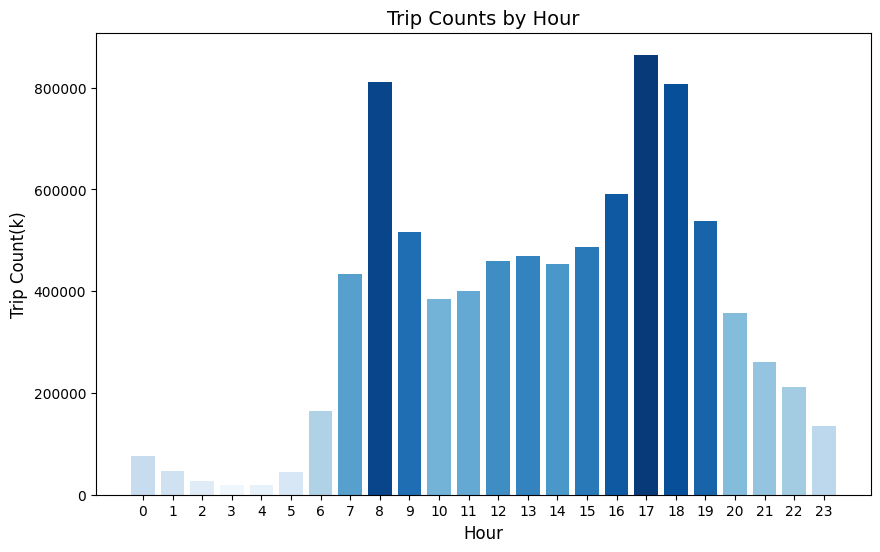

In [53]:
# count how many trips start in each hour
hourly_counts = trips_df.groupby('start_hour').size().reset_index(name='trip_count')

# sort by trip volume (so we can assign a smooth color gradient)
sorted_hourly = hourly_counts.sort_values(by='trip_count', ascending=True).reset_index(drop=True)

# generate a color palette and map each hour to a shade
colors = sns.color_palette("Blues", n_colors=len(sorted_hourly))
hour_to_color = dict(zip(sorted_hourly['start_hour'], colors))
bar_colors = hourly_counts['start_hour'].map(hour_to_color)

# plot with the manually assigned gradient colors
fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(hourly_counts['start_hour'], hourly_counts['trip_count'], color=bar_colors)

# tidy up formatting
ax.set_title("Trip Counts by Hour", fontsize=14)
ax.set_xlabel("Hour", fontsize=12)
ax.set_ylabel("Trip Count(k)", fontsize=12)
ax.set_xticks(range(0, 24))  # show all hours 0–23 on x-axis

# save with custom function
save_plot(fig, "trip_counts_by_hour_colored.png")

# quick preview of first few rows
hourly_counts.head()

#### Trip Counts by Day of Week
Bar chart of total cycle trips per weekday/weekend day. Bars are shaded by relative volume (lighter = fewer trips, darker = more). This helps spot weekly rhythm—e.g., stronger weekday demand for commuting vs. weekend uplift linked to leisure.

Plot saved to: outputs/plots\trip_counts_by_day_of_week_colored.png


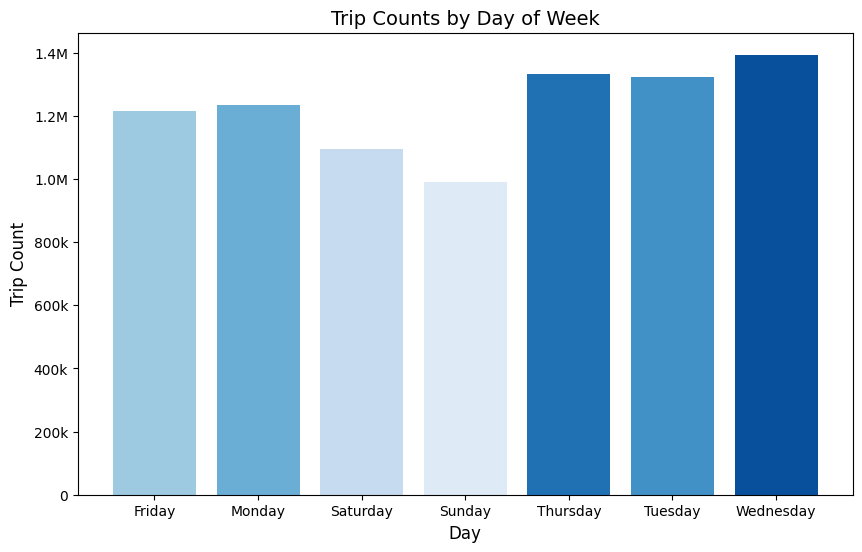

In [54]:
# total trips per day of week
dow_counts = trips_df.groupby('day_of_week').size().reset_index(name='trip_count')

# sort by volume so lighter → darker maps to fewer → more trips
sorted_dow = dow_counts.sort_values(by='trip_count', ascending=True).reset_index(drop=True)
colors = sns.color_palette("Blues", n_colors=len(sorted_dow))
day_to_color = dict(zip(sorted_dow['day_of_week'], colors))
bar_colors = dow_counts['day_of_week'].map(day_to_color)

# manual bar plot so we can control colours per bar
fig, ax = plt.subplots(figsize=(10, 6))
bars = ax.bar(dow_counts['day_of_week'], dow_counts['trip_count'], color=bar_colors)

# labels + title
ax.set_title("Trip Counts by Day of Week", fontsize=14)
ax.set_xlabel("Day", fontsize=12)
ax.set_ylabel("Trip Count", fontsize=12)

# tidy y-axis (e.g., 12k, 1.2M)
def millions_thousands_formatter(x, pos):
    if x >= 1_000_000:
        return f"{x/1_000_000:.1f}M"
    elif x >= 1_000:
        return f"{int(x/1000)}k"
    else:
        return str(int(x))

ax.yaxis.set_major_formatter(FuncFormatter(millions_thousands_formatter))

# save final figure 
save_plot(fig, "trip_counts_by_day_of_week_colored.png")

#### Weekday vs Weekend Trip Totals
Simple split of trips into weekday and weekend to show the weekly rhythm. This helps contrast commuting-heavy weekdays against leisure-leaning weekends and sets up later purpose inference based on temporal patterns.

Plot saved to: outputs/plots\trip_counts_by_weekpart_colored.png


,weekday_or_weekend,trip_count
0,Weekday,6495337
1,Weekend,2083555


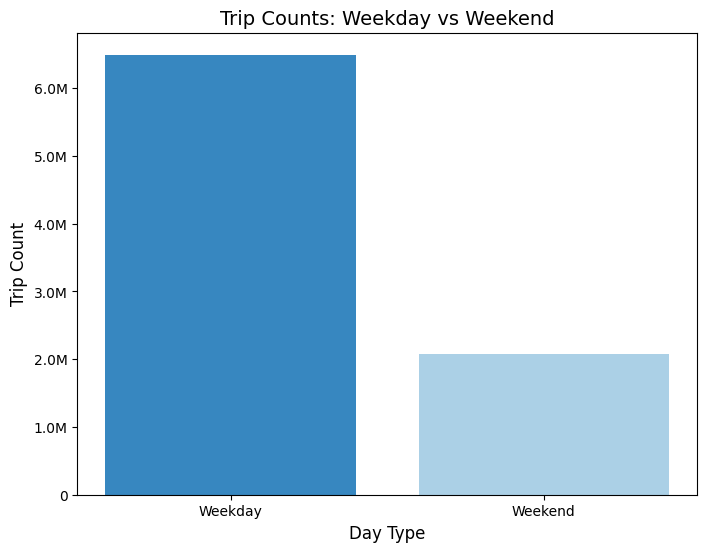

In [55]:
# total trips per day type
weekpart_counts = trips_df.groupby('weekday_or_weekend').size().reset_index(name='trip_count')

# map a simple colour gradient by relative volume
sorted_weekpart = weekpart_counts.sort_values(by='trip_count', ascending=True).reset_index(drop=True)
colors = sns.color_palette("Blues", n_colors=len(sorted_weekpart))
weekpart_to_color = dict(zip(sorted_weekpart['weekday_or_weekend'], colors))
bar_colors = weekpart_counts['weekday_or_weekend'].map(weekpart_to_color)

# bar plot
fig, ax = plt.subplots(figsize=(8, 6))
ax.bar(weekpart_counts['weekday_or_weekend'], weekpart_counts['trip_count'], color=bar_colors)

# labels + formatting
ax.set_title("Trip Counts: Weekday vs Weekend", fontsize=14)
ax.set_xlabel("Day Type", fontsize=12)
ax.set_ylabel("Trip Count", fontsize=12)

# format y-axis (e.g., 12k, 1.2M)
ax.yaxis.set_major_formatter(FuncFormatter(millions_thousands_formatter))

# save figure
save_plot(fig, "trip_counts_by_weekpart_colored.png")

# quick peek at the summary table
weekpart_counts


#### Hourly Trip Volume: Weekday vs Weekend
Line chart comparing hourly trip volumes for weekdays and weekends. Expect the classic commute peaks (AM/PM) on weekdays and a flatter, mid-day rise on weekends associated with leisure activity. This view helps motivate the rule-based labels and later model features that use start_hour and weekday_or_weekend.

Plot saved to: outputs/plots\trip_volume_by_hour_weekday_vs_weekend_colored.png


weekday_or_weekend,Weekday,Weekend
start_hour,,
0,40390,36011
1,21517,24598
2,12263,15397
3,8713,10425
4,13012,6890


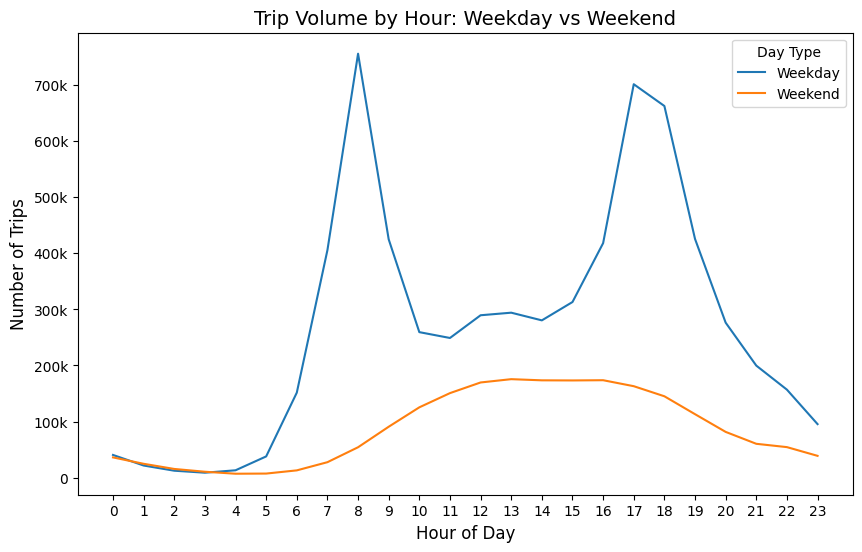

In [56]:
# pivot to get two columns (Weekday, Weekend) across hours 0–23
pivot_weekend_weekday = trips_df.pivot_table(
    index='start_hour',
    columns='weekday_or_weekend',
    aggfunc='size',
    fill_value=0
)

# set up the figure
fig, ax = plt.subplots(figsize=(10, 6))

# plot both series as lines on the same axes
pivot_weekend_weekday.plot(ax=ax)

# titles + axis labels
ax.set_title("Trip Volume by Hour: Weekday vs Weekend", fontsize=14)
ax.set_xlabel("Hour of Day", fontsize=12)
ax.set_ylabel("Number of Trips", fontsize=12)
ax.set_xticks(range(0, 24))  # show all hours 0–23
ax.legend(title="Day Type")

# nice y-axis formatter (e.g., 12k, 1.2M)
ax.yaxis.set_major_formatter(FuncFormatter(millions_thousands_formatter))

# save
save_plot(fig, "trip_volume_by_hour_weekday_vs_weekend_colored.png")

# quick peek at the first few rows
pivot_weekend_weekday.head()


#### Heatmap: Trips by Hour × Day of Week
Quick pivot to count trips per hour across the week, reorder days for a natural Mon→Sun flow, then plot a clean heatmap.

Plot saved to: outputs/plots\trip_heatmap_hour_vs_dayofweek.png


day_of_week,Monday,Tuesday,Wednesday,Thursday,Friday,Saturday,Sunday
start_hour,,,,,,,
0,8485,6096,6945,8390,10474,17872,18139
1,4997,3072,3459,4275,5714,11672,12926
2,2892,1643,1935,2437,3356,7502,7895
3,1905,1229,1437,1731,2411,5202,5223
4,2687,2356,2490,2576,2903,3601,3289


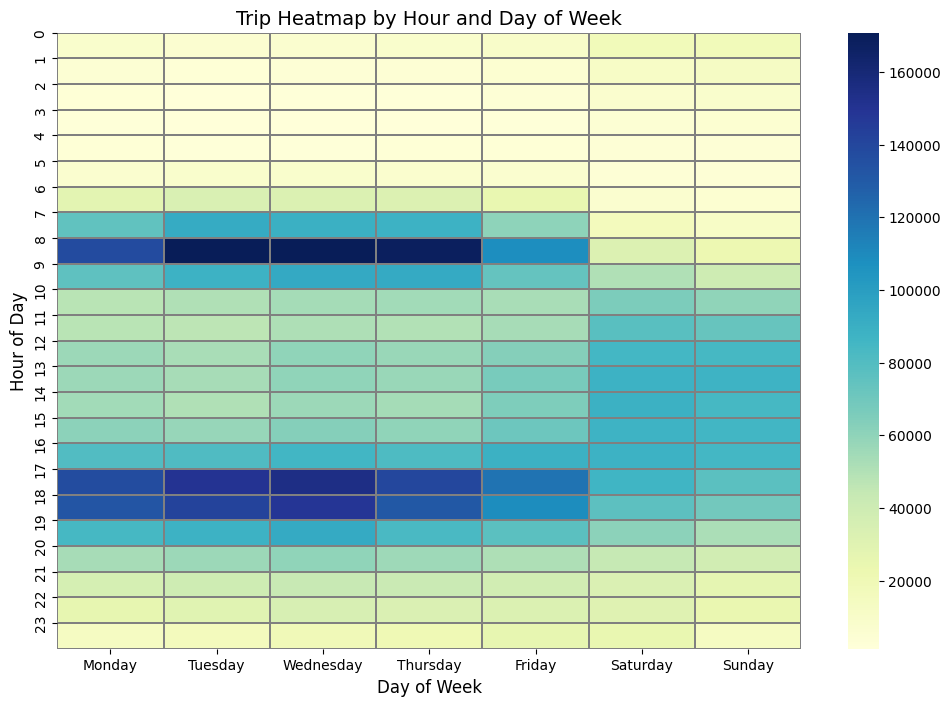

In [57]:
# build a simple hour x day matrix of trip counts
heatmap_data = trips_df.groupby(['start_hour', 'day_of_week']).size().unstack(fill_value=0)

# keep weekday order consistent (so plots read left-to-right like a calendar week)
day_order = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']
heatmap_data = heatmap_data[day_order]

# make the heatmap figure
fig, ax = plt.subplots(figsize=(12, 8))
sns.heatmap(
    heatmap_data,
    cmap="YlGnBu",          # nice readable palette for counts
    linewidths=0.3,         # thin grid lines so cells are separated
    linecolor='grey',
    ax=ax
)

# tidy up titles and axes
ax.set_title("Trip Heatmap by Hour and Day of Week", fontsize=14)
ax.set_xlabel("Day of Week", fontsize=12)
ax.set_ylabel("Hour of Day", fontsize=12)

# lock y-axis ticks to 0–23 so hours are explicit
ax.set_yticks(range(0, 24))
ax.set_yticklabels([str(h) for h in range(0, 24)])

# export the figure (uses your existing helper)
save_plot(fig, "trip_heatmap_hour_vs_dayofweek.png")

# quick peek at the matrix (sanity check)
heatmap_data.head()

#### Distribution of Distances to POIs
Histograms of trip distances to key points of interest (parks, schools, retail, transit). Each subplot shows how far trips typically start/end from these features.

Plot saved to: outputs/plots\distance_to_POIs_distribution.png


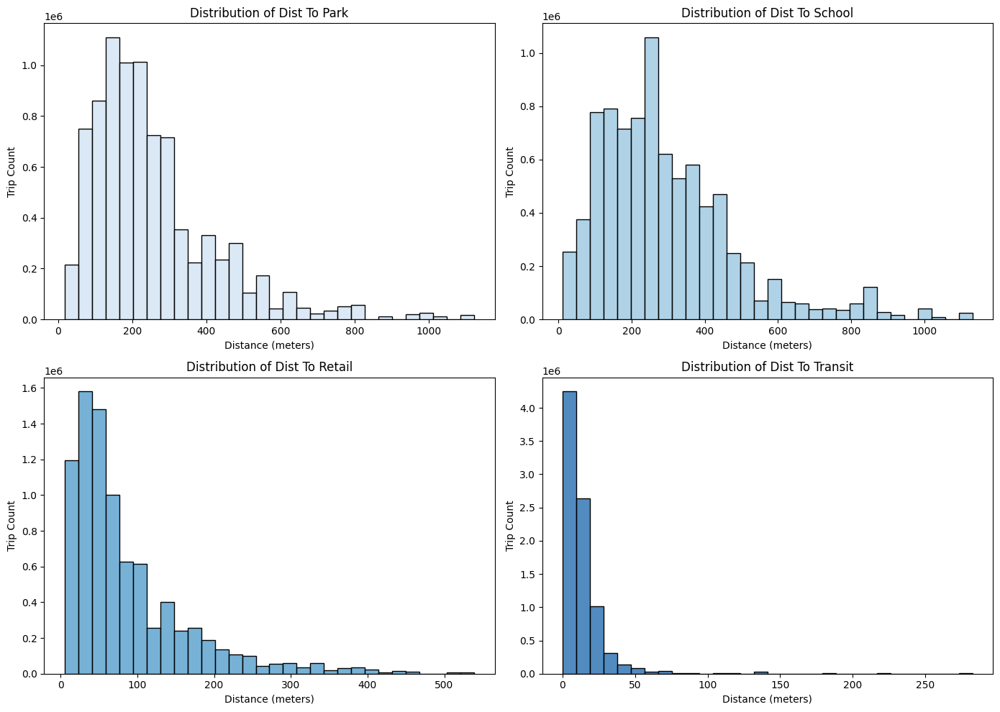

In [58]:
# columns that store calculated distance to each POI type
distance_cols = ['dist_to_park', 'dist_to_school', 'dist_to_retail', 'dist_to_transit']

# setup a 2x2 plot grid (1 chart per distance column)
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
axes = axes.flatten()

# create a gradient of blue shades (so each plot gets a unique tone)
colors = sns.color_palette("Blues", len(distance_cols))

# loop through the distance columns and plot their distributions
for i, col in enumerate(distance_cols):
    sns.histplot(
        data=trips_df,
        x=col,
        bins=30,                 # bin size for hist
        ax=axes[i],
        color=colors[i]
    )
    # give each subplot a descriptive title
    axes[i].set_title(f"Distribution of {col.replace('_', ' ').title()}", fontsize=12)
    axes[i].set_xlabel("Distance (meters)")
    axes[i].set_ylabel("Trip Count")

# adjust spacing and save the final 2x2 figure
plt.tight_layout()
save_plot(fig, "distance_to_POIs_distribution.png")


### Rationale for Distance Thresholds

The following thresholds were derived from the EDA histograms, which revealed that trip distances to relevant POIs are often skewed and exhibit specific cutoffs:

| Trip Purpose | POI Type | Distance Threshold | EDA Justification |
|--------------|----------|---------------------|-------------------|
| **Commute**  | Transit hub | ≤ 100 meters | Sharp peak near 0–50m confirms co-location | Anything more risks false positives, especially in central London where transit density is high |
| **Education**| School      | ≤ 200 meters | Broad peak 100–300m suggests wider spread | Conservative midpoint between precision and coverage |
| **Shopping** | Retail zone| ≤ 100 meters | Steep drop-off after 100m; retail typically embedded | Extending further risks capturing residential or mixed zones |
| **Leisure**  | Park        | ≤ 200 meters | Broad spread; many parks lie beyond 100m | Balances urban density vs suburban park distance |

### Final Rule-Based Logic

The final classification function evaluates each trip using a hierarchy of temporal and spatial rules:

1. **Education**: Trips starting between 7–9 AM or 2–5 PM near a school (≤ 200m).
2. **Commute**: Weekday trips during peak hours (7–9 AM, 5–6 PM) near a transit hub (≤ 100m).
3. **Shopping**: Trips between 11 AM and 3 PM near retail zones (≤ 100m).
4. **Leisure**: Trips occurring on weekends, between 10 AM and 6 PM, or near parks (≤ 200m).
5. **Fallback Rules**: Any remaining unclassified trips are assigned based on start hour alone, with labels and reasons recorded for transparency.

Each classification includes an associated reason string (e.g., `"Time+Transit"` or `"Fallback-Leisure"`) and binary rule indicators (e.g., `rule_is_commute`) to support future SHAP explainability analysis.

This structured approach ensures both rule transparency and alignment with observed spatio-temporal patterns in post-pandemic urban cycling behavior.


_______________________

## Rule-Based Trip Purpose Assignment (SHAP friendly)

Simple, transparent rules using time-of-day + proximity to POIs. It creates a single trip_purpose, a readable trip_purpose_reason, and boolean flags per rule so the model/SHAP can learn from these signals later.


In [59]:
# Transparent Rule-Based Trip Purpose Assignment (SHAP-compatible)
def assign_trip_purpose(
    df: pd.DataFrame,
    distance_cols: dict = {
        'school': 'dist_to_school',
        'transit': 'dist_to_transit',
        'retail': 'dist_to_retail',
        'park': 'dist_to_park'
    },
    distance_thresholds: dict = {
        'school': 200,    # meters: "close enough" to a school
        'transit': 100,   # meters: near a station/stop
        'retail': 100,    # meters: near shops
        'park': 200       # meters: near green space
    },
    edu_hours: list = [7, 8, 9, 14, 15, 16, 17],  # morning drop + afternoon pickup window
    commute_hours: list = [7, 8, 9, 17, 18],      # typical AM/PM peaks
    shopping_hours: tuple = (11, 15),             # midday shopping window (inclusive)
    leisure_hours: tuple = (10, 18),              # late morning through early evening
    print_summary: bool = True
) -> pd.DataFrame:
    """
    Infers trip purpose based on temporal patterns and POI proximity using rule-based logic.
    Adds:
        - Final trip purpose label
        - Reason string for explainability
        - SHAP-compatible binary rule flags for each purpose and fallback

    Notes/assumptions:
        - expects df to have: 'day_of_week', 'start_hour' and distance columns in meters
        - rule order matters (Education > Commute > Shopping > Leisure > Fallbacks)
        - flags are useful as model inputs and for SHAP interpretation

    Parameters:
        df (pd.DataFrame): Trip data with temporal and spatial proximity columns
        poi_flags (dict): Mapping of POI category to column name (binary flags)
        *_hours: Hour-based filters for each trip purpose category
        print_summary (bool): If True, print final purpose distribution

    Returns:
        pd.DataFrame: With columns:
            - 'trip_purpose'
            - 'trip_purpose_reason'
            - 'rule_is_<purpose>' binary flags
    """
    df = df.copy()
    df['trip_purpose'] = 'Unknown'          # default label until a rule assigns it
    df['trip_purpose_reason'] = 'Unassigned'  # why a label was given (for transparency)

    # boolean flags for SHAP-friendly features (so the model can "see" which rule fired)
    df['rule_is_edu'] = False
    df['rule_is_commute'] = False
    df['rule_is_shopping'] = False
    df['rule_is_leisure'] = False
    df['rule_is_fallback'] = False

    # weekend indicator (used by leisure rule)
    df['is_weekend'] = df['day_of_week'].isin(['Saturday', 'Sunday'])

    # --- Education Rule ---
    # time hits school windows + near a school POI
    edu_mask = (
        (df['trip_purpose'] == 'Unknown') &
        df['start_hour'].isin(edu_hours) &
        (df[distance_cols['school']] <= distance_thresholds['school'])
    )
    df.loc[edu_mask, ['trip_purpose', 'trip_purpose_reason']] = ['Education', 'Time+School']
    df.loc[edu_mask, 'rule_is_edu'] = True

    # --- Commute Rule ---
    # weekday + commute peaks + close to transit
    commute_mask = (
        (df['trip_purpose'] == 'Unknown') &
        (df['day_of_week'].isin(['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday'])) &
        df['start_hour'].isin(commute_hours) &
        (df[distance_cols['transit']] <= distance_thresholds['transit'])
    )
    df.loc[commute_mask, ['trip_purpose', 'trip_purpose_reason']] = ['Commute', 'Time+Transit']
    df.loc[commute_mask, 'rule_is_commute'] = True

    # --- Shopping Rule ---
    # midday-ish + near retail
    shopping_mask = (
        (df['trip_purpose'] == 'Unknown') &
        df['start_hour'].between(*shopping_hours) &
        (df[distance_cols['retail']] <= distance_thresholds['retail'])
    )
    df.loc[shopping_mask, ['trip_purpose', 'trip_purpose_reason']] = ['Shopping', 'Time+Retail']
    df.loc[shopping_mask, 'rule_is_shopping'] = True

    # --- Leisure Rule ---
    # weekend OR leisure hours OR near a park
    leisure_mask = (
        (df['trip_purpose'] == 'Unknown') &
        (
            df['is_weekend'] |
            df['start_hour'].between(*leisure_hours) |
            (df[distance_cols['park']] <= distance_thresholds['park'])
        )
    )
    df.loc[leisure_mask, ['trip_purpose', 'trip_purpose_reason']] = ['Leisure', 'Time|Park|Weekend']
    df.loc[leisure_mask, 'rule_is_leisure'] = True

    # --- Fallback Rules ---
    # if nothing matched, use time-only heuristics to avoid 'Unknown'
    fallback_mask = df['trip_purpose'] == 'Unknown'
    df.loc[fallback_mask & df['start_hour'].between(7, 9),  ['trip_purpose', 'trip_purpose_reason']] = ['Commute',   'Fallback-Time-AM']
    df.loc[fallback_mask & df['start_hour'].between(14, 17), ['trip_purpose', 'trip_purpose_reason']] = ['Education', 'Fallback-Time-PM']
    df.loc[fallback_mask & df['start_hour'].between(11, 14), ['trip_purpose', 'trip_purpose_reason']] = ['Shopping',  'Fallback-Time-Midday']
    df.loc[df['trip_purpose'] == 'Unknown', ['trip_purpose', 'trip_purpose_reason']] = ['Leisure', 'Fallback-Leisure']
    df.loc[fallback_mask, 'rule_is_fallback'] = True

    # quick sanity check on label mix
    if print_summary:
        print("\nFinal Trip Purpose Distribution:")
        print(df['trip_purpose'].value_counts(normalize=True).mul(100).round(2).to_string())

    return df

# Apply the updated function to the working trips dataframe
trips_df = assign_trip_purpose(trips_df)


Final Trip Purpose Distribution:
trip_purpose
Leisure      42.69
Commute      25.30
Education    16.36
Shopping     15.65


### Hex-Level Aggregation & Summary Stats
Group trips by start hex and assigned purpose, build a purpose-by-hex matrix, then create a compact stats table (totals, mean per hex, dispersion, tails, zeros) for each purpose.

In [60]:
# Aggregate trips to hex-by-purpose
purpose_cols_order = ["Leisure", "Commute", "Shopping", "Education"]

# count trips per (hex, purpose) and pivot to wide format
hex_mat = (
    trips_df
    .groupby(['start_hex_id', 'trip_purpose'])
    .size()
    .unstack(fill_value=0)
    .reindex(columns=purpose_cols_order, fill_value=0)  # lock column order for consistency downstream
)

# helper column to know overall volume per hex
hex_mat['total_trips'] = hex_mat.sum(axis=1)

# Create stats table
def purpose_stats_table(hex_mat, purpose_cols):
    # only consider hexes that have at least 1 trip (avoids inflating zeros in stats)
    labelled = hex_mat.loc[hex_mat["total_trips"] > 0, purpose_cols]
    total_all = labelled.values.sum()
    rows = []

    # loop through each purpose column and compute summary stats
    for col in purpose_cols:
        s = labelled[col]  # per-hex counts for this purpose

        rows.append({
            "Trip Purpose": col,
            "Total Trips": int(s.sum()),                     # overall volume for this purpose
            "Mean Trips per Hex": float(s.mean()),           # average density across active hexes
            "Std Dev": float(s.std(ddof=1)),                 # spread (sample std)
            "Median": float(s.median()),                     # typical hex volume
            "Min": int(s.min()),
            "Max": int(s.max()),
            "Percentage Share": round(100 * s.sum() / total_all, 2),  # share out of all labelled trips
            "Hexes with Zero Trips": int((s == 0).sum()),    # sparsity indicator
            "Skewness": float(skew(s, bias=False)),          # tail to the right if > 0
            "Kurtosis (excess)": float(kurtosis(s, bias=False))  # >0 = heavier tails than normal
        })

    return pd.DataFrame(rows)

# build the stats table for the ordered purposes
stats_df = purpose_stats_table(hex_mat, purpose_cols_order)

# quick look at the summary table
print(stats_df)

  Trip Purpose  Total Trips  Mean Trips per Hex      Std Dev  Median  Min  \
0      Leisure      3661937         6022.922697  4666.715772  4778.5    6   
1      Commute      2170575         3570.024671  3962.256745  2816.5    0   
2     Shopping      1342928         2208.763158  2683.400518  1640.0    0   
3    Education      1403452         2308.309211  3605.820688     0.0    0   

     Max  Percentage Share  Hexes with Zero Trips  Skewness  Kurtosis (excess)  
0  33921             42.69                      0  2.341659           8.317367  
1  47716             25.30                      6  4.320355          34.699877  
2  28780             15.65                    205  2.707181          16.545822  
3  26552             16.36                    361  2.139503           6.602659  


### Visualising Trip Purpose Distribution

The bar chart below illustrates the proportional breakdown of inferred trip purposes across all records. This visualization validates the effectiveness of the rule-based labeling and helps compare against government-reported trends (e.g. DfT 2024).

Each bar shows the percentage of trips classified as:
- **Leisure**
- **Commute**
- **Shopping**
- **Education**


Plot saved to: outputs/plots\trip_purpose_distribution.png


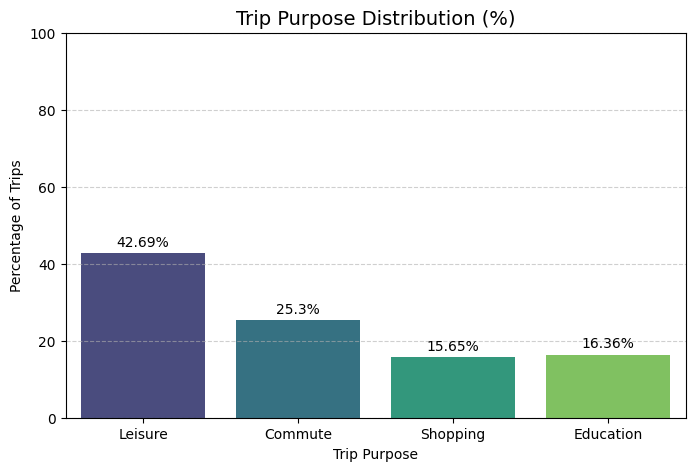

In [61]:
#  Plot and Save Trip Purpose Distribution
def plot_trip_purpose_distribution(
    df: pd.DataFrame,
    column: str = 'trip_purpose',
    filename: str = "trip_purpose_distribution.png"
):
    """
    Plots a bar chart showing the percentage distribution of trip purposes.

    Parameters:
        df (pd.DataFrame): Input DataFrame containing classified trip purposes
        column (str): Column to plot (default = 'trip_purpose')
        filename (str): Output filename to save the plot (PNG format)

    Returns:
        None
    """

    # calculate percentages for each purpose
    proportions = df[column].value_counts(normalize=True).mul(100).round(2)
    proportions = proportions.reindex(['Leisure', 'Commute', 'Shopping', 'Education'])

    # build the bar chart
    fig, ax = plt.subplots(figsize=(8, 5))
    sns.barplot(
        x=proportions.index,
        y=proportions.values,
        ax=ax,
        hue=proportions.index,   # use hue just for color mapping
        palette='viridis',
        legend=False             # no need a separate legend since x-axis has labels
    )

    # put percentage labels above each bar
    for i, val in enumerate(proportions.values):
        ax.text(i, val + 1, f"{val}%", ha='center', va='bottom', fontsize=10)

    # tidy up axes and title
    ax.set_title("Trip Purpose Distribution (%)", fontsize=14)
    ax.set_ylabel("Percentage of Trips")
    ax.set_xlabel("Trip Purpose")
    ax.set_ylim(0, 100)  # lock scale 0–100%
    ax.grid(axis='y', linestyle='--', alpha=0.6)

    # save the figure and show it
    save_plot(fig, filename)
    plt.show()

# run the function on the classified trips
plot_trip_purpose_distribution(trips_df)

## Predicting the Amount of Trip Purposes per Hexagon

In [62]:
# make sure the key columns are present before grouping
assert 'start_hex_id' in trips_df.columns
assert 'trip_purpose' in trips_df.columns

#### Hex-Level Feature Aggregation
For each start hex, calculate summary stats: total trip counts, average trip start hour, weekend share, and mean proximity to POIs. This forms the feature matrix for modeling.

In [63]:
# Aggregate features for each start_hex_id
hex_features = (
    trips_df.groupby('start_hex_id')
    .agg({
        'trip_purpose': 'count',   # how many trips started from this hex
        'start_hour': 'mean',      # average starting hour of trips
        'is_weekend': 'mean',      # proportion of trips that fall on weekends (0–1)
        'dist_to_park': 'mean',    # avg distance to nearest park
        'dist_to_school': 'mean',  # avg distance to nearest school
        'dist_to_retail': 'mean',  # avg distance to nearest retail
        'dist_to_transit': 'mean'  # avg distance to nearest transit
    })
    .rename(columns={              # rename for clarity + model readability
        'trip_purpose': 'total_trips',
        'start_hour': 'avg_start_hour',
        'is_weekend': 'weekend_ratio',
        'dist_to_park': 'avg_dist_park',
        'dist_to_school': 'avg_dist_school',
        'dist_to_retail': 'avg_dist_retail',
        'dist_to_transit': 'avg_dist_transit'
    })
    .reset_index()
)

# quick peek at the aggregated features table
print(hex_features.head())

      start_hex_id  total_trips  avg_start_hour  weekend_ratio  avg_dist_park  \
0  89194ad1003ffff        19553       12.059633       0.255920      85.122726   
1  89194ad100bffff         4926       12.748477       0.228583      76.681119   
2  89194ad1023ffff        13874       12.248811       0.304382     364.246325   
3  89194ad104bffff         9350       12.252406       0.279786     251.219736   
4  89194ad104fffff         8008       11.913836       0.216908     371.795063   

   avg_dist_school  avg_dist_retail  avg_dist_transit  
0       252.778896       156.595132          4.211326  
1       248.545697       273.562450          2.366546  
2       425.471992        40.935234          5.738166  
3       417.758593        46.343402          9.027645  
4       617.742393        15.604557         25.842082  


#### Choropleth Grid of Trip Purposes
Reusable plotting function: renders a 2×2 grid of hex maps (Commute, Education, Leisure, Shopping). Works with both observed (obs_*) and predicted (pred_*) values. Auto-bins data using log/quantile/fixed strategy, overlays boundary if given, and adds basemap, north arrow, and scale bar for context.

In [64]:
def plot_trip_purposes_grid(
    gdf_pred,
    purposes=("commute", "education", "leisure", "shopping"),
    value_prefix="pred_",              # set to "obs_" for observed, "pred_" for predictions
    classification_bins=None,          # dict of bins per column; if None, will auto-compute from the shown data
    overlay_boundary=None,
    background_extent=None,
    cmap="YlOrRd",
    edgecolor="black",
    alpha=0.85,
    filename="trip_purposes_grid.png",
    title_prefix=None,                 # e.g. "Observed" or "Predicted"
    bins_strategy="log",
    bins_k=6
):
    """
    Renders a 2x2 grid of choropleths for the specified purposes using columns named
    f"{value_prefix}{purpose}". This makes the function reusable for both observed (obs_*)
    and predicted (pred_*) values.

    If classification_bins is None, bins are computed from the data currently being plotted.
    """

    # titles for the four subplots
    title_prefix = title_prefix or ("Predicted" if value_prefix == "pred_" else "Observed")
    titles = [f"{title_prefix} {p.capitalize()} Trips" for p in purposes]

    # reproject to Web Mercator so basemap tiles align
    gdf_web = gdf_pred.to_crs(epsg=3857).copy()

    # auto-compute classification bins for choropleth shading
    def _auto_bins(series):
        vals = series.dropna()
        vals = vals[vals > 0]
        if len(vals) == 0:
            return [0, 1]
        if bins_strategy == "log":
            lo = max(1, np.percentile(vals, 1))
            hi = np.percentile(vals, 99.5)
            return np.round(np.geomspace(lo, hi, bins_k)).astype(int).tolist()
        elif bins_strategy == "quantile":
            return sorted(np.unique(np.percentile(vals, np.linspace(0, 100, bins_k + 1))).astype(int).tolist())
        elif bins_strategy == "fixed":
            return [0, 100, 500, 1000, 3000, 10000]
        else:
            raise ValueError("Unsupported bins_strategy.")

    # if no bins supplied, build one per column
    if classification_bins is None:
        classification_bins = {}
        for p in purposes:
            col = f"{value_prefix}{p}"
            classification_bins[col] = _auto_bins(gdf_pred[col])

    # 2x2 plot grid
    fig, axs = plt.subplots(2, 2, figsize=(16, 14), constrained_layout=True)
    axs = axs.flatten()

    for idx, p in enumerate(purposes):
        ax = axs[idx]
        col = f"{value_prefix}{p}"
        bins = classification_bins[col]

        # color mapping
        cmap_func = plt.get_cmap(cmap)
        norm = mcolors.BoundaryNorm(bins, cmap_func.N)

        # assign bins per hex
        gdf_web["__bin"] = pd.cut(gdf_web[col], bins=bins, include_lowest=True)

        # plot hexes with no trips (just outlines in light grey)
        empty = gdf_web[gdf_web["__bin"].isna()]
        if not empty.empty:
            empty.plot(ax=ax, facecolor="none", edgecolor="lightgrey", linewidth=0.4, alpha=1.0)

        # plot hexes with trips, shaded by bin
        filled = gdf_web[gdf_web["__bin"].notna()]
        if not filled.empty:
            filled.plot(column="__bin", cmap=cmap_func, edgecolor=edgecolor, linewidth=0.2, alpha=alpha, ax=ax)

        # custom legend from bins
        handles = [
            mpatches.Patch(color=cmap_func(norm(bins[i])), label=f"{int(bins[i])}–{int(bins[i+1])}")
            for i in range(len(bins)-1)
        ]
        handles.append(mpatches.Patch(color="lightgrey", label="No Trips"))
        ax.legend(handles=handles, title=f"{title_prefix} Trips", title_fontsize=10,
                  fontsize=9, loc="upper left", frameon=True)

        # overlay boundary if given
        if overlay_boundary is not None:
            overlay_web = overlay_boundary.to_crs(epsg=3857)
            overlay_web.boundary.plot(ax=ax, color='gray', linewidth=1.5, linestyle='--', alpha=0.6)

        # zoom to a specific background extent if provided
        if background_extent is not None:
            extent_web = background_extent.to_crs(epsg=3857)
            minx, miny, maxx, maxy = extent_web.total_bounds
            pad_x = (maxx - minx) * 0.05
            pad_y = (maxy - miny) * 0.05
            ax.set_xlim(minx - pad_x, maxx + pad_x)
            ax.set_ylim(miny - pad_y, maxy + pad_y)

        # basemap + cartographic extras
        ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron)
        arrow = FancyArrowPatch((0.92, 0.12), (0.92, 0.22), transform=ax.transAxes,
                                arrowstyle='-|>', mutation_scale=15, color='black')
        ax.add_patch(arrow)
        ax.text(0.915, 0.235, 'N', transform=ax.transAxes, ha='center', va='center',
                fontsize=12, fontweight='bold')
        scalebar = ScaleBar(dx=1, units="m", location='lower right', scale_loc='bottom', length_fraction=0.1)
        ax.add_artist(scalebar)

        ax.set_title(titles[idx], fontsize=14, pad=12)
        ax.set_axis_off()

    # save and show final figure
    save_plot(fig, filename)
    plt.show()

In [65]:
# grab all unique hex IDs from trip-hex mapping
all_hex_df = gdf_trips_hexes[['hex_id']].drop_duplicates().copy()
all_hex_df = all_hex_df.rename(columns={'hex_id': 'start_hex_id'})  # align name with trip features

# merge aggregated trip features (only 608 hexes have trips)
# result keeps every hex, with NaNs where no trips occurred
hex_all_merged = pd.merge(all_hex_df, hex_features, on='start_hex_id', how='left')


##### Convert Hex IDs to GeoDataFrame
Takes H3 hex IDs, extracts centroid lat/lon, and builds a GeoDataFrame with Point geometries.

In [66]:
def add_geometry_from_hex(df: pd.DataFrame, hex_col: str = 'start_hex_id') -> gpd.GeoDataFrame:
    """
    Converts a DataFrame with H3 hex IDs to a GeoDataFrame with Point geometries
    based on hexagon centroids.
    """
    # lookup lat/lon for each hex centroid
    df['lat'], df['lon'] = zip(*df[hex_col].map(lambda h: h3.cell_to_latlng(h)))
    
    # turn into shapely Points (lon, lat) and wrap into GeoDataFrame
    df['geometry'] = df.apply(lambda row: Point(row['lon'], row['lat']), axis=1)
    return gpd.GeoDataFrame(df, geometry='geometry', crs='EPSG:4326')

In [67]:
# Aggregate target trip purpose counts
trip_counts = (
    trips_df.groupby(['start_hex_id', 'trip_purpose'])
    .size()                    # count trips for each (hex, purpose)
    .unstack(fill_value=0)     # pivot so each purpose is a column
    .reset_index()             # bring hex ID back as a column
    .rename(columns={          # rename for consistency and clarity
        'Commute': 'amount_commute',
        'Education': 'amount_education',
        'Leisure': 'amount_leisure',
        'Shopping': 'amount_shopping'
    })
)

In [68]:
# Build a base GeoDataFrame covering ALL hexes (3,687)
base_hexes = (
    hex_all_merged[['start_hex_id']]
    .drop_duplicates()             # remove duplicates to keep one row per hex
    .astype({'start_hex_id': str}) # make sure IDs are strings
    .copy()
)

# attach centroid geometries (EPSG:4326 lat/lon)
gdf_all = add_geometry_from_hex(base_hexes, hex_col='start_hex_id')

# Prepare observed columns (rename amount_* → obs_*)
trip_counts_obs = (
    trip_counts
    .astype({'start_hex_id': str})   # align ID type
    .rename(columns={                # make naming consistent
        'amount_commute':   'obs_commute',
        'amount_education': 'obs_education',
        'amount_leisure':   'obs_leisure',
        'amount_shopping':  'obs_shopping'
    })
)

# merge trip counts onto all hexes (hexes with no trips → 0)
gdf_all = gdf_all.merge(trip_counts_obs, on='start_hex_id', how='left').fillna(0)

# count how many hexes have at least 1 observed trip
n_obs_hexes = (
    gdf_all[['obs_commute','obs_education','obs_leisure','obs_shopping']]
    .sum(axis=1) > 0
).sum()
print(f"Observed trip data present in {n_obs_hexes} / {len(gdf_all)} hexes.")


Observed trip data present in 608 / 3687 hexes.


Plot saved to: outputs/plots\grid_observed.png


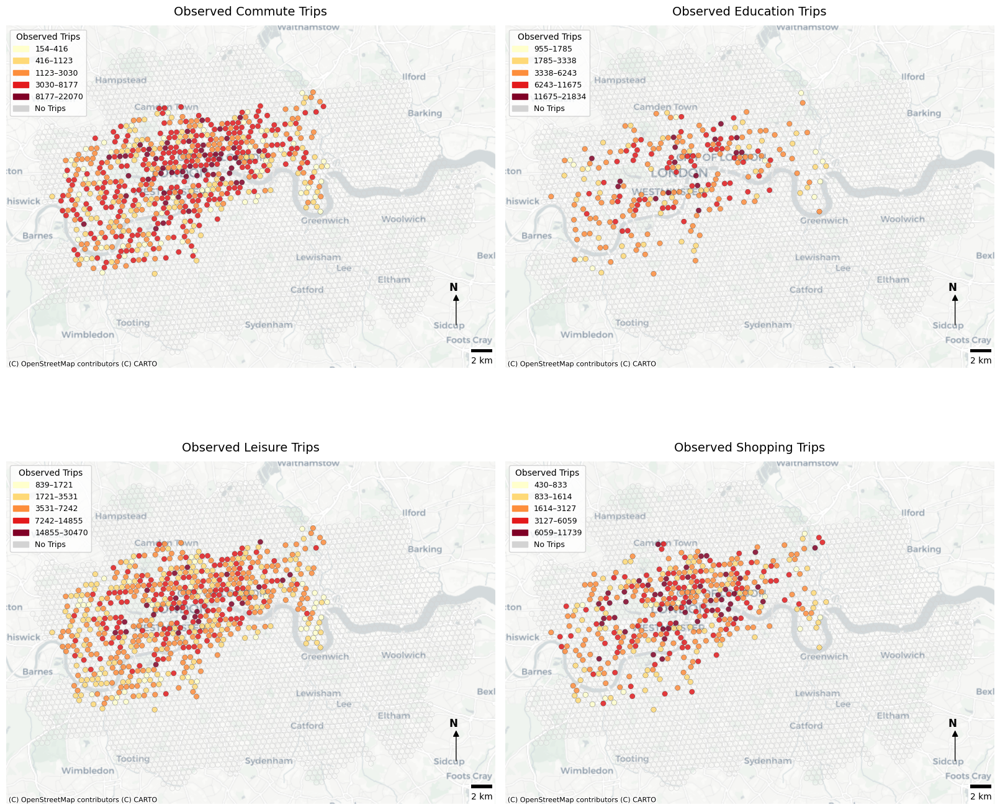

In [70]:
# Plot the observed trip-purpose distributions
plot_trip_purposes_grid(
    gdf_pred=gdf_all,          # full GeoDataFrame with obs_* columns
    value_prefix="obs_",       # tells the function to use observed columns
    title_prefix="Observed",   # map titles will say "Observed"
    filename="grid_observed.png"
)

#### Final Hex GeoDataFrame
Rename the ID column to hex_id for consistency, and keep a working copy (hex_gdf) to use in later analysis.

In [71]:
# standardize column naming for hex IDs
gdf_all = gdf_all.rename(columns={"start_hex_id": "hex_id"})

# keep a working copy for modeling and plotting
hex_gdf = gdf_all

### Dominant Trip Purpose per Hex: Build + Map

Compute each hex’s dominant purpose (with a deterministic tie-break if needed) and its dominance share.

Plot a clean map with optional background hex grid, admin boundary, basemap, north arrow, and scalebar. 

In [72]:
# Dominant trip purpose per hex: build + basemapped plot
def build_dominant_purpose_gdf(
    hex_mat: pd.DataFrame,
    hex_gdf: gpd.GeoDataFrame,
    *,
    key_col: str = "hex_id",
    purpose_cols: list[str] = None,
    tie_break_priority: list[str] = None
) -> gpd.GeoDataFrame:
    """
    Create a GeoDataFrame with the dominant trip purpose and dominance share for each labelled hex.
    """
    if purpose_cols is None:
        raise ValueError("Provide purpose_cols, e.g. ['Leisure','Commute','Shopping','Education'].")

    # ensure we can join on key_col from both sides (either as column or index)
    mat = hex_mat.copy()
    if key_col not in mat.columns:
        if mat.index.name == key_col:
            mat = mat.reset_index()
        else:
            raise KeyError(f"'{key_col}' not found as a column or index in hex_mat.")
    if key_col not in hex_gdf.columns:
        if hex_gdf.index.name == key_col:
            hex_gdf = hex_gdf.reset_index()
        else:
            raise KeyError(f"'{key_col}' not found as a column or index in hex_gdf.")

    # make sure total_trips exists (sum across the purpose columns)
    if "total_trips" not in mat.columns:
        mat["total_trips"] = mat[purpose_cols].sum(axis=1)

    # keep only hexes with trips + dedupe on key_col
    labelled = mat.loc[mat["total_trips"] > 0, [key_col] + purpose_cols + ["total_trips"]].copy()
    labelled = labelled.drop_duplicates(subset=key_col).set_index(key_col)

    # compute dominant purpose per hex (vectorized); ties possible
    values = labelled[purpose_cols].to_numpy()
    max_per_row = values.max(axis=1, keepdims=True)
    max_mask = (values == max_per_row)

    # default tie-break = first max encountered in purpose_cols (left-to-right)
    dom_idx = max_mask.argmax(axis=1)

    # custom tie-break priority (e.g., ["Commute","Education","Shopping","Leisure"])
    if tie_break_priority is not None:
        priority_order = {p: i for i, p in enumerate(tie_break_priority)}
        for r in range(max_mask.shape[0]):
            tied_cols = [c for c, m in enumerate(max_mask[r]) if m]
            if len(tied_cols) > 1:
                dom_idx[r] = min(
                    tied_cols,
                    key=lambda c: priority_order.get(purpose_cols[c], len(priority_order) + c)
                )

    # dominant value and share (fraction of total trips in that hex)
    dominant_values = values[np.arange(values.shape[0]), dom_idx]
    dominant_share = (dominant_values / labelled["total_trips"].to_numpy()).astype(float)

    # tidy output for merge with geometry
    dom_df = pd.DataFrame({
        key_col: labelled.index,
        "dominant_purpose": [purpose_cols[i] for i in dom_idx],
        "dominant_share": dominant_share
    })

    # inner join so we only plot hexes that exist in both datasets
    out = hex_gdf.merge(dom_df, on=key_col, how="inner")
    return out

In [ ]:
def plot_dominant_purpose_map(
    dom_gdf: gpd.GeoDataFrame,
    *,
    filename: str = "dominant_purpose_map.png",
    overlay_boundary: gpd.GeoDataFrame | None = None,
    background_extent: gpd.GeoDataFrame | None = None,
    palette: dict | None = None,
    alpha_fill: float = 0.95,
    edgecolor: str = "white",
    linewidth: float = 0.15,
    title: str = "Dominant Trip Purpose per Hexagon",
    annotate_share: bool = False,
    share_thresholds: tuple[float, float] = (0.5, 0.75),
    background_hexes: gpd.GeoDataFrame | None = None,   # pass your full hex grid here
    background_linewidth: float = 0.15,
    background_alpha: float = 0.35,
    background_edgecolor: str = "black"
):
    # fallback color palette if none provided
    if palette is None:
        palette = {
            "Leisure":   "#1f78b4",
            "Commute":   "#e31a1c",
            "Shopping":  "#33a02c",
            "Education": "#ffb300",
        }

    # basic input check
    req_cols = {"dominant_purpose", "dominant_share", "geometry"}
    missing = req_cols - set(dom_gdf.columns)
    if missing:
        raise KeyError(f"dom_gdf is missing required columns: {missing}")

    # project to Web Mercator for tile basemap alignment
    g_web = dom_gdf.to_crs(epsg=3857).copy()
    g_web["__color"] = g_web["dominant_purpose"].map(palette).fillna("#999999")

    fig, ax = plt.subplots(1, 1, figsize=(10, 10))

    # draw optional background grid (just outlines)
    if background_hexes is not None and not background_hexes.empty:
        bg_web = background_hexes.to_crs(epsg=3857)
        bg_web.plot(
            ax=ax,
            facecolor="none",
            edgecolor=background_edgecolor,
            linewidth=background_linewidth,
            alpha=background_alpha,
            zorder=1
        )

    # main filled hexes colored by dominant purpose
    g_web.plot(
        color=g_web["__color"],
        edgecolor=edgecolor,
        linewidth=linewidth,
        alpha=alpha_fill,
        ax=ax,
        zorder=2
    )

    # admin boundary overlay
    if overlay_boundary is not None:
        overlay_boundary.to_crs(epsg=3857).boundary.plot(
            ax=ax, color='gray', linewidth=1.5, linestyle='--', alpha=0.7, zorder=3
        )

    # optional zoom control
    if background_extent is not None:
        extent_web = background_extent.to_crs(epsg=3857)
        minx, miny, maxx, maxy = extent_web.total_bounds
        pad_x = (maxx - minx) * 0.05
        pad_y = (maxy - miny) * 0.05
        ax.set_xlim(minx - pad_x, maxx + pad_x)
        ax.set_ylim(miny - pad_y, maxy + pad_y)

    # basemap tiles (light theme)
    ctx.add_basemap(ax, source=ctx.providers.CartoDB.Positron, zorder=0)

    # cartographic bits: north arrow + scalebar
    arrow = FancyArrowPatch((0.92, 0.12), (0.92, 0.22), transform=ax.transAxes,
                            arrowstyle='-|>', mutation_scale=15, color='black')
    ax.add_patch(arrow)
    ax.text(0.915, 0.235, 'N', transform=ax.transAxes, ha='center', va='center',
            fontsize=12, fontweight='bold')

    scalebar = ScaleBar(dx=1, units="m", location='lower right', scale_loc='bottom', length_fraction=0.12)
    ax.add_artist(scalebar)

    # legend from the palette
    legend_elems = [Line2D([0], [0], marker='s', color='w', label=k,
                           markerfacecolor=v, markersize=10) for k, v in palette.items()]
    ax.legend(handles=legend_elems, loc="lower left", frameon=True, title="Dominant Purpose")

    ax.set_title(title, fontsize=14, pad=12)
    ax.set_axis_off()
    plt.tight_layout()

    # save final map 
    save_plot(fig, filename)
    plt.show()

In [73]:
# make a copy so original hex_mat stays untouched
hex_mat = hex_mat.copy()

# just rename the index to 'hex_id' (keeps it as index, no new col created)
hex_mat.index.name = "hex_id"

#### Compute & Plot Dominant Trip Purpose
Build the dominant-purpose GeoDataFrame (with a clear tie-break order), then render the map with background hex grid and optional admin boundaries.

Plot saved to: outputs/plots\dominant_purpose_map.png


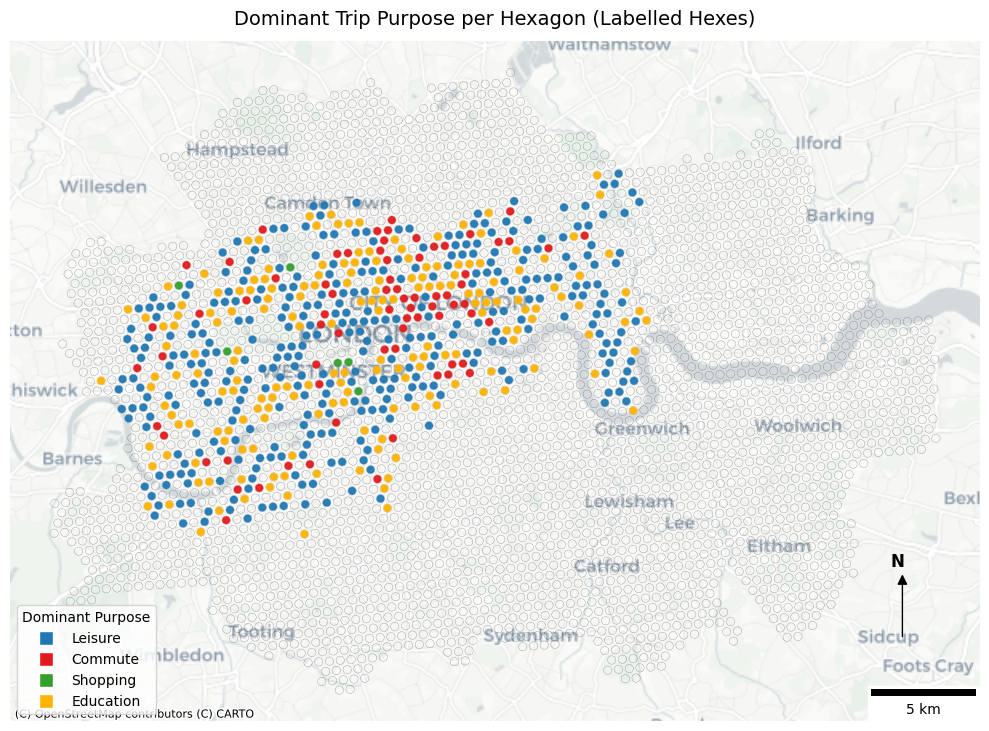

In [74]:
# build the dominant-purpose GeoDataFrame
dom_gdf = build_dominant_purpose_gdf(
    hex_mat=hex_mat,            # hex-by-purpose matrix (index named 'hex_id')
    hex_gdf=hex_gdf,            # full hex grid with geometry
    key_col="hex_id",
    purpose_cols=["Leisure","Commute","Shopping","Education"],
    tie_break_priority=["Commute","Leisure","Shopping","Education"]  # deterministic tie-break
)

# plot the dominant purpose map
plot_dominant_purpose_map(
    dom_gdf=dom_gdf,
    filename="dominant_purpose_map.png",
    overlay_boundary=inner_london_boundary if 'inner_london_boundary' in globals() else None,  # dashed admin outline
    background_extent=london_boundary if 'london_boundary' in globals() else None,              # zoom to London bounds
    background_hexes=hex_gdf,        # draw the full hex grid as faint outlines
    background_linewidth=0.25,
    background_alpha=0.45,
    background_edgecolor="black",
    title="Dominant Trip Purpose per Hexagon (Labelled Hexes)"
)

### Moran’s I Workflow (Hex Mode)
##### merge a single-purpose column onto hex polygons

In [ ]:
# Moran's I: Hex Mode Refactor
def merge_purpose_to_hex(
    hex_mat: pd.DataFrame,
    hex_gdf: gpd.GeoDataFrame,
    purpose: str
) -> gpd.GeoDataFrame:
    """
    Merge one trip purpose distribution from hex_mat onto hex_gdf polygons.
    Works when hex_mat has 'hex_id' as index or column.

    Returns:
        GeoDataFrame with: ['hex_id', purpose, 'total_trips', 'geometry'].
        Filters out hexes with zero total_trips.
    """
    # basic guard: purpose must exist
    if purpose not in hex_mat.columns:
        raise KeyError(f"Purpose '{purpose}' not found in hex_mat columns.")

    # make sure we have 'hex_id' as a column (supports both index and column forms)
    if hex_mat.index.name == "hex_id":
        df = hex_mat.reset_index()
    elif "hex_id" in hex_mat.columns:
        df = hex_mat.copy()
    else:
        raise KeyError("'hex_id' not found as a column or index in hex_mat.")

    # keep only what's needed for join + analysis
    if "total_trips" not in df.columns:
        raise KeyError("'total_trips' column is required in hex_mat.")
    df = df[["hex_id", purpose, "total_trips"]]

    # ensure geometry frame also exposes 'hex_id'
    if "hex_id" not in hex_gdf.columns:
        if hex_gdf.index.name == "hex_id":
            hex_gdf = hex_gdf.reset_index()
        else:
            raise KeyError("'hex_id' not found in hex_gdf.")

    # left-join purpose counts onto polygons
    out = hex_gdf.merge(df, on="hex_id", how="left")

    # fill missing numeric columns and drop hexes with zero activity
    out[[purpose, "total_trips"]] = out[[purpose, "total_trips"]].fillna(0)
    out = out[out["total_trips"] > 0].copy()

    # if everything disappeared, surface it early
    if out.empty:
        raise ValueError(f"No active hexes found after merging for purpose '{purpose}'.")

    return out

##### build spatial weights (Queen or KNN fallback)

In [ ]:
def build_weights(hex_gdf: gpd.GeoDataFrame, w_type: str = "queen", k: int = 6):
    """
    Build spatial weights on polygons.
    - 'queen': contiguity (recommended for hex grids).
    - 'knn'  : fallback if geometries are disjoint or contiguity has islands.
    Returns a libpysal weights object with row-standardization.
    """
    g = hex_gdf.reset_index(drop=True)

    # try the requested strategy first
    if w_type.lower() == "queen":
        try:
            from libpysal.weights import Queen
            w = Queen.from_dataframe(g, ids=g.index.to_list())
            # if any polygon has no neighbors, switch to KNN
            if any(len(w.neighbors[i]) == 0 for i in w.id_order):
                raise ValueError("Queen produced islands; switching to KNN.")
        except Exception:
            # fallback: KNN on centroids
            from libpysal.weights import KNN
            coords = np.column_stack([g.geometry.centroid.x.values, g.geometry.centroid.y.values])
            w = KNN.from_array(coords, k=k, ids=g.index.to_list())
    elif w_type.lower() == "knn":
        from libpysal.weights import KNN
        coords = np.column_stack([g.geometry.centroid.x.values, g.geometry.centroid.y.values])
        w = KNN.from_array(coords, k=k, ids=g.index.to_list())
    else:
        raise ValueError("w_type must be 'queen' or 'knn'.")

    # row-standardize so values are comparable
    w.transform = "R"
    return w

##### compute Global Moran’s I

In [ ]:
def compute_global_moran(gdf: gpd.GeoDataFrame, value_col: str, w=None) -> dict:
    """
    Compute Global Moran's I for column `value_col` on `gdf`.
    Returns dict with I, z-score, p-value (normal approx) and sample size n.
    """
    # build weights if none supplied
    if w is None:
        w = build_weights(gdf, w_type="queen", k=6)

    from esda.moran import Moran
    y = gdf[value_col].values.astype(float)
    mi = Moran(y, w)

    return {
        "I": float(mi.I),
        "z_score": float(mi.z_norm),
        "p_value": float(mi.p_norm),
        "n": int(len(y))
    }

##### optionally plot LISA clusters

In [ ]:
def plot_lisa_cluster_map(
    gdf: gpd.GeoDataFrame,
    value_col: str,
    w=None,
    title: str | None = None,
    significance: float = 0.05
):
    """
    Local Moran (LISA) cluster map for `value_col`.
    Draws HH/HL/LH/LL for significant (p <= significance) hexes; shows all if none significant.
    """
    # weights (defaults to queen, with KNN fallback inside helper)
    if w is None:
        w = build_weights(gdf, w_type="queen", k=6)

    from esda.moran import Moran_Local

    # get values and compute LISA
    y = gdf[value_col].values.astype(float)
    lisa = Moran_Local(y, w)

    # prep plotting frame with quadrant + p-values
    plot_gdf = gdf[["hex_id", "geometry"]].copy()
    plot_gdf["q"] = lisa.q
    plot_gdf["p"] = lisa.p_sim
    quadrant_map = {1: "HH", 2: "LH", 3: "LL", 4: "HL"}
    plot_gdf["cluster"] = plot_gdf["q"].map(quadrant_map)

    # filter to significant hexes; if none, plot all so user still sees pattern
    sig = plot_gdf[plot_gdf["p"] <= significance].copy()
    if sig.empty:
        sig = plot_gdf.copy()

    # order legend in a conventional sequence
    cats = ["HH", "HL", "LH", "LL"]
    sig["cluster"] = pd.Categorical(sig["cluster"], categories=cats, ordered=True)

    # draw simple categorical map
    fig, ax = plt.subplots(figsize=(7,7))
    sig.plot(column="cluster", linewidth=0.2, edgecolor="black", legend=True, ax=ax)
    ax.set_title(title or f"LISA clusters: {value_col} (α={significance})")
    ax.set_axis_off()
    plt.tight_layout()
    plt.show()

##### run the whole flow across purposes.

In [87]:
# Orchestration
def run_moran_workflow(
    hex_mat: pd.DataFrame,
    hex_gdf: gpd.GeoDataFrame,
    purposes: list[str] = None,
    make_plots: bool = False
) -> pd.DataFrame:
    """
    End-to-end runner (hex_id only):
    - Merges each purpose to polygons.
    - Computes Global Moran's I.
    - Optionally draws LISA cluster maps.
    Returns a summary DataFrame of results across purposes.
    """
    purposes = purposes or ["Leisure", "Commute", "Shopping", "Education"]
    results = []

    for purpose in purposes:
        # merge purpose counts onto geometry (drops zero-trip hexes)
        gpf = merge_purpose_to_hex(hex_mat, hex_gdf, purpose=purpose)

        # weights + Moran's I
        w = build_weights(gpf, w_type="queen", k=6)  # use our helper with fallback
        moran = compute_global_moran(gpf, purpose, w=w)

        # quick console summary
        print(f"{purpose} Moran's I: {moran['I']:.3f}, "
              f"p={moran['p_value']:.3f}, z={moran['z_score']:.2f}, n={moran['n']}")

        results.append({"purpose": purpose, **moran})

        # draw local clusters map if interested
        if make_plots:
            plot_lisa_cluster_map(
                gdf=gpf,
                value_col=purpose,
                w=w,
                title=f"LISA: {purpose}",
                significance=0.05
            )

    # return tidy table of results
    return pd.DataFrame(results)

##### Running Moran's I Workflow

In [88]:
# define the trip purposes we want to check
PURPOSES = ["Leisure", "Commute", "Shopping", "Education"]

# run the workflow function we built earlier
summary = run_moran_workflow(
    hex_mat=hex_mat,     # aggregated counts of trips per hex and purpose
    hex_gdf=hex_gdf,     # full hex grid with geometry
    purposes=PURPOSES,   # list of trip purposes to run the check for
    make_plots=False     # set to True if we want to see the cluster maps
)

# show the summary results as a neat dataframe
display(summary)

Leisure Moran's I: 0.272, p=0.000, z=11.43, n=608
Commute Moran's I: 0.238, p=0.000, z=10.04, n=608
Shopping Moran's I: 0.143, p=0.000, z=6.04, n=608
Education Moran's I: 0.064, p=0.006, z=2.75, n=608


,purpose,I,z_score,p_value,n
0,Leisure,0.271869,11.432991,2.860817e-30,608
1,Commute,0.238480,10.037336,1.044571e-23,608
2,Shopping,0.142904,6.042248,1.519816e-09,608
3,Education,0.064226,2.753513,5.895941e-03,608


### Metrics & Evaluation Utilities

In [108]:
# Metrics & Evaluation Utilities
# Keeping all metrics in one place so it's easy to reuse across models.

# Metrics 
def rmse(y_true, y_pred):
    # standard RMSE; float() keeps return type clean for DataFrame usage later
    return float(np.sqrt(mean_squared_error(y_true, y_pred)))

def mape(y_true, y_pred, eps=1e-6):
    # MAPE that won't explode when y_true has zeros (tiny epsilon in denom)
    y_true = np.asarray(y_true, dtype=float)
    y_pred = np.asarray(y_pred, dtype=float)
    denom = np.maximum(np.abs(y_true), eps)    # avoid divide-by-zero
    return float(np.mean(np.abs(y_true - y_pred) / denom) * 100.0)

def evaluate_predictions_frame(y_test: pd.DataFrame, y_pred: np.ndarray, target_cols: list[str]) -> pd.DataFrame:
    """Return MAE, RMSE, MAPE, R² per target as a tidy DataFrame."""
    rows = []
    for i, col in enumerate(target_cols):
        # align columns to correct slice in y_pred (same order as target_cols)
        yt = y_test[col].values
        yp = y_pred[:, i]
        rows.append({
            "Trip Purpose": col,
            "MAE": mean_absolute_error(yt, yp),
            "RMSE": rmse(yt, yp),
            "MAPE (%)": mape(yt, yp),
            "R2 Score": r2_score(yt, yp)
        })
    # nice compact summary table (one row per purpose)
    return pd.DataFrame(rows)

#### Residual Construction
Builds a long-form frame with true/pred/residual columns per purpose, carrying through the hex IDs so we can map later.

In [ ]:
#  Residuals 
def make_residuals_df(
    test_index: pd.Index,
    y_test: pd.DataFrame,
    y_pred: np.ndarray,
    hex_ids: pd.Series,               # Series indexed like X_test.index with 'start_hex_id'
    target_cols: list[str],
) -> pd.DataFrame:
    """Return long-form DataFrame with residuals per hex and purpose."""
    # hex ids aligned to the test index so joins/plots don’t mismatch
    df = pd.DataFrame({"start_hex_id": hex_ids.loc[test_index].values})
    for i, col in enumerate(target_cols):
        # mirror naming so it's easy to filter per purpose downstream
        df[f"y_true_{col}"] = y_test[col].values
        df[f"y_pred_{col}"] = y_pred[:, i]
        df[f"resid_{col}"]  = df[f"y_pred_{col}"] - df[f"y_true_{col}"]
    return df

# Plots: Predictions vs Actuals
# One grid across all purposes so comparisons are quick at a glance.

# Plot: Pred vs Actual 
def plot_pred_vs_actual_grid(y_test: pd.DataFrame, y_pred: np.ndarray, target_cols: list[str], title_prefix: str, save_path: str):
    """
    Creates a single grid of predicted vs actual scatter plots for all trip purposes.
    """
    n_targets = len(target_cols)
    fig, axes = plt.subplots(1, n_targets, figsize=(6 * n_targets, 6), sharex=False, sharey=False)

    # unify handling for single-target case (axes becomes a single Axes)
    if n_targets == 1:
        axes = [axes]

    for i, col in enumerate(target_cols):
        yt = y_test[col].values
        yp = y_pred[:, i]
        ax = axes[i]

        # scatter: small markers + a bit of transparency to handle density
        ax.scatter(yt, yp, s=14, alpha=0.6)

        # 45-degree reference so we can see bias/variance visually
        lim = [0, max(np.max(yt), np.max(yp)) * 1.05]
        ax.plot(lim, lim, 'k--', linewidth=1)
        ax.set_xlim(lim); ax.set_ylim(lim)

        ax.set_xlabel("Actual trips")
        ax.set_ylabel("Predicted trips")
        ax.set_title(col.replace("amount_", "").capitalize())

    fig.suptitle(f"{title_prefix}: Predicted vs Actual (All Purposes)", fontsize=16)
    fig.tight_layout()
    save_plot(fig, save_path)

# Plots: Residual Maps
# Choropleths of residuals by hex, centered at zero using TwoSlopeNorm
# so under/over-prediction is balanced visually.

def plot_residual_maps_grid(hex_gdf: gpd.GeoDataFrame, target_cols: list[str], model_label: str, save_path: str, vcenter: float = 0.0):
    """
    Creates a single grid of residual maps for all trip purposes.
    """
    n_targets = len(target_cols)
    fig, axes = plt.subplots(1, n_targets, figsize=(6 * n_targets, 8))

    if n_targets == 1:
        axes = [axes]

    for i, col in enumerate(target_cols):
        # robust color scale: clip at ~98th percentile of |residuals|
        vals = hex_gdf[f"resid_{col}"].values
        vmax = np.percentile(np.abs(vals[np.isfinite(vals)]), 98)
        norm = TwoSlopeNorm(vmin=-vmax, vcenter=vcenter, vmax=vmax)

        ax = axes[i]
        # no borders for cleaner hex fill
        hex_gdf.plot(column=f"resid_{col}", cmap="coolwarm", linewidth=0, ax=ax, norm=norm)
        ax.set_title(col.replace("amount_", "").capitalize())
        ax.set_axis_off()

        # small colorbar per subplot keeps reading local
        sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
        sm._A = []  # matplotlib quirk: empty array for colorbar
        cbar = fig.colorbar(sm, ax=ax, fraction=0.028, pad=0.02)
        cbar.set_label("Trips")

    fig.suptitle(f"Residuals ({model_label}) – Predicted − Actual", fontsize=16)
    fig.tight_layout()
    save_plot(fig, save_path)

##### Plots: Metric Bar Charts
Quick bar views for MAE and R² by purpose. Saved individually.

In [ ]:
# Plot: Metric bars
def plot_metric_bars(results_df: pd.DataFrame, title_prefix: str, save_folder: str):
    """Bar charts for MAE and R2."""
    # MAE
    fig, ax = plt.subplots(figsize=(7,4))
    ax.bar(results_df["Trip Purpose"], results_df["MAE"])
    ax.set_title(f"{title_prefix}: MAE by Trip Purpose")
    ax.set_ylabel("MAE (trips)")
    ax.grid(axis='y', alpha=0.3)
    save_plot(fig, f"{title_prefix.lower()}_bar_mae.png", folder=save_folder)
    #plt.close(fig) 

    # R2
    fig, ax = plt.subplots(figsize=(7,4))
    ax.bar(results_df["Trip Purpose"], results_df["R2 Score"])
    ax.set_title(f"{title_prefix}: R² by Trip Purpose")
    ax.set_ylabel("R²")
    ax.set_ylim(0, 1)  # keeps scale comparable across runs
    ax.grid(axis='y', alpha=0.3)
    save_plot(fig, f"{title_prefix.lower()}_bar_r2.png", folder=save_folder)
    #plt.close(fig)

# Model Training and Evaluation

### Random Forest: Train → Evaluate → Visualize → Predict Unlabeled

One-stop function: tunes RF (multi-output), evaluates (MAE/RMSE/sMAPE/R²), plots plots and save 4 compact figures(scatter, fan plots, residual maps), and predicts for unlabeled hexes.

In [138]:
def train_random_forest_model(
    hex_df: pd.DataFrame,
    hex_gdf: gpd.GeoDataFrame,
    save_folder: str = "outputs/plots",
    n_bootstrap: int = 40,
    random_state: int = 42,
    summary_filename: str = "rf_summary_grid.png",  # used as a base name; per-purpose suffixes are added
    show_errorbars_fraction: float = 0.0  # kept for compatibility (not used here)
):
    """
    Train tuned Random Forest (multi-output) to predict trip-purpose amounts, evaluate with MAE/RMSE/sMAPE/R²,
    and generate FOUR per-purpose figures (each: 3 rows × 1 column):

      Row 1: Predicted vs Actual (scatter) for that purpose
      Row 2: Fan plot (Actual & Predicted lines + shaded 90% bootstrap PI) for that purpose
      Row 3: Residual map (predicted − actual) for that purpose

    Returns:
        best_results_df (pd.DataFrame): MAE / RMSE / sMAPE(%) / R² per target on held-out test set
        best_model       : Trained MultiOutputRegressor(RandomForestRegressor)
        df_unlabeled     : Copy of unlabeled hex rows with RF predictions appended
        X_test           : Held-out test features (for downstream diagnostics)
        resid_gdf        : GeoDataFrame with residuals joined to geometry (test hexes)
        intervals        : dict(target -> {'low': np.ndarray, 'high': np.ndarray}) 90% PIs on test set
    """

    # sMAPE
    def _smape(y_true: np.ndarray, y_pred: np.ndarray) -> float:
        y_true = np.asarray(y_true, dtype=float)
        y_pred = np.asarray(y_pred, dtype=float)
        denom = (np.abs(y_true) + np.abs(y_pred)) / 2.0
        mask = denom > 0
        if not np.any(mask):
            return float("nan")
        return float(np.mean(np.abs(y_true[mask] - y_pred[mask]) / denom[mask]) * 100.0)

    # tidy metrics table with sMAPE
    def _evaluate_with_smape(y_test_df: pd.DataFrame, y_pred_arr: np.ndarray, target_cols: list[str]) -> pd.DataFrame:
        rows = []
        for i, col in enumerate(target_cols):
            yt = y_test_df[col].values
            yp = y_pred_arr[:, i]
            rows.append({
                "Trip Purpose": col,
                "MAE": mean_absolute_error(yt, yp),
                "RMSE": float(np.sqrt(mean_squared_error(yt, yp))),
                "sMAPE (%)": _smape(yt, yp),
                "R2 Score": r2_score(yt, yp)
            })
        return pd.DataFrame(rows)


    # 1) Columns / Features
    # Targets are the four purposes; everything else (minus excluded) is fair game as features.
    target_cols = ['amount_commute', 'amount_education', 'amount_leisure', 'amount_shopping']
    exclude_cols = ['start_hex_id', 'pred_commute', 'pred_education', 'pred_leisure', 'pred_shopping']
    feature_cols = [c for c in hex_df.columns if c not in exclude_cols + target_cols]
    print("Features used for training:", feature_cols)


    # 2) Labeled subset + key hygiene
    # Use only hexes with actual trips; make sure we have a consistent hex key.
    training_df = hex_df[hex_df['total_trips'] > 0].copy()
    if 'start_hex_id' not in training_df.columns:
        if 'hex_id' in training_df.columns:
            training_df = training_df.rename(columns={'hex_id': 'start_hex_id'})
        else:
            raise KeyError("No hex key found. Expect 'start_hex_id'.")
    training_df['start_hex_id'] = training_df['start_hex_id'].astype(str)

    missing_targets = [c for c in target_cols if c not in training_df.columns]
    if missing_targets:
        raise KeyError(f"Missing target columns for training: {missing_targets}")

    X = training_df[feature_cols]
    y = training_df[target_cols]
    hex_ids_all = training_df['start_hex_id']  # aligned to X rows by index

    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=0.2, random_state=random_state
    )

    # 3) Randomized tuning
    rf_base = MultiOutputRegressor(RandomForestRegressor(random_state=random_state, n_jobs=-1))
    param_dist = {
        "estimator__n_estimators": [100, 200, 300, 400, 500],
        "estimator__max_depth": [None, 10, 15, 20],
        "estimator__min_samples_split": [2, 5, 10],
        "estimator__min_samples_leaf": [1, 2, 4],
        "estimator__max_features": ["sqrt", "log2", None],
        "estimator__bootstrap": [True, False]
    }

    random_search = RandomizedSearchCV(
        estimator=rf_base,
        param_distributions=param_dist,
        n_iter=20,
        scoring="neg_mean_absolute_error",
        cv=5,
        random_state=random_state,
        n_jobs=-1,
        verbose=2,
        return_train_score=True
    )
    random_search.fit(X_train, y_train)

    print("\n=== Top Parameters from RandomizedSearchCV ===")
    print(random_search.best_params_)
    print("Best CV MAE:", -random_search.best_score_)

    tuning_results = pd.DataFrame(random_search.cv_results_).sort_values(by="rank_test_score")
    tuning_results.to_csv(f"{save_folder}/rf_random_search_results.csv", index=False)

    # 4) Evaluate top-3 candidates on test set
    top_params = tuning_results.head(3)["params"].tolist()
    best_model = None
    best_test_r2 = -np.inf
    best_results_df = None
    best_pred_test = None

    for idx, params in enumerate(top_params, start=1):
        print(f"\n[Testing Candidate {idx}] Params: {params}")
        model = MultiOutputRegressor(RandomForestRegressor(
            random_state=random_state, n_jobs=-1,
            **{k.replace("estimator__", ""): v for k, v in params.items()}
        ))
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        results_df = _evaluate_with_smape(y_test, y_pred, target_cols)
        print(results_df)
        print("Average R²:", results_df["R2 Score"].mean())

        if results_df["R2 Score"].mean() > best_test_r2:
            best_test_r2 = results_df["R2 Score"].mean()
            best_model = model
            best_results_df = results_df
            best_pred_test = y_pred

    print("\n=== Selected Best RF Model Based on Test R² ===")
    print(best_results_df)
    best_results_df.to_csv(f"{save_folder}/rf_test_metrics.csv", index=False)

    # 5) Residuals (test) + join to hex geometry
    resid_df = make_residuals_df(
        test_index=X_test.index,
        y_test=y_test,
        y_pred=best_pred_test,
        hex_ids=hex_ids_all,
        target_cols=target_cols
    ).copy()

    gdf_local = hex_gdf.copy()
    if 'hex_id' in gdf_local.columns and 'start_hex_id' not in gdf_local.columns:
        gdf_local = gdf_local.rename(columns={'hex_id': 'start_hex_id'})
    if 'start_hex_id' not in gdf_local.columns:
        raise KeyError("hex_gdf must include 'start_hex_id' (or 'hex_id').")

    gdf_local['start_hex_id'] = gdf_local['start_hex_id'].astype(str)
    resid_df['start_hex_id'] = resid_df['start_hex_id'].astype(str)
    resid_gdf = gdf_local.merge(resid_df, on='start_hex_id', how='inner')


    # 6) Bootstrap Prediction Intervals (test) - 90% PIs
    base_params = {k.replace("estimator__", ""): v for k, v in top_params[0].items()}
    boot_preds = np.zeros((n_bootstrap, len(X_test), len(target_cols)))
    rng = np.random.default_rng(random_state)

    for b in range(n_bootstrap):
        sample_idx = rng.choice(len(X_train), size=len(X_train), replace=True)
        Xb = X_train.iloc[sample_idx]
        yb = y_train.iloc[sample_idx]
        boot_model = MultiOutputRegressor(RandomForestRegressor(
            random_state=random_state + b, n_jobs=-1, **base_params
        ))
        boot_model.fit(Xb, yb)
        boot_preds[b] = boot_model.predict(X_test)

    intervals = {}
    alpha_low, alpha_high = 5, 95
    for i, col in enumerate(target_cols):
        low = np.percentile(boot_preds[:, :, i], alpha_low, axis=0)
        high = np.percentile(boot_preds[:, :, i], alpha_high, axis=0)
        intervals[col] = {"low": low, "high": high}


    # 7) One Master Figure (3 rows): scatter, fan plots, maps
    # Keeps everything comparable across purposes in a single figure.
    n_targets = len(target_cols)
    fig, axes = plt.subplots(
        nrows=3, ncols=n_targets, figsize=(6 * n_targets, 18), constrained_layout=False
    )
    
    def ax_rc(r, c):
        return axes[r, c] if n_targets > 1 else axes[r]
    
    # Row 1: Predicted vs Actual (scatter)
    for j, col in enumerate(target_cols):
        yt = y_test[col].values
        yp = best_pred_test[:, j]
        ax = ax_rc(0, j)
        ax.scatter(yt, yp, s=14, alpha=0.6)
        # 45-degree line for reference
        lim = [0, max(np.nanmax(yt), np.nanmax(yp)) * 1.05]
        ax.plot(lim, lim, 'k--', linewidth=1)
        ax.set_xlim(lim); ax.set_ylim(lim)
        ax.set_xlabel("Actual trips")
        if j == 0:
            ax.set_ylabel("Predicted trips")
        ax.set_title(col.replace("amount_", "").capitalize())
    
    # Row 2: Fan plots (lines + shaded 90% PI)
    for j, col in enumerate(target_cols):
        yt = y_test[col].values
        yp = best_pred_test[:, j]
        low = intervals[col]["low"]; high = intervals[col]["high"]
        x = np.arange(len(yt))  # index order of test hexes (by split)
        ax = ax_rc(1, j)
        ax.plot(x, yt, label="Actual", linewidth=1)
        ax.plot(x, yp, label="Predicted", linewidth=1)
        ax.fill_between(x, low, high, alpha=0.2, label="90% PI")
        ax.set_xlabel("Test hex index")
        if j == 0:
            ax.set_ylabel("Trips")
        ax.set_title(col.replace("amount_", "").capitalize())
        if j == 0:
            ax.legend(frameon=False)
    
    # Row 3: Residual Maps (pred - actual)
    for j, col in enumerate(target_cols):
        vals = resid_gdf[f"resid_{col}"].values
        # robust scale so outliers don’t dominate
        vmax = np.percentile(np.abs(vals[np.isfinite(vals)]), 98) if np.isfinite(vals).any() else 1.0
        norm = TwoSlopeNorm(vmin=-vmax, vcenter=0.0, vmax=vmax)
        ax = ax_rc(2, j)
        resid_gdf.plot(column=f"resid_{col}", cmap="coolwarm", linewidth=0, ax=ax, norm=norm)
        ax.set_axis_off()
        ax.set_title(col.replace("amount_", "").capitalize())
    
        # add a small colorbar per subplot for local reading
        sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
        sm._A = []
        cbar = fig.colorbar(sm, ax=ax, fraction=0.028, pad=0.02)
        cbar.set_label("Residual (Trips)")
    
    fig.suptitle(
        "Random Forest Summary (Test Set)\nRow1: Pred vs Actual • Row2: 90% PI Fan Plots • Row3: Residual Maps",
        fontsize=16
    )
    fig.tight_layout()
    save_plot(fig, summary_filename, folder=save_folder)
    
    # 8) Predict for unlabeled (totals == 0)
    df_unlabeled = hex_df[hex_df['total_trips'] == 0].copy()
    if 'start_hex_id' not in df_unlabeled.columns:
        if 'hex_id' in df_unlabeled.columns:
            df_unlabeled.rename(columns={'hex_id': 'start_hex_id'}, inplace=True)
    if 'start_hex_id' in df_unlabeled.columns:
        df_unlabeled['start_hex_id'] = df_unlabeled['start_hex_id'].astype(str)

    X_unlabeled = df_unlabeled[feature_cols]
    y_unlabeled_pred = best_model.predict(X_unlabeled)
    pred_cols = [f"rf_pred_{c.replace('amount_', '')}" for c in target_cols]
    df_unlabeled[pred_cols] = np.round(y_unlabeled_pred, 0)

    return best_results_df, best_model, df_unlabeled, X_test, resid_gdf, intervals

#### H3 helpers + POI aggregation

In [133]:
# H3 Wrapper (for compatibility with h3>=4.0) 
def geo_to_h3(lat: float, lon: float, res: int) -> str:
    """Convert latitude and longitude to H3 hex ID at given resolution."""
    # h3 v4 changed API names; this keeps it tidy in case we swap versions later
    return h3.latlng_to_cell(lat, lon, res)

# POI Aggregation Function
def count_pois_per_hex(pois_dict: Dict[str, gpd.GeoDataFrame], resolution: int = 9) -> pd.DataFrame:
    """
    Counts number of POIs per H3 hexagon by category.

    What it does:
    - Reprojects to British National Grid (EPSG:27700) for reliable centroid calc,
      then back to WGS84 (EPSG:4326) for H3.
    - Drops non-point geometries just in case.
    - Tags each POI with a hex_id at the given resolution.
    - Returns a wide table with counts per category per hex.
    """
    hex_counts = []

    for category, gdf in pois_dict.items():
        # go to BNG so centroids are meaningful in meters
        gdf = gdf.to_crs(epsg=27700).copy()
        gdf['geometry'] = gdf.geometry.centroid
        # hop back to WGS84 for H3
        gdf = gdf.to_crs(epsg=4326)

        # keep only points (sometimes polygons sneak in)
        gdf = gdf[gdf.geometry.type == 'Point']

        # stash lat/lon for clarity
        gdf['lat'] = gdf.geometry.y
        gdf['lon'] = gdf.geometry.x

        # H3 id at chosen resolution
        gdf['hex_id'] = gdf.apply(lambda row: geo_to_h3(row['lat'], row['lon'], resolution), axis=1)

        # aggregate counts per hex for this category
        counts = gdf.groupby('hex_id').size().reset_index(name=f'num_{category}')
        hex_counts.append(counts)

    # merge all category count tables on hex_id (outer keeps sparse categories)
    merged = hex_counts[0]
    for other in hex_counts[1:]:
        merged = pd.merge(merged, other, on='hex_id', how='outer')

    # missing counts → 0
    return merged.fillna(0)


# Merge POI Features into Main Dataset
def merge_poi_features(hex_df: pd.DataFrame, poi_features: pd.DataFrame) -> pd.DataFrame:
    """
    Merge POI columns into the main hex-level table.

    Notes:
    - Drops any existing POI columns first so we don't get _x/_y suffix chaos.
    - Renames 'hex_id' from the POI table to 'start_hex_id' to match the project key.
    """
    poi_cols = [col for col in poi_features.columns if col != 'hex_id']
    
    # clear out any old copies of the same POI columns
    hex_df = hex_df.drop(columns=[col for col in poi_cols if col in hex_df.columns], errors='ignore')

    # safe merge on the shared key
    merged_df = pd.merge(
        hex_df,
        poi_features.rename(columns={"hex_id": "start_hex_id"}),
        on='start_hex_id',
        how='left'
    ).fillna(0)

    return merged_df


# Clean Overlapping Columns Before Merge
def drop_conflicting_columns(df: pd.DataFrame, additional: list = None) -> pd.DataFrame:
    """Drop any duplicate target cols to avoid _x/_y suffixes after merges."""
    base_cols = [
        'amount_commute', 'amount_education', 'amount_leisure', 'amount_shopping',
        'amount_commute_x', 'amount_education_x', 'amount_leisure_x', 'amount_shopping_x',
        'amount_commute_y', 'amount_education_y', 'amount_leisure_y', 'amount_shopping_y'
    ]
    # allow caller to add one-off columns they know might collide
    if additional:
        base_cols += additional

    return df.drop(columns=[col for col in base_cols if col in df.columns])

#### Build hex-level feature table

In [134]:
# Count POIs by hex (per category) at H3 res=9
hex_poi_features = count_pois_per_hex(pois_dict, resolution=9)

# Merge POI features into the main hex table
# (function already drops any existing POI cols to avoid _x/_y suffixes)
hex_all_merged = merge_poi_features(hex_all_merged, hex_poi_features)

# Clean any leftover conflicting columns before bringing in trip counts
hex_all_merged = drop_conflicting_columns(hex_all_merged)

# Join aggregated trip counts onto the hex table
hex_all_merged = pd.merge(hex_all_merged, trip_counts, on='start_hex_id', how='left').fillna(0)

#### Train + Evaluate Random Forest
Run the full RF pipeline on the merged hex dataset and GDF.

Features used for training: ['total_trips', 'avg_start_hour', 'weekend_ratio', 'avg_dist_park', 'avg_dist_school', 'avg_dist_retail', 'avg_dist_transit', 'num_parks', 'num_schools', 'num_retail', 'num_transit']
Fitting 5 folds for each of 20 candidates, totalling 100 fits

=== Top Parameters from RandomizedSearchCV ===
{'estimator__n_estimators': 100, 'estimator__min_samples_split': 2, 'estimator__min_samples_leaf': 1, 'estimator__max_features': None, 'estimator__max_depth': 20, 'estimator__bootstrap': True}
Best CV MAE: 740.2297955151132

[Testing Candidate 1] Params: {'estimator__n_estimators': 100, 'estimator__min_samples_split': 2, 'estimator__min_samples_leaf': 1, 'estimator__max_features': None, 'estimator__max_depth': 20, 'estimator__bootstrap': True}
       Trip Purpose         MAE         RMSE   sMAPE (%)  R2 Score
0    amount_commute  624.274768  1167.840625   20.681657  0.913673
1  amount_education  487.396639   851.795569  104.287483  0.922013
2    amount_leisure  831.63139

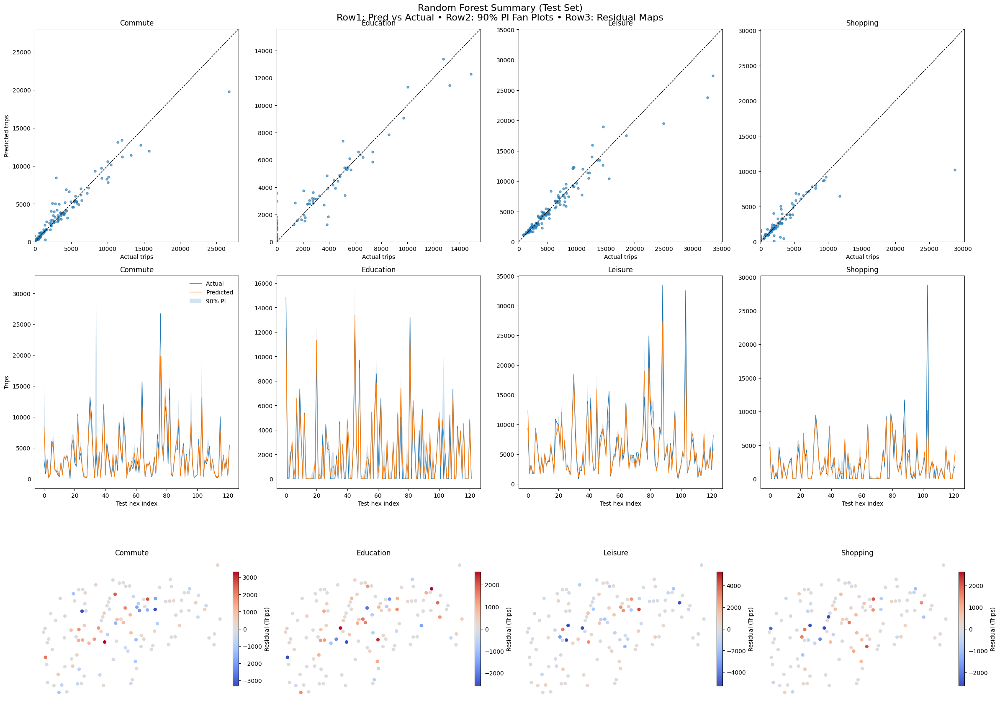

In [135]:
rf_results_df, rf_model, rf_unlabeled_preds, X_test_rf, rf_resid_gdf, rf_intervals = train_random_forest_model(
    hex_df=hex_all_merged,       # hex-level dataset (features + target trip amounts)
    hex_gdf=gdf_all,             # GeoDataFrame of all hexagons (for residual mapping)
    save_folder="outputs/plots", # where plots + CSVs will be saved
    n_bootstrap=40,              # bootstrap resamples to get 90% prediction intervals
    random_state=42,             # seed for reproducibility
    summary_filename="rf_summary_grid.png"  # filename for the 3-row summary figure
)

##### Inspect RF outputs

In [136]:
# Look at the test-set performance summary (MAE, RMSE, sMAPE, R² per purpose)
rf_results_df

,Trip Purpose,MAE,RMSE,sMAPE (%),R2 Score
0,amount_commute,624.274768,1167.840625,20.681657,0.913673
1,amount_education,487.396639,851.795569,104.287483,0.922013
2,amount_leisure,831.631393,1545.170951,12.361951,0.914394
3,amount_shopping,560.768361,1868.066850,67.930652,0.710338


In [121]:
# Check what prediction columns were created for the unlabeled hexes
rf_unlabeled_preds.columns

Index(['start_hex_id', 'total_trips', 'avg_start_hour', 'weekend_ratio',
       'avg_dist_park', 'avg_dist_school', 'avg_dist_retail',
       'avg_dist_transit', 'num_parks', 'num_schools', 'num_retail',
       'num_transit', 'amount_commute', 'amount_education', 'amount_leisure',
       'amount_shopping', 'rf_pred_commute', 'rf_pred_education',
       'rf_pred_leisure', 'rf_pred_shopping'],
      dtype='object')

In [122]:
# Rename RF-specific pred cols → generic ones (so downstream viz/analysis code doesn’t care which model they came from)
rf_unlabeled_preds.rename(
    columns={
        "rf_pred_commute": "pred_commute",
        "rf_pred_education": "pred_education",
        "rf_pred_leisure": "pred_leisure",
        "rf_pred_shopping": "pred_shopping"
    },
    inplace=True
)

# Make a clean copy for unseen predictions
df_unseen_pred = rf_unlabeled_preds.copy()

##### Quick Summary of Predictions
Print basic stats (count, mean, std, min, quartiles, max) for each predicted trip purpose on the unseen hexes.

In [124]:
print(df_unseen_pred.describe()[['pred_commute', 'pred_education', 'pred_leisure', 'pred_shopping']])

       pred_commute  pred_education  pred_leisure  pred_shopping
count   3079.000000     3079.000000   3079.000000    3079.000000
mean    2050.871062      910.045145    309.793439     376.113024
std      207.257413       55.897133     28.925924      18.940132
min     2029.000000      753.000000    283.000000     318.000000
25%     2032.000000      867.000000    286.000000     364.000000
50%     2035.000000      941.000000    297.000000     378.000000
75%     2044.000000      945.000000    337.000000     393.000000
max     9206.000000      965.000000    395.000000     425.000000


##### Evaluate predictions on unlabeled hexes

Idea: for hexes with total_trips == 0, the "truth" is 0.
We can check how far our model drifts away from that baseline.

In [130]:
def evaluate_predictions_on_unlabeled_hexes(df_unseen: pd.DataFrame, target_cols: list, pred_prefix='xgb_pred_') -> pd.DataFrame:
    """
    Evaluates predictions on hexes without trips (total_trips == 0).
    Metrics: MAE and RMSE against expected true values of 0.
    """
    eps = 1e-6  # tiny epsilon (if we want to add MAPE later)
    results = []
    
    for col in target_cols:
        # prediction col expected in form "xgb_pred_commute", etc.
        pred_col = f"{pred_prefix}{col.replace('amount_', '')}"
        true_vals = np.zeros(len(df_unseen))   # "ground truth" = all zero
        preds = df_unseen[pred_col].values

        # deviation from zero = error
        mae = mean_absolute_error(true_vals, preds)
        rmse = np.sqrt(mean_squared_error(true_vals, preds))

        results.append((col, mae, rmse))

    results_df = pd.DataFrame(results, columns=["Trip Purpose", "MAE", "RMSE"])
    
    print(f"\nEvaluation of Predictions on Unlabeled Hexes using prefix: '{pred_prefix}'")
    print(results_df)
    return results_df

In [131]:
# Evaluate predictions from Random Forest on unlabeled hexes
target_cols = ['amount_commute', 'amount_education', 'amount_leisure', 'amount_shopping']
evaluate_predictions_on_unlabeled_hexes(rf_unlabeled_preds, target_cols, pred_prefix='pred_')


Evaluation of Predictions on Unlabeled Hexes using prefix: 'pred_'
       Trip Purpose          MAE         RMSE
0    amount_commute  2050.871062  2061.313610
1  amount_education   910.045145   911.759639
2    amount_leisure   309.793439   311.140503
3   amount_shopping   376.113024   376.589456


,Trip Purpose,MAE,RMSE
0,amount_commute,2050.871062,2061.313610
1,amount_education,910.045145,911.759639
2,amount_leisure,309.793439,311.140503
3,amount_shopping,376.113024,376.589456


In [ ]:
# Plot histograms (with KDE overlay) for each trip purpose so we can see how the predicted counts are spread across hexes.
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
purposes = ['pred_commute', 'pred_education', 'pred_leisure', 'pred_shopping']

for ax, purpose in zip(axes.flat, purposes):
    sns.histplot(df_unseen_pred[purpose], kde=True, ax=ax)
    ax.set_title(f"Distribution of {purpose.replace('pred_', '').capitalize()} Predictions")
    ax.set_xlabel("Predicted Trip Count")
    ax.set_ylabel("Frequency")

plt.tight_layout()
plt.show()

In [139]:
# Smart Binning Function
# Automatically generate sensible bin edges for choropleths.
# This helps avoid bins being dominated by extreme outliers.
def get_smart_bins(gdf: gpd.GeoDataFrame, purpose_col: str, strategy: str = "log", bins: int = 6):
    values = gdf[purpose_col].dropna()
    values = values[values > 0]  # only positive values make sense for trips

    if len(values) == 0:
        raise ValueError(f"No positive values found in {purpose_col}. Cannot compute bins.")

    print(f"Value range for '{purpose_col}': min = {values.min()}, max = {values.max()}")

    if strategy == "log":
        # use ~1st–99.5th percentile to avoid extreme outliers
        log_min = max(1, np.percentile(values, 1))
        log_max = np.percentile(values, 99.5)
        bin_edges = np.round(np.geomspace(log_min, log_max, bins)).astype(int).tolist()

    elif strategy == "quantile":
        # evenly split into quantiles
        bin_edges = sorted(
            np.unique(
                np.percentile(values, np.linspace(0, 100, bins + 1))
            ).astype(int).tolist()
        )

    elif strategy == "fixed":
        # fallback hard-coded bins
        bin_edges = [0, 100, 500, 1000, 3000, 10000]

    else:
        raise ValueError("Unsupported bin strategy.")

    print(f"Bins for {purpose_col} ({strategy}): {bin_edges}")
    return bin_edges

In [140]:
# List of prediction columns
purpose_columns = [
    "pred_commute",
    "pred_education",
    "pred_leisure",
    "pred_shopping"
]

# Dictionary to hold purpose → bin edges
purpose_bins = {}

# Loop to compute log bins for each
for col in purpose_columns:
    purpose_bins[col] = get_smart_bins(df_unseen_pred, col, strategy="log", bins=6)

Value range for 'pred_commute': min = 2029.0, max = 9206.0
   Bins for pred_commute (log): [2030, 2043, 2056, 2069, 2083, 2096]
Value range for 'pred_education': min = 753.0, max = 965.0
   Bins for pred_education (log): [754, 791, 830, 872, 915, 960]
Value range for 'pred_leisure': min = 283.0, max = 395.0
   Bins for pred_leisure (log): [285, 303, 322, 342, 363, 386]
Value range for 'pred_shopping': min = 318.0, max = 425.0
   Bins for pred_shopping (log): [327, 345, 363, 382, 403, 425]


In [141]:
# View bin edges summary for each purpose 
purpose_bins

{'pred_commute': [2030, 2043, 2056, 2069, 2083, 2096],
 'pred_education': [754, 791, 830, 872, 915, 960],
 'pred_leisure': [285, 303, 322, 342, 363, 386],
 'pred_shopping': [327, 345, 363, 382, 403, 425]}

##### Add geometry from H3 hex IDs
Takes a DataFrame with H3 IDs and attaches centroid coordinates so we can map them as a GeoDataFrame later.

In [142]:
def add_geometry_from_hex(df: pd.DataFrame, hex_col: str = 'start_hex_id') -> gpd.GeoDataFrame:
    """
    Converts a DataFrame with H3 hex IDs to a GeoDataFrame with Point geometries
    based on hexagon centroids.
    """
    # pull out (lat, lon) from each hex ID
    df['lat'], df['lon'] = zip(*df[hex_col].map(lambda h: h3.cell_to_latlng(h)))
    
    # build shapely Point geometries from lon/lat
    df['geometry'] = df.apply(lambda row: Point(row['lon'], row['lat']), axis=1)
    
    # wrap into a GeoDataFrame with WGS84 (EPSG:4326)
    return gpd.GeoDataFrame(df, geometry='geometry', crs='EPSG:4326')

##### Convert predictions to GeoDataFrame (Web Mercator)

In [143]:
# Add centroid geometry from H3 hex IDs (WGS84 by default)
gdf_pred = add_geometry_from_hex(df_unseen_pred)

# Reproject to Web Mercator (EPSG:3857) for mapping/visualisation
gdf_web = gdf_pred.to_crs(epsg=3857)


Plot saved to: outputs/plots\grid_predicted_Random_forest.png


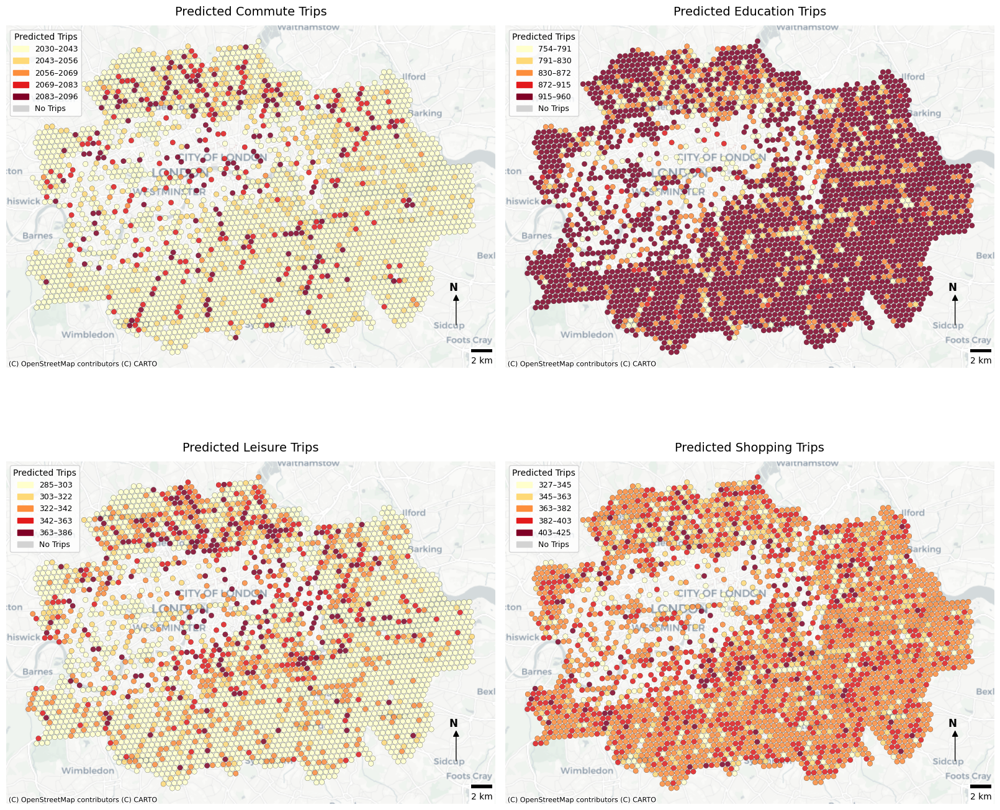

In [146]:
# Plot predicted trip purposes (RF)
plot_trip_purposes_grid(
    gdf_pred=gdf_web,
    value_prefix="pred_",                 # columns: pred_commute, pred_education, etc.
    title_prefix="Predicted",             # figure title prefix
    filename="grid_predicted_Random_forest.png"  # save to file
)

#### SHAP Interpretability
One figure with a SHAP summary subplot per target (e.g., 4 purposes).


Works with MultiOutputRegressor models (RF/XGB etc.) where each target has its own underlying estimator.

In [150]:
def explain_and_save_shap_multioutput_grid(
    model: MultiOutputRegressor,
    X: pd.DataFrame,
    target_names: list,
    name: str = "Random Forest",
    save_folder: str = "outputs/plots",
    max_display: int = 12,
    plot_type: str = "dot",   
    filename: str = None
):
    """
    Creates a single grid figure of SHAP summary plots (one per target) and saves it.

    Parameters
    ----------
    model : MultiOutputRegressor
        Trained multi-output model (e.g., RandomForest wrapped in MultiOutputRegressor).
    X : pd.DataFrame
        Feature matrix used for SHAP explanation (columns = feature names).
    target_names : list[str]
        Names of target variables in the same order as model.estimators_.
    name : str, optional
        Model label for figure titling (e.g. "Random Forest").
    save_folder : str, optional
        Directory to save the final grid figure.
    max_display : int, optional
        Max number of features to show per SHAP summary subplot.
    plot_type : {"dot","bar"}, optional
        SHAP summary style: "dot" (beeswarm) or "bar".
    filename : str, optional
        Custom filename. Defaults to f"{name}_shap_summary_grid.png".

    Notes
    -----
    - Uses SHAP's unified API: shap.Explainer(estimator).
    - For sklearn RandomForestRegressor, SHAP will dispatch to TreeExplainer internally.
    - To keep the figure clean, the colorbar is shown only on the first subplot for "dot".
    """

    print("Running SHAP explainability (grid) with saving enabled...\n")

    # grid size: 2 cols; rows expand automatically with number of targets
    n_targets = len(target_names)
    n_cols = 2
    n_rows = int(np.ceil(n_targets / n_cols))

    # create the master figure + normalize axes to a flat array for easy indexing
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(7 * n_cols, 5.5 * n_rows))
    axes = np.atleast_2d(axes).ravel()

    # loop each target’s estimator and render its SHAP summary into its slot
    for i, target in enumerate(target_names):
        print(f"  • SHAP summary for: {target}")
        est = model.estimators_[i]

        # build explainer (TreeExplainer under the hood for RF)
        explainer = shap.Explainer(est)
        shap_values = explainer(X, check_additivity=False)  # avoid additivity warnings on RF

        # choose the right axis, then point SHAP at it
        ax = axes[i]
        plt.sca(ax)

        # only the first dot-plot gets a colorbar to avoid clutter
        color_bar_flag = (plot_type == "dot" and i == 0)

        shap.summary_plot(
            shap_values,
            features=X,
            show=False,                 # layout + saving will be managed by the helper functions 
            max_display=max_display,
            plot_type=plot_type,        # "dot" (beeswarm) or "bar"
            color_bar=color_bar_flag
        )

        # simple, readable title (strip "amount_" prefix if present)
        ax.set_title(f"{target.replace('amount_', '').capitalize()}")

        # bar plots sometimes shrink labels; nudge size a bit
        ax.tick_params(axis='y', labelsize=9)

    # hide any extra axes if targets < grid cells
    for j in range(n_targets, len(axes)):
        axes[j].axis("off")

    # global title + layout
    fig.suptitle(f"{name} – SHAP Feature Importance (All Purposes)", fontsize=16)
    fig.tight_layout(rect=[0, 0, 1, 0.96])

    # save one clean figure for the paper/report
    out_name = filename or f"{name.replace(' ', '_').lower()}_shap_summary_grid.png"
    save_plot(fig, out_name, folder=save_folder)

    print(f"SHAP grid saved to: {save_folder}/{out_name}")

Running SHAP explainability (grid) with saving enabled...

  • SHAP summary for: amount_commute
  • SHAP summary for: amount_education
  • SHAP summary for: amount_leisure
  • SHAP summary for: amount_shopping
Plot saved to: outputs/plots\random_forest_shap_summary_grid.png
SHAP grid saved to: outputs/plots/random_forest_shap_summary_grid.png


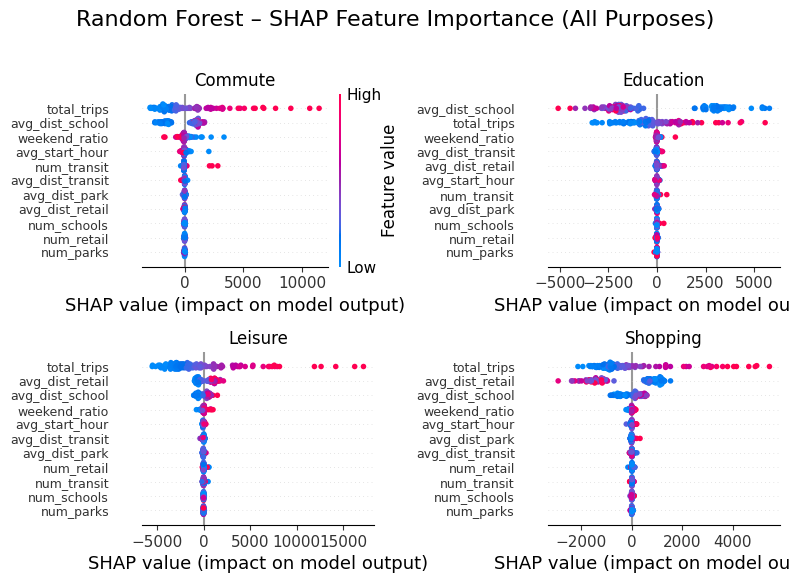

In [151]:
target_cols = ['amount_commute', 'amount_education', 'amount_leisure', 'amount_shopping']

# SHAP grid (beeswarm)
explain_and_save_shap_multioutput_grid(
    model=rf_model,          # trained MultiOutput RF
    X=X_test_rf,             # features used for explanation (test set here)
    target_names=target_cols,# order must match model.estimators_
    name="Random Forest",    # title prefix in the saved figure
    save_folder="outputs/plots",
    max_display=12,          # top-N features per subplot
    plot_type="dot",         # or "bar" if preferred
    filename=None            # auto filename as established in function 
)


### XGBoost: Train → Evaluate → Explain → Visualize → Predict Unlabeled

Mirrors the RF pipeline: tunes XGB (multi-output), evaluates (MAE/RMSE/R² [+ sMAPE opt]), makes a single 3×4 summary figure, saves a SHAP grid, and predicts for unlabeled hexes.


In [152]:
from xgboost import XGBRegressor

In [153]:
def train_and_evaluate_xgboost(
    hex_df: pd.DataFrame,
    hex_gdf: gpd.GeoDataFrame,
    save_folder: str = "outputs/plots",
    test_size: float = 0.2,
    random_state: int = 42,
    n_bootstrap: int = 40,
    include_smape: bool = False,          # keep sMAPE internal; include in table only if True
    summary_filename: str = "xgb_summary_grid.png",
    shap_filename: str = "xgb_shap_summary_grid.png"
):
    """
    Train tuned XGBoost (multi-output) to predict trip-purpose amounts, evaluate, explain, and visualize.

    Outputs (side effects):
      - Saves ONE master figure with 3 rows × 4 cols:
         Row 1: Predicted vs Actual (scatter)
         Row 2: Fan plots = Actual & Predicted lines + shaded 90% PI (bootstrap)
         Row 3: Residual maps (predicted − actual)
      - Saves SHAP summary grid (beeswarm) for all purposes in one figure.

    Returns:
      best_results_df : pd.DataFrame   # MAE/RMSE/(sMAPE)/R² per target on test set
      best_model      : MultiOutputRegressor(XGBRegressor)
      df_unlabeled    : pd.DataFrame   # copy of unlabeled hex rows with XGB predictions appended
      X_test          : pd.DataFrame   # held-out features
      resid_gdf       : gpd.GeoDataFrame  # geometry + residuals for test hexes
      intervals       : dict(target -> {'low': np.ndarray, 'high': np.ndarray}) # 90% PIs on test
    """

    # sMAPE kept optional to avoid clutter unless explicitly needed
    def _smape(y_true: np.ndarray, y_pred: np.ndarray) -> float:
        """Symmetric MAPE (percentage), robust when y_true has zeros."""
        y_true = np.asarray(y_true, dtype=float)
        y_pred = np.asarray(y_pred, dtype=float)
        denom = (np.abs(y_true) + np.abs(y_pred)) / 2.0
        mask = denom > 0
        if not np.any(mask):
            return float("nan")
        return float(np.mean(np.abs(y_true[mask] - y_pred[mask]) / denom[mask]) * 100.0)

    def _evaluate(y_test_df: pd.DataFrame, y_pred_arr: np.ndarray, target_cols: list[str], include_smape: bool = False) -> pd.DataFrame:
        """Return MAE, RMSE, (optional sMAPE), and R² per target (tidy frame)."""
        rows = []
        for i, col in enumerate(target_cols):
            yt = y_test_df[col].values
            yp = y_pred_arr[:, i]
            row = {
                "Trip Purpose": col,
                "MAE": mean_absolute_error(yt, yp),
                "RMSE": float(np.sqrt(mean_squared_error(yt, yp))),
                "R2 Score": r2_score(yt, yp)
            }
            if include_smape:
                row["sMAPE (%)"] = _smape(yt, yp)
            rows.append(row)
        return pd.DataFrame(rows)


    # 1) Columns / Features
    # Targets are the four trip amounts; exclude IDs and any pre-existing pred cols.
    target_cols = ['amount_commute', 'amount_education', 'amount_leisure', 'amount_shopping']
    exclude_cols = ['start_hex_id', 'pred_commute', 'pred_education', 'pred_leisure', 'pred_shopping']
    feature_cols = [c for c in hex_df.columns if c not in exclude_cols + target_cols]
    print("Features used for training (XGB):", feature_cols)


    # 2) Labeled subset + key hygiene
    # Use only rows with observed trips; align hex key consistently.
    training_df = hex_df[hex_df['total_trips'] > 0].copy()
    if 'start_hex_id' not in training_df.columns:
        if 'hex_id' in training_df.columns:
            training_df = training_df.rename(columns={'hex_id': 'start_hex_id'})
        elif 'tart_hex_id' in training_df.columns:  # tolerate typo from earlier stages
            training_df = training_df.rename(columns={'tart_hex_id': 'start_hex_id'})
        else:
            raise KeyError("No hex key found. Expect 'start_hex_id' (or 'hex_id'/'tart_hex_id').")
    training_df['start_hex_id'] = training_df['start_hex_id'].astype(str)

    # all targets must be present
    missing_targets = [c for c in target_cols if c not in training_df.columns]
    if missing_targets:
        raise KeyError(f"Missing target columns for training: {missing_targets}")

    X = training_df[feature_cols]
    y = training_df[target_cols]
    hex_ids_all = training_df['start_hex_id']  # aligned with X indices

    # standard split (no stratify for regression)
    X_train, X_test, y_train, y_test = train_test_split(
        X, y, test_size=test_size, random_state=random_state
    )

    # 3) Randomized tuning
    # Multi-output wrapper runs one XGB per target under the hood.
    xgb_base = MultiOutputRegressor(
        XGBRegressor(objective="reg:squarederror", random_state=random_state, n_jobs=-1)
    )

    # modest but effective space to search
    param_dist = {
        "estimator__n_estimators": [200, 300, 400, 500],
        "estimator__max_depth": [4, 6, 8, 10],
        "estimator__learning_rate": [0.03, 0.05, 0.1],
        "estimator__subsample": [0.7, 0.85, 1.0],
        "estimator__colsample_bytree": [0.7, 0.85, 1.0],
        "estimator__min_child_weight": [1, 3, 5],
        "estimator__gamma": [0, 0.1, 0.3]
    }

    random_search = RandomizedSearchCV(
        estimator=xgb_base,
        param_distributions=param_dist,
        n_iter=25,
        scoring="neg_mean_absolute_error",
        cv=5,
        random_state=random_state,
        n_jobs=-1,
        verbose=2,
        return_train_score=True
    )
    random_search.fit(X_train, y_train)

    print("\n=== XGB: Top Parameters from RandomizedSearchCV ===")
    print(random_search.best_params_)
    print("Best CV MAE:", -random_search.best_score_)

    # keep the full tuning trace for reproducibility
    tuning_results = pd.DataFrame(random_search.cv_results_).sort_values(by="rank_test_score")
    tuning_results.to_csv(f"{save_folder}/xgb_random_search_results.csv", index=False)


    # 4) Evaluate top-3 candidates on test set
    # Sanity-check the winners against the holdout to avoid CV overfitting.
    top_params = tuning_results.head(3)["params"].tolist()
    best_model = None
    best_test_r2 = -np.inf
    best_results_df = None
    best_pred_test = None

    for idx, params in enumerate(top_params, start=1):
        print(f"\n[XGB Testing Candidate {idx}] Params: {params}")
        model = MultiOutputRegressor(XGBRegressor(
            objective="reg:squarederror",
            random_state=random_state,
            n_jobs=-1,
            **{k.replace("estimator__", ""): v for k, v in params.items()}
        ))

        # Fit + predict
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)

        # Metrics table (optionally includes sMAPE)
        results_df = _evaluate(y_test, y_pred, target_cols, include_smape=include_smape)
        print(results_df)
        print("Average R²:", results_df["R2 Score"].mean())

        # Keep the model with the highest mean R² across purposes
        if results_df["R2 Score"].mean() > best_test_r2:
            best_test_r2 = results_df["R2 Score"].mean()
            best_model = model
            best_results_df = results_df
            best_pred_test = y_pred

    print("\n=== Selected Best XGBoost Model (by test R²) ===")
    print(best_results_df)
    # Save clean metrics (columns aligned with RF table)
    out_cols = ["Trip Purpose", "MAE", "RMSE", "R2 Score"] + (["sMAPE (%)"] if include_smape else [])
    best_results_df[out_cols].to_csv(f"{save_folder}/xgb_test_metrics.csv", index=False)


    # 5) Residuals (test) + join to hex geometry
    # Build residual frame and merge onto the GeoDataFrame for mapping.
    resid_df = make_residuals_df(
        test_index=X_test.index,
        y_test=y_test,
        y_pred=best_pred_test,
        hex_ids=hex_ids_all,       # function will use .loc[test_index]
        target_cols=target_cols
    ).copy()

    gdf_local = hex_gdf.copy()
    if 'hex_id' in gdf_local.columns and 'start_hex_id' not in gdf_local.columns:
        gdf_local = gdf_local.rename(columns={'hex_id': 'start_hex_id'})
    if 'start_hex_id' not in gdf_local.columns:
        raise KeyError("hex_gdf must include 'start_hex_id' (or 'hex_id').")

    gdf_local['start_hex_id'] = gdf_local['start_hex_id'].astype(str)
    resid_df['start_hex_id'] = resid_df['start_hex_id'].astype(str)
    resid_gdf = gdf_local.merge(resid_df, on='start_hex_id', how='inner')


    # 6) Bootstrap Prediction Intervals (test) - 90% PIs
    # Simple bootstrap over training rows using the best param set from top candidates.
    base_params = {k.replace("estimator__", ""): v for k, v in top_params[0].items()}
    boot_preds = np.zeros((n_bootstrap, len(X_test), len(target_cols)))
    rng = np.random.default_rng(random_state)

    for b in range(n_bootstrap):
        sample_idx = rng.choice(len(X_train), size=len(X_train), replace=True)
        Xb = X_train.iloc[sample_idx]
        yb = y_train.iloc[sample_idx]
        boot_model = MultiOutputRegressor(XGBRegressor(
            objective="reg:squarederror",
            random_state=random_state + b,
            n_jobs=-1,
            **base_params
        ))
        boot_model.fit(Xb, yb)
        boot_preds[b] = boot_model.predict(X_test)

    # convert bootstrap draws into central 90% bands per purpose
    intervals = {}
    alpha_low, alpha_high = 5, 95
    for i, col in enumerate(target_cols):
        low = np.percentile(boot_preds[:, :, i], alpha_low, axis=0)
        high = np.percentile(boot_preds[:, :, i], alpha_high, axis=0)
        intervals[col] = {"low": low, "high": high}


    # 7) One Master Figure (3 rows): scatter, fan plots, maps
    n_targets = len(target_cols)
    fig, axes = plt.subplots(
        nrows=3, ncols=n_targets,
        figsize=(6 * n_targets, 18),
        constrained_layout=False
    )

    def ax_rc(r, c):
        return axes[r, c] if n_targets > 1 else axes[r]

    # Row 1: Predicted vs Actual (scatter)
    for j, col in enumerate(target_cols):
        yt = y_test[col].values
        yp = best_pred_test[:, j]
        ax = ax_rc(0, j)
        ax.scatter(yt, yp, s=14, alpha=0.6)
        # 45-degree reference
        lim = [0, max(np.nanmax(yt), np.nanmax(yp)) * 1.05]
        ax.plot(lim, lim, 'k--', linewidth=1)
        ax.set_xlim(lim); ax.set_ylim(lim)
        ax.set_xlabel("Actual trips")
        if j == 0:
            ax.set_ylabel("Predicted trips")
        ax.set_title(col.replace("amount_", "").capitalize())

    # Row 2: Fan plots (Actual & Pred + shaded 90% PI)
    for j, col in enumerate(target_cols):
        yt = y_test[col].values
        yp = best_pred_test[:, j]
        low = intervals[col]["low"]; high = intervals[col]["high"]
        x = np.arange(len(yt))
        ax = ax_rc(1, j)
        ax.plot(x, yt, label="Actual", linewidth=1)
        ax.plot(x, yp, label="Predicted", linewidth=1)
        ax.fill_between(x, low, high, alpha=0.2, label="90% PI")
        ax.set_xlabel("Test hex index")
        if j == 0:
            ax.set_ylabel("Trips")
        ax.set_title(col.replace("amount_", "").capitalize())
        if j == 0:
            ax.legend(frameon=False)

    # Row 3: Residual maps (pred - actual)
    for j, col in enumerate(target_cols):
        vals = resid_gdf[f"resid_{col}"].values
        # robust scaling to prevent outliers from blowing up the color range
        vmax = np.percentile(np.abs(vals[np.isfinite(vals)]), 98) if np.isfinite(vals).any() else 1.0
        norm = TwoSlopeNorm(vmin=-vmax, vcenter=0.0, vmax=vmax)
        ax = ax_rc(2, j)
        resid_gdf.plot(column=f"resid_{col}", cmap="coolwarm", linewidth=0, ax=ax, norm=norm)
        ax.set_axis_off()
        ax.set_title(col.replace("amount_", "").capitalize())

        sm = plt.cm.ScalarMappable(cmap="coolwarm", norm=norm)
        sm._A = []
        cbar = fig.colorbar(sm, ax=ax, fraction=0.028, pad=0.02)
        cbar.set_label("Residual (Trips)")

    fig.suptitle(
        "XGBoost Summary (Test Set)\nRow1: Pred vs Actual • Row2: 90% PI Fan Plots • Row3: Residual Maps",
        fontsize=16
    )
    fig.tight_layout()
    save_plot(fig, summary_filename, folder=save_folder)


    # 8) SHAP summary grid (beeswarm) in one figure
    explain_and_save_shap_multioutput_grid(
        model=best_model,
        X=X_test,
        target_names=target_cols,
        name="XGBoost",
        save_folder=save_folder,
        max_display=12,
        plot_type="dot",
        filename=shap_filename
    )


    # 9) Predict for unlabeled (totals == 0)
    # Same features; fill the "gaps" for hexes with no observed trips.
    df_unlabeled = hex_df[hex_df['total_trips'] == 0].copy()
    if 'start_hex_id' not in df_unlabeled.columns:
        if 'hex_id' in df_unlabeled.columns:
            df_unlabeled.rename(columns={'hex_id': 'start_hex_id'}, inplace=True)
        elif 'tart_hex_id' in df_unlabeled.columns:
            df_unlabeled.rename(columns={'tart_hex_id': 'start_hex_id'}, inplace=True)
    if 'start_hex_id' in df_unlabeled.columns:
        df_unlabeled['start_hex_id'] = df_unlabeled['start_hex_id'].astype(str)

    X_unlabeled = df_unlabeled[feature_cols]
    y_unlabeled_pred = best_model.predict(X_unlabeled)
    pred_cols = [f"xgb_pred_{c.replace('amount_', '')}" for c in target_cols]
    df_unlabeled[pred_cols] = np.round(y_unlabeled_pred, 0)

    return best_results_df, best_model, df_unlabeled, X_test, resid_gdf, intervals

##### Train + Explain XGBoost (multi-output)

Mirrors the RF run: tunes XGB, saves summary figure + SHAP grid, and returns metrics, model, unlabeled predictions, test features, residual GeoDF, and prediction intervals.

Features used for training (XGB): ['total_trips', 'avg_start_hour', 'weekend_ratio', 'avg_dist_park', 'avg_dist_school', 'avg_dist_retail', 'avg_dist_transit', 'num_parks', 'num_schools', 'num_retail', 'num_transit']
Fitting 5 folds for each of 25 candidates, totalling 125 fits

=== XGB: Top Parameters from RandomizedSearchCV ===
{'estimator__subsample': 0.7, 'estimator__n_estimators': 300, 'estimator__min_child_weight': 3, 'estimator__max_depth': 6, 'estimator__learning_rate': 0.03, 'estimator__gamma': 0.3, 'estimator__colsample_bytree': 1.0}
Best CV MAE: 692.789453125

[XGB Testing Candidate 1] Params: {'estimator__subsample': 0.7, 'estimator__n_estimators': 300, 'estimator__min_child_weight': 3, 'estimator__max_depth': 6, 'estimator__learning_rate': 0.03, 'estimator__gamma': 0.3, 'estimator__colsample_bytree': 1.0}
       Trip Purpose         MAE         RMSE  R2 Score
0    amount_commute  648.318522  1375.909773  0.880171
1  amount_education  633.632770  1337.440757  0.807735
2    

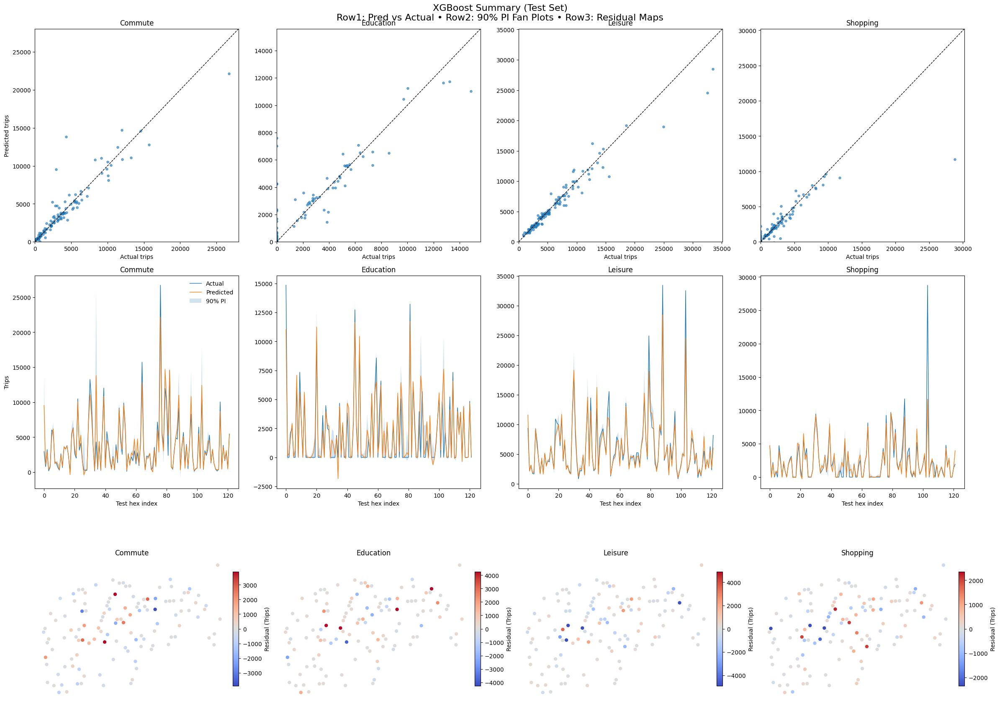

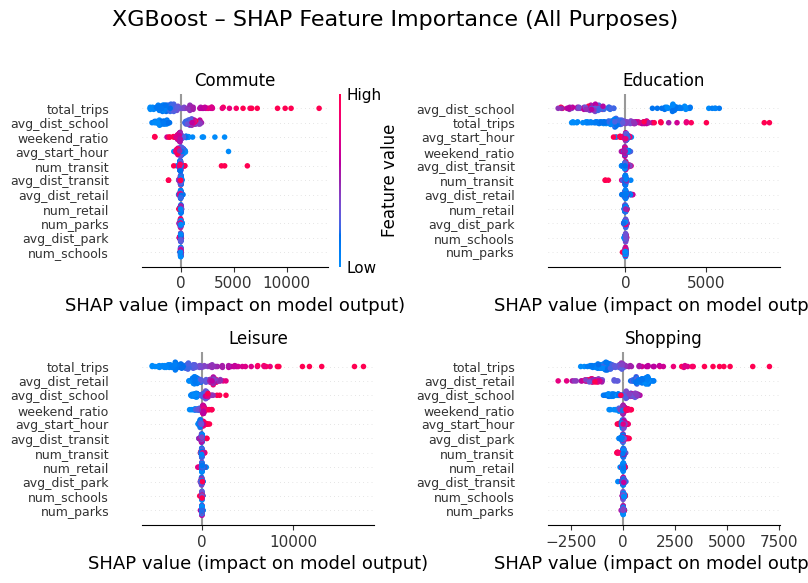

In [154]:
xgb_results_df, xgb_model, xgb_unlabeled, X_test_xgb, xgb_resid_gdf, xgb_intervals = train_and_evaluate_xgboost(
    hex_df=hex_all_merged,          # full hex-level table (features + targets)
    hex_gdf=gdf_all,                # hex geometries for residual mapping
    save_folder="outputs/plots",    # where plots/CSV outputs go
    test_size=0.2,                  # 80/20 split
    random_state=42,                # reproducibility
    n_bootstrap=40,                 # bootstrap draws for 90% PIs
    include_smape=False,            # keep table tidy; set True to add sMAPE (%)
    summary_filename="xgb_summary_grid.png",         # 3-row summary fig
    shap_filename="xgb_shap_summary_grid.png"        # SHAP grid (beeswarm)
)

In [155]:
# View DataFrame of XGBoost model performance on the test set.  
xgb_results_df

,Trip Purpose,MAE,RMSE,R2 Score
0,amount_commute,648.318522,1375.909773,0.880171
1,amount_education,633.632770,1337.440757,0.807735
2,amount_leisure,680.580348,1354.897987,0.934179
3,amount_shopping,536.651238,1691.410279,0.762532


In [163]:
# Setup Target & Feature Columns

target_cols = ['amount_commute', 'amount_education', 'amount_leisure', 'amount_shopping']
exclude_cols = ['start_hex_id', 'pred_commute', 'pred_education', 'pred_leisure', 'pred_shopping']

# use only rows with observed trips to define the training feature set
training_df = hex_all_merged[hex_all_merged['total_trips'] > 0].copy()

# features = everything except IDs/pred columns + the targets
feature_cols = [col for col in training_df.columns if col not in exclude_cols + target_cols]

# Predict on Unlabeled Hexes (total_trips == 0)
df_unseen = hex_all_merged[hex_all_merged['total_trips'] == 0].copy()
X_unseen = df_unseen[feature_cols]

# run the trained XGB model on the unseen feature matrix
y_unseen_pred = xgb_model.predict(X_unseen)

# attach predictions (one column per purpose)
pred_cols = [f"xgb_pred_{col.replace('amount_', '')}" for col in target_cols]
df_unseen[pred_cols] = y_unseen_pred

# round for readability in tables/plots (values are counts)
df_unseen[pred_cols] = df_unseen[pred_cols].round(0)

# Add Geometry
# add centroid geometry from H3 so we can map predictions later
gdf_unseen_pred_xgb = add_geometry_from_hex(df_unseen)

# Preview Results
# quick peek at the output columns we care about
display_cols = ['start_hex_id'] + pred_cols + ['lat', 'lon']
print("\nreview of XGBoost Predictions on Unlabeled Hexes:")
print(gdf_unseen_pred_xgb[display_cols].head())



review of XGBoost Predictions on Unlabeled Hexes:
      start_hex_id  xgb_pred_commute  xgb_pred_education  xgb_pred_leisure  \
0  89194ad1dd7ffff            2363.0               995.0             386.0   
1  89194e6d49bffff            2346.0               995.0             378.0   
3  89194ad02bbffff            2409.0               901.0             398.0   
4  89194ad3117ffff            2374.0               928.0             404.0   
5  89194ad85d3ffff            2386.0               980.0             391.0   

   xgb_pred_shopping        lat       lon  
0              416.0  51.428179 -0.071009  
1              417.0  51.510519  0.109155  
3              420.0  51.457337 -0.071211  
4              366.0  51.495299 -0.052596  
5              396.0  51.459841 -0.244528  


In [ ]:
# Evaluate predictions from XGBoost on unlabeled hexes
evaluate_predictions_on_unlabeled_hexes(xgb_unlabeled, target_cols, pred_prefix='xgb_pred_')

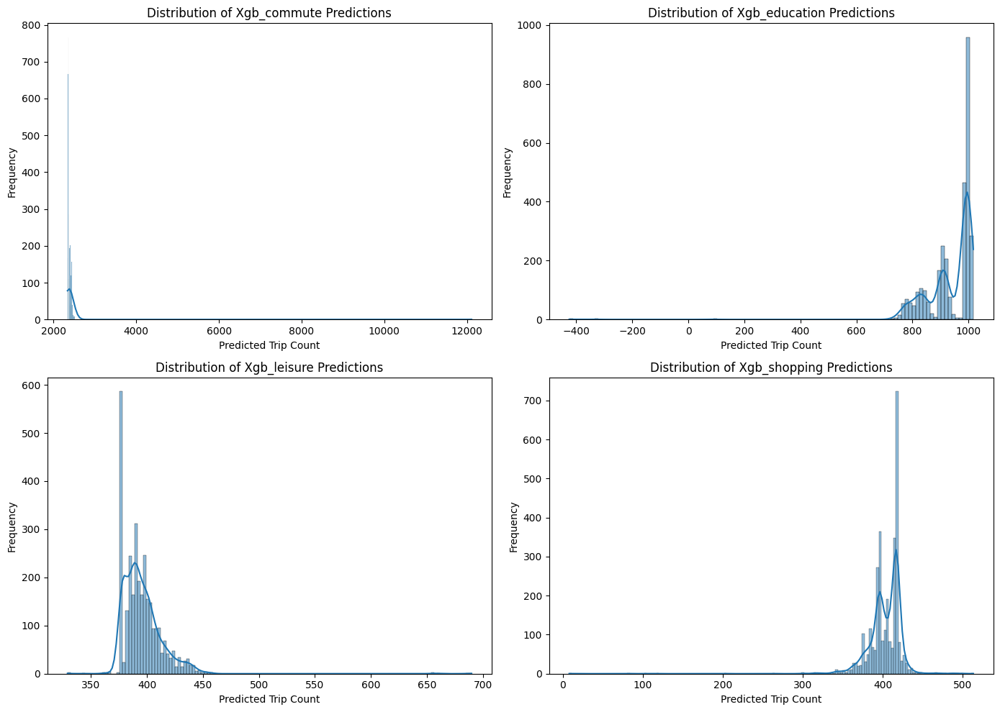

Value range for 'xgb_pred_commute': min = 2336.0, max = 12114.0
   Bins for xgb_pred_commute (log): [2336, 2369, 2403, 2437, 2471, 2506]
Value range for 'xgb_pred_education': min = 69.0, max = 1017.0
   Bins for xgb_pred_education (log): [760, 806, 854, 905, 959, 1017]
Value range for 'xgb_pred_leisure': min = 329.0, max = 690.0
   Bins for xgb_pred_leisure (log): [378, 391, 405, 419, 434, 450]
Value range for 'xgb_pred_shopping': min = 8.0, max = 513.0
   Bins for xgb_pred_shopping (log): [343, 363, 384, 406, 429, 454]
Plot saved to: outputs/plots\grid_predicted_XGB.png


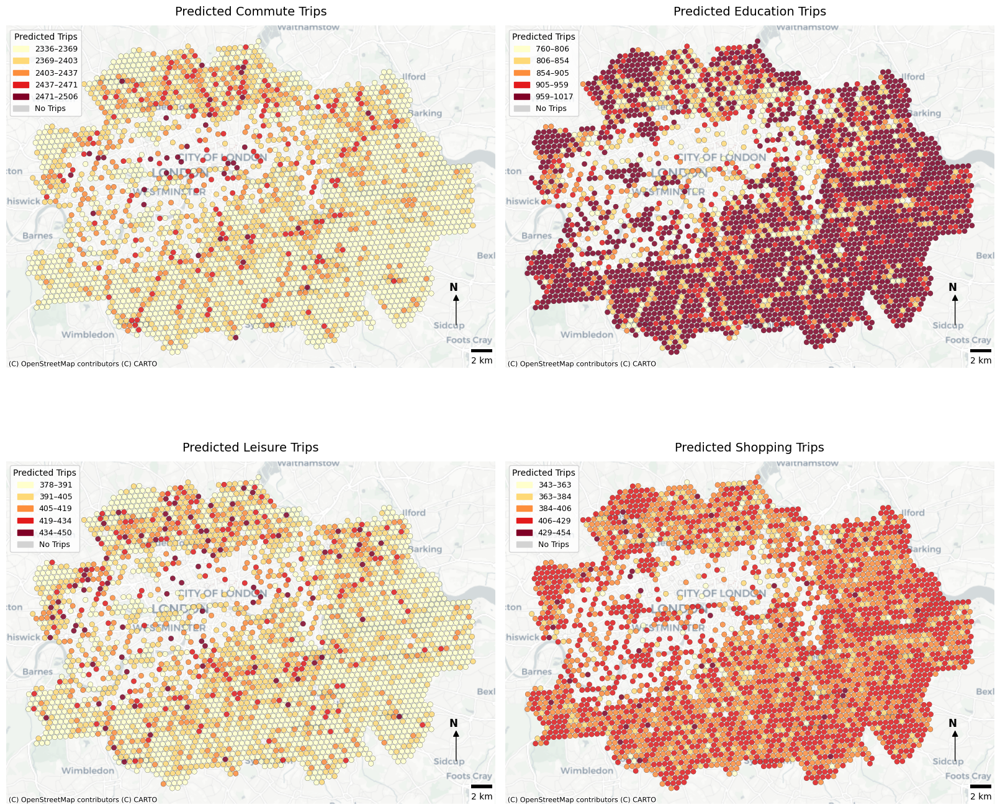

In [165]:
# Distributions of XGB Predictions
# Histograms (with KDE) for each predicted purpose to see spread/skew.
fig, axes = plt.subplots(2, 2, figsize=(14, 10))
purposes = ['xgb_pred_commute', 'xgb_pred_education', 'xgb_pred_leisure', 'xgb_pred_shopping']

for ax, purpose in zip(axes.flat, purposes):
    sns.histplot(df_unseen[purpose], kde=True, ax=ax)
    ax.set_title(f"Distribution of {purpose.replace('pred_', '').capitalize()} Predictions")
    ax.set_xlabel("Predicted Trip Count")
    ax.set_ylabel("Frequency")

plt.tight_layout()
plt.show()

# Compute smart bins per purpose (log-spaced)
# Build a dict of bin edges for choropleths so classes aren’t dominated by outliers.

# List of prediction columns
purpose_columns_xgb = [
    "xgb_pred_commute",
    "xgb_pred_education",
    "xgb_pred_leisure",
    "xgb_pred_shopping"
]

# Dictionary to hold purpose → bin edges
purpose_bins_xgb = {}

# Loop to compute log bins for each
for col in purpose_columns_xgb:
    purpose_bins_xgb[col] = get_smart_bins(df_unseen, col, strategy="log", bins=6)

# Map XGB predictions (Web Mercator)
# Add geometry from H3, reproject for web mapping, then plot a purpose grid.
gdf_pred_xgb = add_geometry_from_hex(df_unseen)
gdf_web_xgb = gdf_pred_xgb.to_crs(epsg=3857)

plot_trip_purposes_grid(
    gdf_pred=gdf_web_xgb,
    value_prefix="xgb_pred_",                 # expects xgb_pred_commute, etc.
    title_prefix="Predicted",                 # figure title prefix
    filename="grid_predicted_XGB.png"         # output image name
)

### Random Forest vs XGBoost Comparison

##### Comparative MAE & R² Bar Charts
Plots side-by-side bars so it’s easy to compare models per trip purpose.

In [ ]:
def plot_comparative_mae_r2(results_dict, save_folder="outputs/plots", filename="comparative_mae_r2.png"):
    """
    Create comparative bar charts of MAE and R² across models and trip purposes,
    saving the result using the save_plot() function.

    Parameters:
    - results_dict: dict, {model_name: results_df}, where results_df has columns ["Trip Purpose", "MAE", "R2 Score"]
    - save_folder: folder path for saving the plot
    - filename: filename for saving
    """
    # Combine all model results into one table
    combined = []
    for model_name, df in results_dict.items():
        temp = df.copy()
        temp["Model"] = model_name  # tag rows with the model name for plotting
        combined.append(temp)
    combined_df = pd.concat(combined, ignore_index=True)

    # Reshape for seaborn (wide -> long)
    mae_df = combined_df.melt(
        id_vars=["Trip Purpose", "Model"], value_vars=["MAE"], 
        var_name="Metric", value_name="Value"
    )
    r2_df = combined_df.melt(
        id_vars=["Trip Purpose", "Model"], value_vars=["R2 Score"], 
        var_name="Metric", value_name="Value"
    )

    fig, axes = plt.subplots(1, 2, figsize=(14, 6))

    # MAE Chart 
    sns.barplot(data=mae_df, x="Trip Purpose", y="Value", hue="Model", ax=axes[0])
    axes[0].set_title("Comparative MAE Across Models")
    axes[0].set_ylabel("MAE (Trips)")
    axes[0].set_xlabel("Trip Purpose")
    axes[0].grid(axis="y", alpha=0.3)

    # R² Chart 
    sns.barplot(data=r2_df, x="Trip Purpose", y="Value", hue="Model", ax=axes[1])
    axes[1].set_title("Comparative R² Across Models")
    axes[1].set_ylabel("R² Score")
    axes[1].set_xlabel("Trip Purpose")
    axes[1].set_ylim(0, 1)  # keeps the R² axis consistent
    axes[1].grid(axis="y", alpha=0.3)

    fig.tight_layout()

    # Save
    save_plot(fig, filename, folder=save_folder)
    plt.close(fig)
    print(f"Comparative MAE & R² bar charts saved as {filename} in {save_folder}")

In [ ]:
results_dict = {
    "Random Forest": rf_results_df,
    "XGBoost": xgb_results_df
}

plot_comparative_mae_r2(results_dict, save_folder="outputs/plots", filename="comparative_mae_r2.png")


### Model Performance Comparison: Random Forest vs. XGBoost

The table below summarises the predictive performance of the Random Forest and XGBoost models on the test set, evaluated using **Mean Absolute Error (MAE)** and **R² Score** for each trip purpose category:

| Trip Purpose | RF MAE  | RF R²   | XGB MAE | XGB R²  | Best Model        |
|--------------|---------|---------|---------|---------|-------------------|
| Commute      | **624.27** | **0.9137** | 648.32  | 0.8802  | **Random Forest** |
| Education    | **487.40** | **0.9220** | 633.63  | 0.8077  | **Random Forest** |
| Leisure      | 831.63  | 0.9144  | **680.58** | **0.9342** | **XGBoost**        |
| Shopping     | 560.77  | 0.7103  | **536.65** | **0.7625** | **XGBoost**        |

#### Insights:
- **Random Forest** performs best on **commute** and **education**, achieving both lower MAE and higher R² values, indicating stronger accuracy and explanatory power.  
- **XGBoost** outperforms Random Forest on **leisure** and **shopping**, providing lower MAE and higher R², particularly excelling for leisure with an R² of 0.93.  
- The results highlight a **complementary strength**: Random Forest is more reliable for education- and commute-related patterns, while XGBoost captures leisure and shopping behaviours more effectively.  

#### Conclusion:
No single model dominates across all trip purposes. Instead, the evidence supports a **hybrid modelling strategy**:  
- **Random Forest** is best applied to **commuting** and **education** predictions.  
- **XGBoost** should be used for **leisure** and **shopping** trips.  

This hybrid approach leverages the strengths of both algorithms, maximising predictive accuracy and ensuring more interpretable and realistic inference of urban cycling trip purposes.  
